# Mojdeh Ghadami
### Student ID : 202405392

### Note: 
For this assignment, I used sqlite3 to extract data for each question individually. Although a full pandas-based approach was possible, this method provided greater transparency at each step of the analysis.

# Data

In [1]:
import sqlite3
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")


plt.style.use('dark_background')

In [2]:
con = sqlite3.connect('accident_data_v1.0.0_2023 (1).db')
cur = con.cursor()

In [3]:
tables = ["accident", "vehicle", "casualty", "lsoa"]
columns_by_table = {}

for table in tables:
    columns = []
    for row in cur.execute(f"PRAGMA table_info({table})"):
        columns.append(row[1])
    columns_by_table[table] = columns

# To print:
for table, columns in columns_by_table.items():
    print(f"{table}: {columns}")


accident: ['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']
vehicle: ['vehicle_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'vehicle_type', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direct

In [4]:
column_accident = columns_by_table["accident"]
column_vehicle = columns_by_table["vehicle"]
column_casualty = columns_by_table["casualty"]
column_Isoa = columns_by_table["lsoa"]

# Now I can use them individually

# Q1

In [5]:
cur.execute('''
SELECT DISTINCT day_of_week FROM accident;
''')

accidents_date = cur.fetchall()
print (accidents_date)

[(7,), (1,), (2,), (3,), (4,), (5,), (6,)]


### 1 ----> Sunday
### 2 ----> Monday
### 3 ----> Tuesday
### 4 ----> Wednesday
### 5 ----> Thursday
### 6 ----> Friday
### 7 ----> Saturday

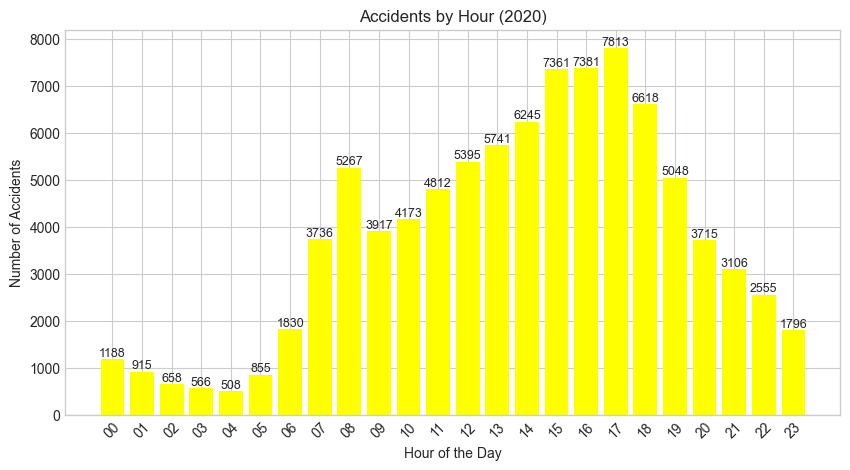

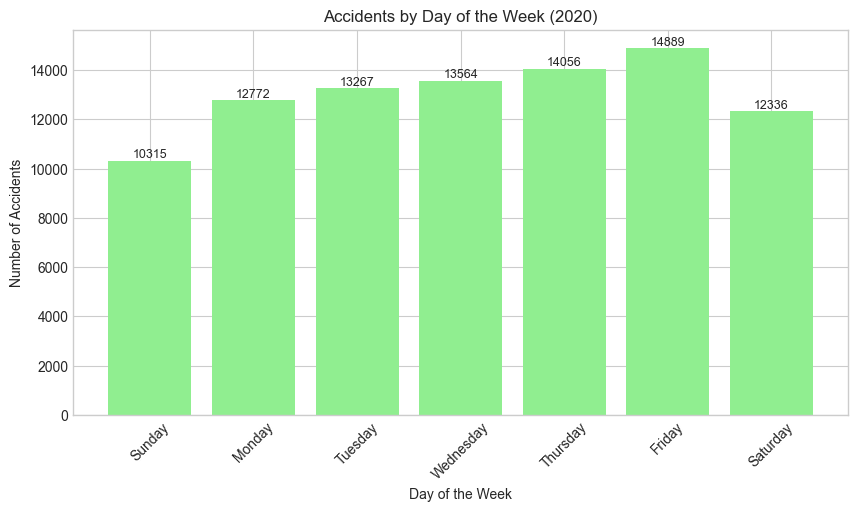

In [16]:
# Query for hours
query_hours = """
SELECT strftime('%H', time) AS accident_hour, COUNT(*) AS accident_count
FROM accident
WHERE accident_year = 2020
GROUP BY accident_hour
ORDER BY accident_hour;
"""
df_hours = pd.read_sql_query(query_hours, con)

# Query for days
query_days = """
SELECT day_of_week, COUNT(*) AS accident_count
FROM accident
WHERE accident_year = 2020
GROUP BY day_of_week
ORDER BY day_of_week;
"""
df_days = pd.read_sql_query(query_days, con)


# Set the style to 'seaborn-v0_8-whitegrid' for a light background with gridlines
plt.style.use('seaborn-v0_8-whitegrid')

# Plot accidents by hour
plt.figure(figsize=(10,5))
plt.bar(df_hours['accident_hour'], df_hours['accident_count'], color='yellow')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Hour (2020)')
plt.xticks(rotation=45)

# Add text annotations on top of each bar
for i, count in enumerate(df_hours['accident_count']):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=9)

plt.show()

# Plot accidents by day of the week
# Mapping numbers to weekday names
days_mapping = {1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 
                5: 'Thursday', 6: 'Friday', 7: 'Saturday'}

# Replace numbers with day names in x-axis
plt.figure(figsize=(10,5))
plt.bar(df_days['day_of_week'], df_days['accident_count'], color='lightgreen')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Day of the Week (2020)')

# Set custom labels
plt.xticks(ticks=df_days['day_of_week'], labels=[days_mapping[d] for d in df_days['day_of_week']], rotation=45)

# Add text annotations on top of each bar
for i, count in enumerate(df_days['accident_count']):
    plt.text(df_days['day_of_week'][i], count + 0.5, str(count), ha='center', va='bottom', fontsize=9)

plt.show()


# Q2

In [19]:
# checking for odd values
cur.execute('''
SELECT DISTINCT vehicle_type FROM vehicle;
''')

vehicle_type = cur.fetchall()
print (vehicle_type)

[(9,), (2,), (3,), (8,), (1,), (11,), (19,), (4,), (90,), (21,), (5,), (10,), (20,), (17,), (16,), (18,), (98,), (-1,), (23,), (22,), (97,), (99,)]


In [20]:
# we have -1
# counting how many -1 we have

cur.execute('''
SELECT count(vehicle_type) FROM vehicle 
where vehicle_type = -1;
''')
unclean_vehicle_type = cur.fetchall()
print (unclean_vehicle_type)

[(791,)]


In [21]:
# checking whether -1s blong to year 2020?


cur.execute('''
SELECT accident.accident_index from accident
JOIN vehicle ON accident.accident_index = vehicle.accident_index 
JOIN casualty ON accident.accident_index = casualty.accident_index 
WHERE accident.accident_year = 2020 
AND vehicle.vehicle_type = -1;
''')
time_accident = cur.fetchall()
print (time_accident)

[]


So, no cleaning is needed

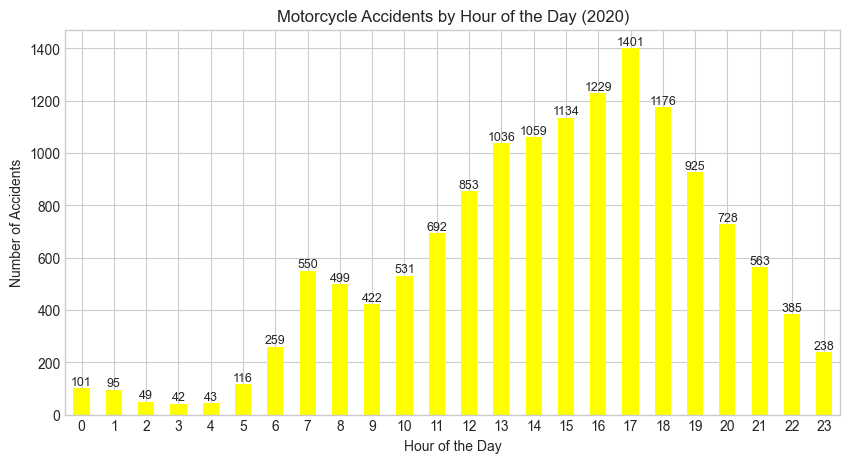

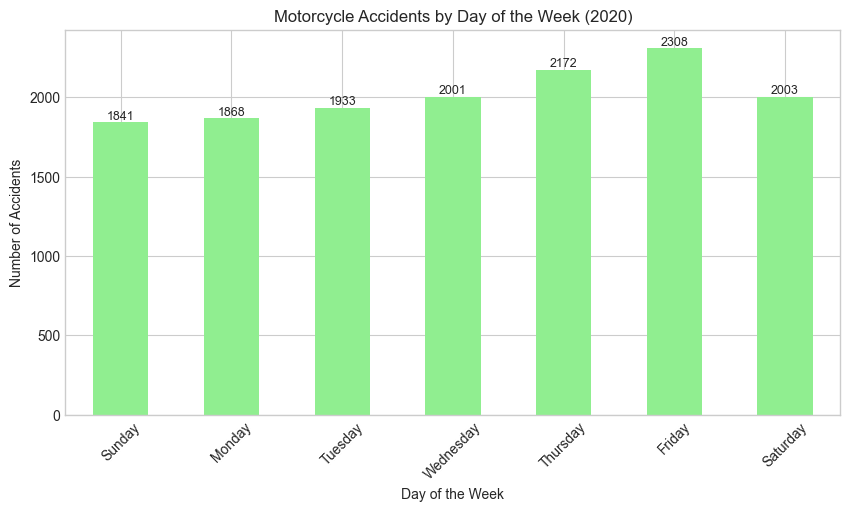

In [23]:
# Define the SQL query
query_motorbike = ('''
SELECT accident.day_of_week, accident.time, vehicle.vehicle_type
FROM accident
JOIN vehicle ON accident.accident_index = vehicle.accident_index
WHERE accident.accident_year = 2020
AND vehicle.vehicle_type IN (02, 03, 04, 05);
''')


# Fetch data into a Pandas DataFrame
df_moto = pd.read_sql_query(query_motorbike, con)

# Load SQL query result into DataFrame
df_moto['time'] = pd.to_datetime(df_moto['time'], format='%H:%M').dt.hour  # Extract hour

# Mapping day numbers to names
days_mapping = {1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 
                5: 'Thursday', 6: 'Friday', 7: 'Saturday'}
df_moto['day_of_week'] = df_moto['day_of_week'].map(days_mapping)

# Set the style to 'seaborn-v0_8-whitegrid' for a light background with gridlines
plt.style.use('seaborn-v0_8-whitegrid')

# Plot accidents by hour
plt.figure(figsize=(10,5))
df_moto['time'].value_counts().sort_index().plot(kind='bar', color='yellow')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Motorcycle Accidents by Hour of the Day (2020)')
plt.xticks(rotation=0)

# Add text annotations on top of each bar
bar_values = df_moto['time'].value_counts().sort_index()
for i, count in enumerate(bar_values):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=9)


plt.show()

# Plot accidents by day of the week
plt.figure(figsize=(10,5))
df_moto['day_of_week'].value_counts().reindex(days_mapping.values()).plot(kind='bar', color='lightgreen')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Motorcycle Accidents by Day of the Week (2020)')
plt.xticks(rotation=45)

# Add text annotations on top of each bar
bar_values = df_moto['day_of_week'].value_counts().reindex(days_mapping.values())
for i, count in enumerate(bar_values):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=9)
    
plt.show()

# Q3

In [24]:
# checking for odd values
cur.execute('''
SELECT DISTINCT casualty_class FROM casualty;
''')

casualty_class = cur.fetchall()
print (casualty_class)

[(2,), (1,), (3,)]


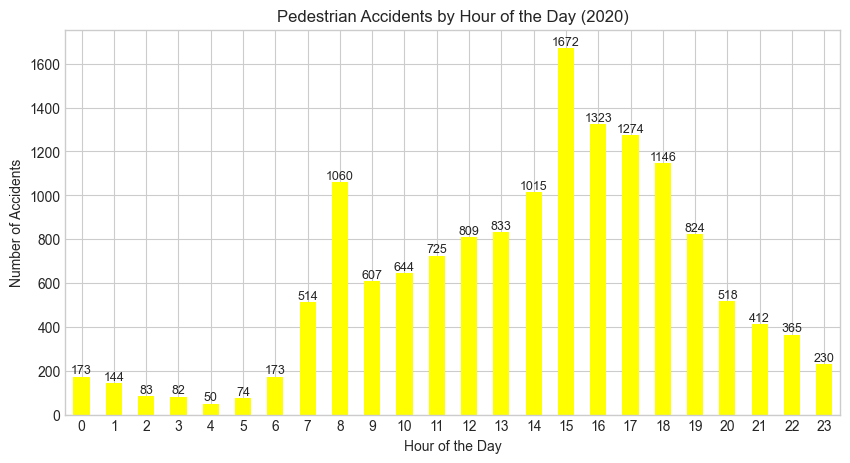

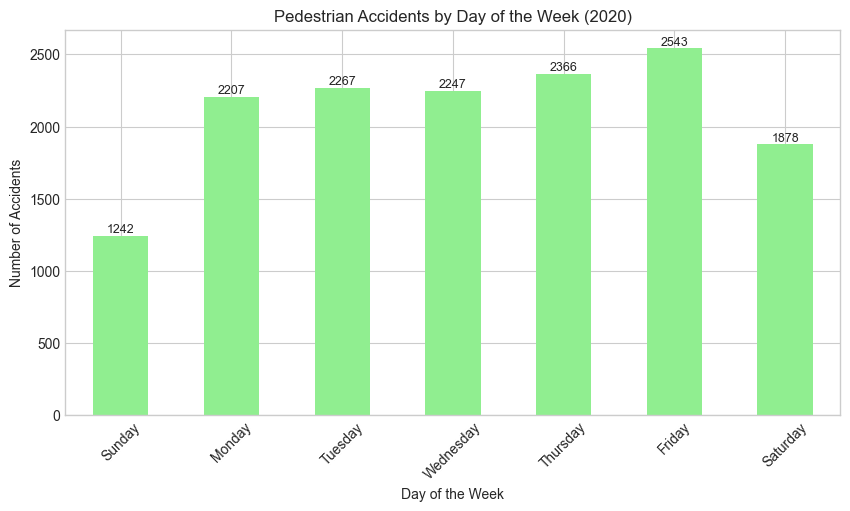

In [31]:
# Define the SQL query
query_pedestrians = ('''
SELECT accident.day_of_week, accident.time, casualty.casualty_class
FROM accident
JOIN casualty ON accident.accident_index = casualty.accident_index
WHERE accident.accident_year = 2020
AND casualty.casualty_class = 3;
''')

# Fetch data into a Pandas DataFrame
df_ped = pd.read_sql_query(query_pedestrians, con)

# Convert time to extract hours
df_ped['time'] = pd.to_datetime(df_ped['time'], format='%H:%M').dt.hour  

# Mapping day numbers to names
days_mapping = {1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 
                5: 'Thursday', 6: 'Friday', 7: 'Saturday'}
df_ped['day_of_week'] = df_ped['day_of_week'].map(days_mapping)

# Plot Pedestrian Accidents by Hour
plt.figure(figsize=(10, 5))
bar_values = df_ped['time'].value_counts().sort_index()  # Calculate bar values
bar_values.plot(kind='bar', color='yellow')  # Plot the data
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Pedestrian Accidents by Hour of the Day (2020)')
plt.xticks(rotation=0)

# Add text annotations on top of each bar
for i, count in enumerate(bar_values):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=9)

plt.show()


# Plot Pedestrian Accidents by Day
plt.figure(figsize=(10, 5))
bar_values = df_ped['day_of_week'].value_counts().reindex(days_mapping.values())  # Calculate bar values
bar_values.plot(kind='bar', color='lightgreen')  # Plot the data
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Pedestrian Accidents by Day of the Week (2020)')
plt.xticks(rotation=45)

# Add text annotations on top of each bar
for i, count in enumerate(bar_values):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=9)

plt.show()


# Q4

In [5]:
def fetch_data(query, columns):
    cur.execute(query)
    data = cur.fetchall()
    return pd.DataFrame(data, columns=columns)

In [6]:
# Define SQL queries to extract data for the year 2020
# Fetch data from database into DataFrames

# Accident Data
query_accident = "SELECT * FROM accident WHERE accident_year = 2020"
accident_df = fetch_data(query_accident, column_accident)

# Vehicle Data
query_vehicle = "SELECT * FROM vehicle WHERE accident_year = 2020"
vehicle_df = fetch_data(query_vehicle, column_vehicle)

# Casualty Data
query_casualty = "SELECT * FROM casualty WHERE accident_year = 2020"
casualty_df = fetch_data(query_casualty, column_casualty)

In [7]:
# Check for missing data in the datasets

def summarize_nulls(dataframes, names):
    for df, name in zip(dataframes, names):
        print(f"Null values in {name}:")
        print(df.isnull().sum(), "\n")

# Summarize nulls
summarize_nulls(
    [accident_df, vehicle_df, casualty_df],
    ["Accident Data", "Vehicle Data", "Casualty Data"]
)

Null values in Accident Data:
accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type           

I don't want to work with variables that contain null values, so no cleaning is needed.

In [8]:
# 'accident_index' is the common(key) column in all dataframes:
df = accident_df.merge(vehicle_df, on='accident_index', how='inner') \
                .merge(casualty_df, on='accident_index', how='inner')

df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
220431,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
220432,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9
220433,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9


In [9]:
print(accident_df['accident_severity'].value_counts())  # Check the distribution of accident severity


accident_severity
3    71453
2    18355
1     1391
Name: count, dtype: int64


#### The percentage for each severity:

Class 3: 78.46%

Class 2: 20.14%

Class 1: 1.53%

In [10]:
def one_hot_encode(df, columns):
    """
    Applies one-hot encoding to multiple columns and returns a new DataFrame 
    containing only the encoded columns.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    columns (list): List of columns to be one-hot encoded.

    Returns:
    pd.DataFrame: A new DataFrame containing only one-hot encoded columns.
    """
    encoded_dfs = []  # Store each encoded DataFrame separately

    for column in columns:
        if column in df.columns:  # Check if column exists
            encoded = pd.get_dummies(df[column], prefix=column).astype(int)
            encoded_dfs.append(encoded)  # Store encoded columns separately


    return pd.concat(encoded_dfs, axis=1)  # Return only encoded columns

# Apply one-hot encoding separately for each table
data = one_hot_encode(df, ['accident_severity', 'time', 'day_of_week',
                                          'light_conditions', 'weather_conditions', 
                                          'road_surface_conditions','special_conditions_at_site', 
                                          'carriageway_hazards','vehicle_type', 'skidding_and_overturning',
                                     'hit_object_in_carriageway', 'vehicle_leaving_carriageway',
                                     'hit_object_off_carriageway', 'vehicle_left_hand_drive', 
                                     'sex_of_driver', 'age_of_driver','casualty_class', 'casualty_severity', 'casualty_type'])


data

,accident_severity_1,accident_severity_2,accident_severity_3,time_00:00,time_00:01,time_00:02,time_00:03,time_00:04,time_00:05,time_00:06,...,casualty_type_17,casualty_type_18,casualty_type_19,casualty_type_20,casualty_type_21,casualty_type_22,casualty_type_23,casualty_type_90,casualty_type_97,casualty_type_98
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
220431,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
220432,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
220433,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
# List of columns to check the distribution for
severity_columns = ['accident_severity_1', 'accident_severity_3', 'accident_severity_2']

# Iterate over the columns and print value counts
for column in severity_columns:
    print(f"Distribution of {column}:")
    print(data[column].value_counts())
    print("\n")  # Add a newline for better readability

Distribution of accident_severity_1:
accident_severity_1
0    216204
1      4231
Name: count, dtype: int64


Distribution of accident_severity_3:
accident_severity_3
1    171376
0     49059
Name: count, dtype: int64


Distribution of accident_severity_2:
accident_severity_2
0    175607
1     44828
Name: count, dtype: int64




In [12]:
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder

In [13]:
import warnings

# Suppress specific warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [14]:
try:
    freq_item_sets_20 = apriori(data, min_support=0.2, use_colnames=True)
except MemoryError as e:
    print(f"MemoryError: Unable to allocate memory for the operation. Error details: {e}")

MemoryError: Unable to allocate memory for the operation. Error details: Unable to allocate 2.55 GiB for an array with shape (220435, 12421) and data type bool


So I increased the threshold

In [15]:
# find frequent itemsets in all datasets.
freq_item_sets_35 = apriori(data, min_support= 0.35, use_colnames= True) #only keep itemsets that appear in at least 35% of the transactions
freq_item_sets_35

,support,itemsets
0,0.777445,(accident_severity_3)
1,0.710599,(light_conditions_1)
2,0.780888,(weather_conditions_1)
3,0.685395,(road_surface_conditions_1)
4,0.960283,(special_conditions_at_site_0)
...,...,...
8227,0.394243,"(hit_object_off_carriageway_0, carriageway_haz..."
8228,0.369515,"(hit_object_off_carriageway_0, carriageway_haz..."
8229,0.352539,"(hit_object_off_carriageway_0, carriageway_haz..."
8230,0.384671,"(hit_object_off_carriageway_0, carriageway_haz..."


In [16]:
# Generate association rules using the correct metric (e.g., 'lift')
rules_30 = association_rules(freq_item_sets_35, metric='lift', min_threshold=0.3)
rules_30

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(accident_severity_3),(light_conditions_1),0.777445,0.710599,0.558282,0.718099,1.010554,1.0,0.005831,1.026605,0.046928,0.600458,0.025915,0.751875
1,(light_conditions_1),(accident_severity_3),0.710599,0.777445,0.558282,0.785650,1.010554,1.0,0.005831,1.038280,0.036089,0.600458,0.036869,0.751875
2,(accident_severity_3),(weather_conditions_1),0.777445,0.780888,0.604246,0.777221,0.995304,1.0,-0.002851,0.983540,-0.020759,0.633324,-0.016735,0.775507
3,(weather_conditions_1),(accident_severity_3),0.780888,0.777445,0.604246,0.773794,0.995304,1.0,-0.002851,0.983861,-0.021079,0.633324,-0.016404,0.775507
4,(road_surface_conditions_1),(accident_severity_3),0.685395,0.777445,0.533726,0.778714,1.001633,1.0,0.000870,1.005736,0.005181,0.574447,0.005704,0.732614
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611995,(hit_object_in_carriageway_0),"(hit_object_off_carriageway_0, carriageway_haz...",0.880636,0.374659,0.364629,0.414052,1.105143,1.0,0.034691,1.067229,0.797054,0.409389,0.062994,0.693640
611996,(vehicle_left_hand_drive_1),"(hit_object_off_carriageway_0, carriageway_haz...",0.939293,0.370486,0.364629,0.388195,1.047801,1.0,0.016635,1.028947,0.751484,0.385790,0.028132,0.686194
611997,(road_surface_conditions_1),"(hit_object_off_carriageway_0, carriageway_haz...",0.685395,0.433556,0.364629,0.531999,1.227057,1.0,0.067472,1.210346,0.588173,0.483386,0.173790,0.686509
611998,(accident_severity_3),"(hit_object_off_carriageway_0, carriageway_haz...",0.777445,0.384671,0.364629,0.469010,1.219248,1.0,0.065568,1.158832,0.807989,0.457223,0.137062,0.708454


In [17]:
# Filter the rules to focus on accident severity (specifically '3' severity)
low_severity_rules = rules_30[rules_30['consequents'].apply(lambda x: 'accident_severity_3' in x)]


I would like to store the results in a CSV file for better readability and comprehensiveness in analysis.

Lift > 1: There’s a positive association (the rule is more likely than random chance).

Lift = 1: The antecedent and consequent are independent (no real rule).

Lift < 1: There’s a negative association (less likely to happen together than by chance).



In [18]:
strong_rules = low_severity_rules[
    (low_severity_rules['lift'] > 1.4) & 
    (low_severity_rules['confidence'] > 0.8) & (low_severity_rules['support'] > 0.6) & (low_severity_rules['conviction'] > 1.5)

]

strong_rules
# Save the high severity rules to a CSV file
strong_rules.to_csv('strong_rules.csv', index=False)

strong_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
40927,"(hit_object_off_carriageway_0, hit_object_in_c...","(vehicle_leaving_carriageway_0, accident_sever...",0.680083,0.640121,0.610488,0.897668,1.402342,1.0,0.175153,3.516782,0.896816,0.860188,0.715649,0.925688
40939,"(vehicle_leaving_carriageway_0, casualty_sever...","(hit_object_off_carriageway_0, accident_severi...",0.679121,0.637948,0.610488,0.898939,1.409111,1.0,0.177245,3.582521,0.904804,0.864004,0.720867,0.927948
117381,"(vehicle_leaving_carriageway_0, carriageway_ha...","(hit_object_off_carriageway_0, accident_severi...",0.663311,0.651548,0.606805,0.914812,1.404058,1.0,0.174626,4.090366,0.854733,0.857003,0.755523,0.923070
117384,"(vehicle_leaving_carriageway_0, special_condit...","(accident_severity_3, hit_object_off_carriagew...",0.659691,0.655082,0.606805,0.919832,1.404147,1.0,0.174653,4.302422,0.845773,0.857107,0.767573,0.923068
124015,"(vehicle_leaving_carriageway_0, vehicle_left_h...","(hit_object_off_carriageway_0, accident_severi...",0.665316,0.651548,0.607195,0.912641,1.400727,1.0,0.173709,3.988730,0.854792,0.855602,0.749294,0.922284
129012,"(hit_object_off_carriageway_0, carriageway_haz...","(vehicle_leaving_carriageway_0, accident_sever...",0.668306,0.640121,0.600222,0.898125,1.403056,1.0,0.172426,3.532563,0.866069,0.847527,0.716919,0.917898
129031,"(hit_object_off_carriageway_0, hit_object_in_c...","(vehicle_leaving_carriageway_0, carriageway_ha...",0.680083,0.625386,0.600222,0.882573,1.411244,1.0,0.174908,3.190176,0.910877,0.851082,0.686538,0.921168
129035,"(vehicle_leaving_carriageway_0, carriageway_ha...","(hit_object_off_carriageway_0, accident_severi...",0.663311,0.637948,0.600222,0.904888,1.418436,1.0,0.177064,3.806587,0.876174,0.856193,0.737297,0.922876
129040,"(vehicle_leaving_carriageway_0, hit_object_in_...","(accident_severity_3, hit_object_off_carriagew...",0.651294,0.655082,0.600222,0.921584,1.406823,1.0,0.173571,4.398578,0.829290,0.849988,0.772654,0.918920
129054,"(vehicle_leaving_carriageway_0, casualty_sever...","(accident_severity_3, hit_object_off_carriagew...",0.679121,0.626960,0.600222,0.883823,1.409695,1.0,0.174440,3.210947,0.905719,0.850343,0.688565,0.920588


In [19]:
medium_severity_rules = rules_30[rules_30['consequents'].apply(lambda x: 'accident_severity_2' in x)]
medium_severity_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski


In [20]:
high_severity_rules = rules_30[rules_30['consequents'].apply(lambda x: 'accident_severity_1' in x)]
high_severity_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski


Based on the percentage of each severity,
severity 2 and severity 1 have a much smaller presence in the dataset, which reduces their likelihood of appearing in meaningful association rules.

Lift is a metric that tells you how much more likely the consequent is to occur given the antecedent, compared to it occurring by chance.


Those numbers on the edges (connections) in my network graph represent the lift of the association rule between an antecedent and a consequent.

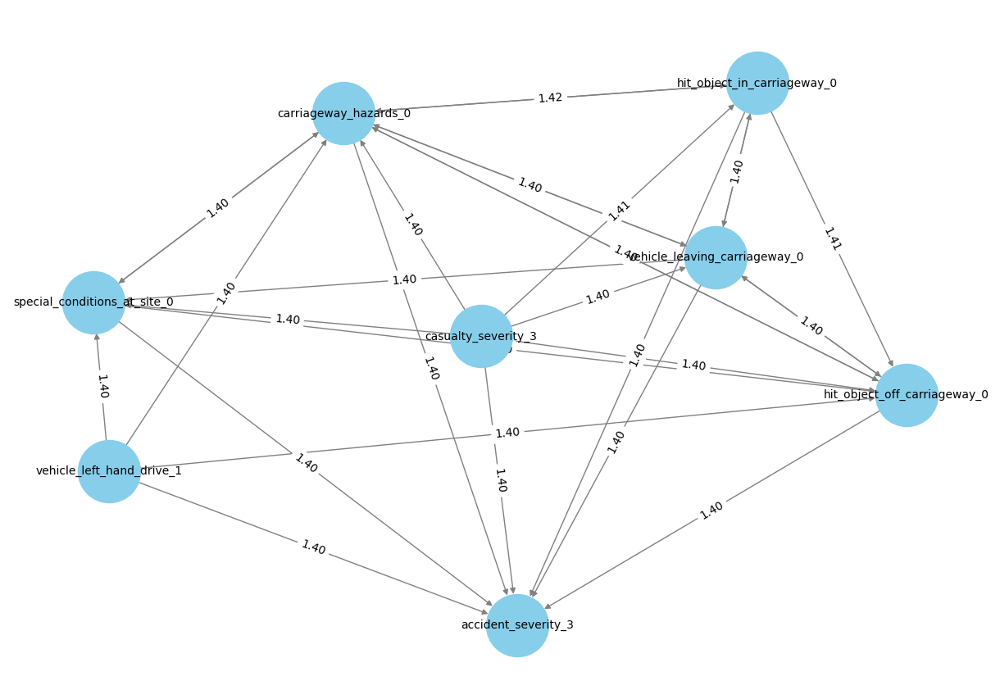

In [22]:
import networkx as nx

def draw_rules_graph(rules_df, top_n=20):
    G = nx.DiGraph()

    top_rules = rules_df.sort_values('lift', ascending=False).head(top_n)

    for _, rule in top_rules.iterrows():
        for antecedent in rule['antecedents']:
            for consequent in rule['consequents']:
                G.add_edge(antecedent, consequent, weight=rule['lift'])

    pos = nx.spring_layout(G, k=1, iterations=20)
    plt.figure(figsize=(12,8))
    nx.draw(G, pos, with_labels=True, node_size=3000, node_color='skyblue', font_size=10, edge_color='gray')
    labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos, edge_labels={k: f"{v:.2f}" for k, v in labels.items()})
    plt.title("Top Association Rules Network")
    plt.show()

draw_rules_graph(strong_rules)


# Q5

In [23]:
# I extracted only the necessary columns.

In [24]:
# Execute the query
results = cur.execute('''
    SELECT a.longitude, a.latitude, a.police_force, a.accident_severity, a.weather_conditions, a.speed_limit, v.vehicle_type, l.lsoa01nm
    FROM accident a
    JOIN lsoa l ON a.lsoa_of_accident_location = l.lsoa01cd
    JOIN vehicle v ON a.accident_index = v.accident_index
    WHERE (l.lsoa01nm LIKE '%Kingston upon Hull%'
       OR l.lsoa01nm LIKE '%Humberside%'
       OR l.lsoa01nm LIKE '%Holderness%'
       OR l.lsoa01nm LIKE '%Beverley%'
       OR l.lsoa01nm LIKE '%Boothferry%'
       OR l.lsoa01nm LIKE '%East Riding of Yorkshire%')
       AND a.accident_year = 2020
''')

# Get column names
columns = [description[0] for description in results.description]

# Fetch all results
results_data = results.fetchall()

# Create DataFrame with column names
results_df = pd.DataFrame(results_data, columns=columns)

# Display the DataFrame
results_df.head()


,longitude,latitude,police_force,accident_severity,weather_conditions,speed_limit,vehicle_type,lsoa01nm
0,-0.393424,53.744936,16,3,1,30,9,Kingston upon Hull 028E
1,-0.393424,53.744936,16,3,1,30,19,Kingston upon Hull 028E
2,-0.324858,53.791630,16,2,1,30,8,Kingston upon Hull 002E
3,-0.327733,53.767805,16,3,1,30,9,Kingston upon Hull 016D
4,-0.309102,53.750410,16,3,1,30,9,Kingston upon Hull 026D


In [27]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import folium
from folium.plugins import MarkerCluster

# Define a function to perform clustering
def perform_clustering(data, features, n_clusters=3, pca_reduce=False):
    x = data[features].values
    x_scaled = StandardScaler().fit_transform(x)

    if pca_reduce:
        pca = PCA(n_components=2)
        x_scaled = pca.fit_transform(x_scaled)

    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    clusters = kmeans.fit_predict(x_scaled)

    data['cluster'] = clusters
    return data, kmeans, x_scaled


# Function to evaluate clustering
def evaluate_clustering(x, labels, kmeans_model):
    silhouette_avg = silhouette_score(x, labels)
    db_index = davies_bouldin_score(x, labels)
    inertia = kmeans_model.inertia_
    
    print("Clustering Evaluation Metrics")
    print(f"• Inertia (Sum of Squared Distances): {inertia:.2f}")
    print(f"• Silhouette Score: {silhouette_avg:.3f}")
    print(f"• Davies-Bouldin Index: {db_index:.3f}")


# Apply clustering on geospatial data (longitude, latitude)
geo_features = ['longitude', 'latitude']
results_df, kmeans_geo, x_geo_scaled = perform_clustering(results_df, geo_features, n_clusters=6)

# Evaluate
evaluate_clustering(x_geo_scaled, results_df['cluster'], kmeans_geo)

# ====================
# 📍 Folium Map Visual
# ====================
m = folium.Map(location=[results_df['latitude'].mean(), results_df['longitude'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# Add clustered accident points to the map
for idx, row in results_df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=4,
        color=plt.cm.viridis(row['cluster'] / results_df['cluster'].nunique()),
        fill=True,
        fill_opacity=0.6,
        popup=f"Cluster: {row['cluster']}<br>Severity: {row['accident_severity']}"
    ).add_to(marker_cluster)

m.save("clustered_accidents_map.html")
print("✅ Map saved as 'clustered_accidents_map.html'")
# Show it inline in the notebook
display(m)

Clustering Evaluation Metrics
• Inertia (Sum of Squared Distances): 524.25
• Silhouette Score: 0.417
• Davies-Bouldin Index: 0.731
✅ Map saved as 'clustered_accidents_map.html'


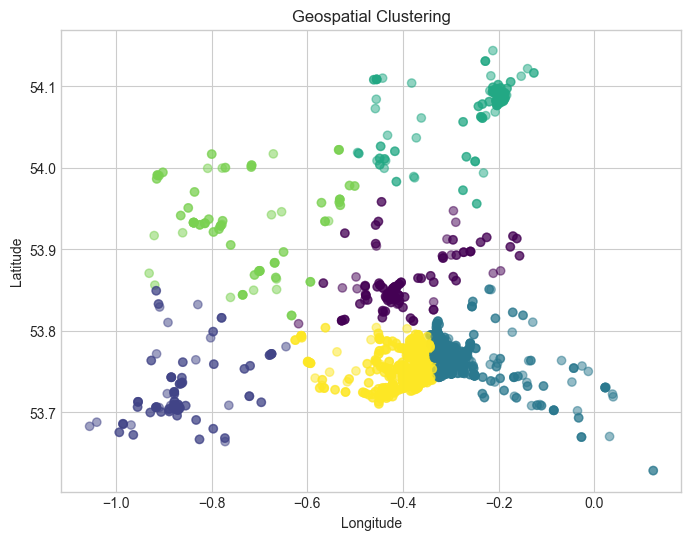

In [28]:
# Set the style to 'seaborn-v0_8-whitegrid' for a light background with gridlines
plt.style.use('seaborn-v0_8-whitegrid')


# Visualize cluster on 2D scatter (geo)
plt.figure(figsize=(8, 6))
plt.scatter(results_df['longitude'], results_df['latitude'], c=results_df['cluster'], cmap='viridis', alpha=0.5)
plt.title('Geospatial Clustering')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


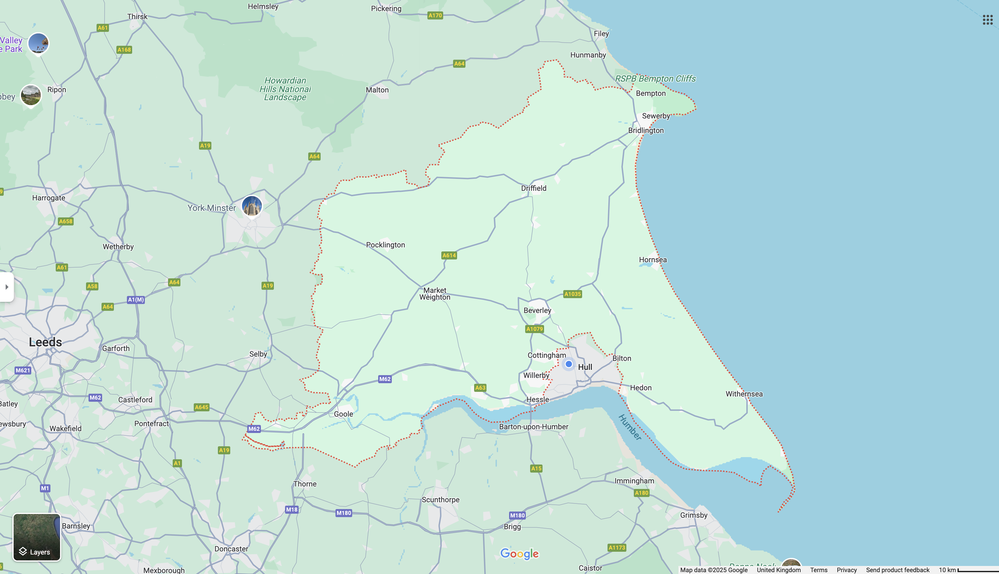

In [11]:
#clustering with different variables
results_df, kmeans_model, x_scaled = perform_clustering(
    results_df, 
    features=['speed_limit', 'weather_conditions'], 
    n_clusters=3, 
    pca_reduce=True
)

In [12]:
evaluate_clustering(x_scaled, results_df['cluster'], kmeans_model)

Clustering Evaluation Metrics
• Inertia (Sum of Squared Distances): 709.25
• Silhouette Score: 0.793
• Davies-Bouldin Index: 0.331


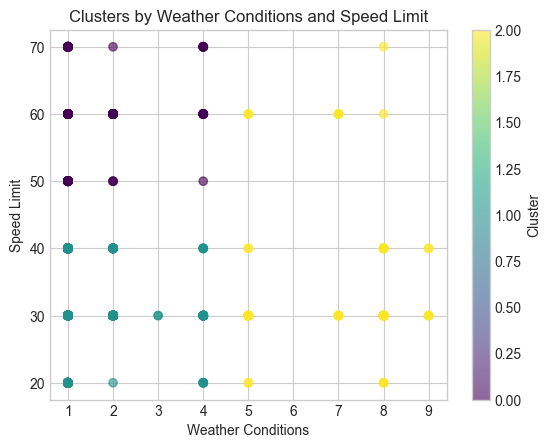

In [13]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')

# Scatter plot using the 'cluster' column
plt.scatter(
    results_df['weather_conditions'],
    results_df['speed_limit'],
    c=results_df['cluster'],
    cmap='viridis',
    alpha=0.6
)

plt.title('Clusters by Weather Conditions and Speed Limit')
plt.xlabel('Weather Conditions')
plt.ylabel('Speed Limit')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

In [14]:
#clustering with different variables
results_df, kmeans_model, x_scaled = perform_clustering(
    results_df, 
    features=['accident_severity', 'vehicle_type'], 
    n_clusters=3, 
    pca_reduce=True
)

In [15]:
evaluate_clustering(x_scaled, results_df['cluster'], kmeans_model)

Clustering Evaluation Metrics
• Inertia (Sum of Squared Distances): 330.66
• Silhouette Score: 0.884
• Davies-Bouldin Index: 0.223


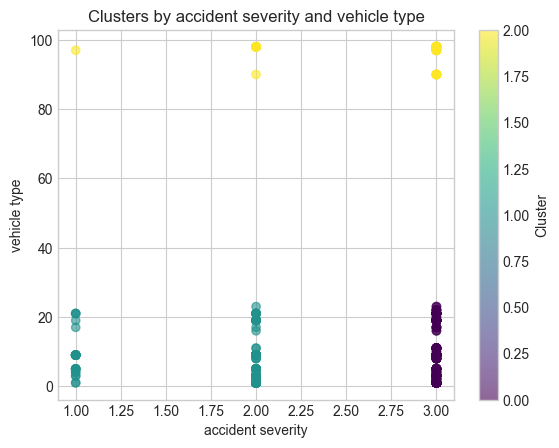

In [16]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')

# Scatter plot using the 'cluster' column
plt.scatter(
    results_df['accident_severity'],
    results_df['vehicle_type'],
    c=results_df['cluster'],
    cmap='viridis',
    alpha=0.6
)

plt.title('Clusters by accident severity and vehicle type')
plt.xlabel('accident severity')
plt.ylabel('vehicle type')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()


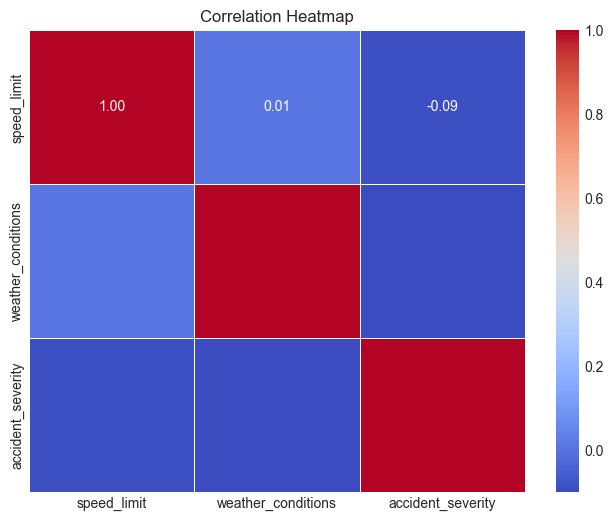

In [17]:
import seaborn as sns

# Calculate correlation matrix for numerical columns
corr_matrix = results_df[['speed_limit', 'weather_conditions', 'accident_severity']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


In [18]:
from folium.plugins import HeatMap

# Prepare data for HeatMap (latitude, longitude)
heat_data = [[row['latitude'], row['longitude']] for _, row in results_df.iterrows()]

# Create map centered around the mean of lat/lon
m = folium.Map(location=[results_df['latitude'].mean(), results_df['longitude'].mean()], zoom_start=10)

# Add HeatMap layer
HeatMap(heat_data).add_to(m)

# Save map as HTML file
m.save("heatmap_accidents.html")
#Display
m

In [69]:
#######

In [65]:
# Accident Hotspots by Time of Day and Day of Week
# Distribution of accidents at different times of the day or week

In [31]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')


#Due to time constraints, I added this section afterward in the Jupyter Notebook 
# and reloaded the data from SQL instead of re-running the entire code, which was time-consuming.
# Step 1: Load Data
try:
    # Connect to the SQLite database
    conn = sqlite3.connect('accident_data_v1.0.0_2023 (1).db')
    
    # Execute query to fetch data
    query = """
        SELECT a.longitude, a.latitude, a.date, a.time, a.day_of_week, 
               a.accident_severity, a.weather_conditions, a.speed_limit, 
               v.vehicle_type, l.lsoa01nm
        FROM accident a
        JOIN lsoa l ON a.lsoa_of_accident_location = l.lsoa01cd
        JOIN vehicle v ON a.accident_index = v.accident_index
        WHERE (l.lsoa01nm LIKE '%Kingston upon Hull%'
           OR l.lsoa01nm LIKE '%Humberside%'
           OR l.lsoa01nm LIKE '%Holderness%'
           OR l.lsoa01nm LIKE '%Beverley%'
           OR l.lsoa01nm LIKE '%Boothferry%'
           OR l.lsoa01nm LIKE '%East Riding of Yorkshire%')
           AND a.accident_year = 2020
    """
    accident_data = pd.read_sql_query(query, conn)
    conn.close()  # Close database connection

except sqlite3.Error as e:
    print(f"Error fetching data: {e}")
    raise


# Step 2: Preprocess Data
# Ensure longitude and latitude are numeric
accident_data[['longitude', 'latitude']] = accident_data[['longitude', 'latitude']].apply(pd.to_numeric, errors='coerce')

# Drop rows with NaN values
accident_data.dropna(subset=['longitude', 'latitude'], inplace=True)

# Convert 'date' and 'time' to datetime
accident_data['date'] = pd.to_datetime(accident_data['date'], errors='coerce')
accident_data['hour'] = accident_data['time'].astype(str).str[:2].astype(int)

# Create time buckets
def time_bucket(hour):
    if 7 <= hour < 10:
        return 'Morning Rush'
    elif 10 <= hour < 16:
        return 'Midday'
    elif 16 <= hour < 19:
        return 'Evening Rush'
    else:
        return 'Night'

accident_data['time_bucket'] = accident_data['hour'].apply(time_bucket)

# Mapping numeric day_of_week to names (if not already mapped)
day_mapping = {1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 
               5: 'Thursday', 6: 'Friday', 7: 'Saturday'}
accident_data['day_of_week'] = accident_data['day_of_week'].map(day_mapping)



# Final Summary
print("Hotspot Analysis Completed.")


Hotspot Analysis Completed.


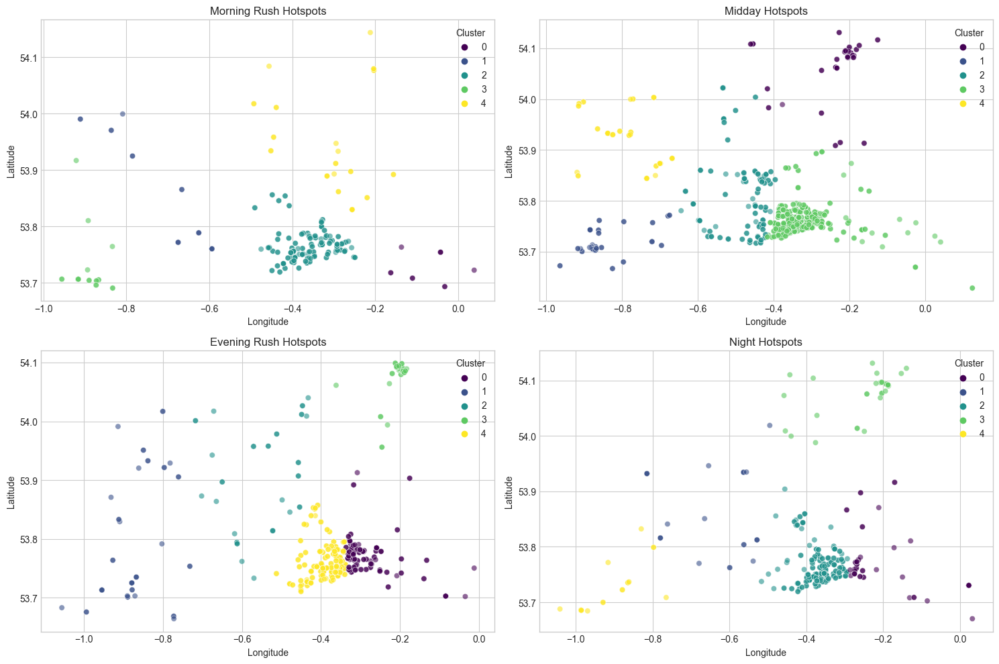

In [32]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
time_buckets = ['Morning Rush', 'Midday', 'Evening Rush', 'Night']

for i, time_bucket in enumerate(time_buckets):
    time_data = accident_data[accident_data['time_bucket'] == time_bucket]
    coords = time_data[['longitude', 'latitude']].dropna()

    if not coords.empty:
        kmeans = KMeans(n_clusters=5, random_state=42)
        time_data['cluster'] = kmeans.fit_predict(coords)
        
        # Plot on grid
        ax = axes[i // 2, i % 2]
        sns.scatterplot(x='longitude', y='latitude', hue='cluster', data=time_data, palette='viridis', alpha=0.6, ax=ax)
        ax.set_title(f"{time_bucket} Hotspots")
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        ax.legend(title="Cluster")

plt.tight_layout()
plt.show()


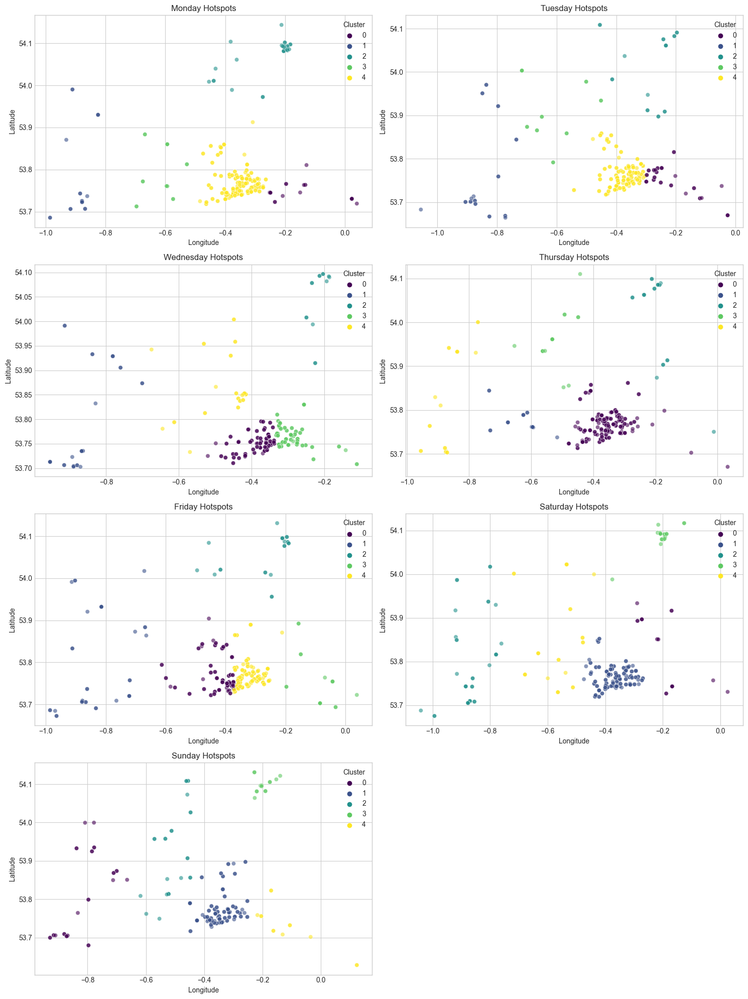

In [33]:
fig, axes = plt.subplots(4, 2, figsize=(15, 20))  # Adjust grid for 7 days (4 rows, 2 columns)
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for i, day in enumerate(days_of_week):
    day_data = accident_data[accident_data['day_of_week'] == day]
    coords = day_data[['longitude', 'latitude']].dropna()

    if not coords.empty:
        kmeans = KMeans(n_clusters=5, random_state=42)
        day_data['cluster'] = kmeans.fit_predict(coords)
        
        # Plot on grid
        ax = axes[i // 2, i % 2]
        sns.scatterplot(x='longitude', y='latitude', hue='cluster', data=day_data, palette='viridis', alpha=0.6, ax=ax)
        ax.set_title(f"{day} Hotspots")
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        ax.legend(title="Cluster")
    else:
        ax = axes[i // 2, i % 2]
        ax.set_title(f"{day} Hotspots (No Data)")
        ax.axis('off')  # Hide axes if no data is available

# Remove any unused subplot in the grid (e.g., 8th subplot in 4x2)
for j in range(len(days_of_week), 8):
    fig.delaxes(axes[j // 2, j % 2])

plt.tight_layout()
plt.show()


# Q6

In [4]:
cur.execute('''
SELECT DISTINCT police_force FROM accident;
''')
police_force = cur.fetchall()
print (police_force)

[(1,), (48,), (3,), (4,), (5,), (6,), (7,), (10,), (11,), (12,), (13,), (14,), (16,), (17,), (20,), (21,), (22,), (23,), (30,), (31,), (32,), (33,), (34,), (35,), (36,), (37,), (40,), (41,), (42,), (43,), (44,), (45,), (46,), (47,), (50,), (52,), (53,), (54,), (55,), (60,), (61,), (62,), (63,), (91,), (92,), (93,), (94,), (95,), (96,), (97,), (98,), (99,)]


In [5]:
#police_force code = 
# 16	Humberside Police
# 21	North Yorkshire Police
# 22	West Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force IN (16, 21, 22)
AND accident_year BETWEEN 2017 AND 2020;
''')

# Fetch all results
results = cur.fetchall()


# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)

,date,police_force
0,2017-01-06,16
1,2017-01-02,16
2,2017-01-01,16
3,2017-01-02,16
4,2017-01-01,16


In [9]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,8
2017-01-08,111
2017-01-15,132
2017-01-22,122
2017-01-29,142
...,...
2020-12-06,108
2020-12-13,97
2020-12-20,96


In [10]:
# drop the last row because its blongs to 2021
# and first row, because its too low

weekly_accidents = weekly_accidents.drop(weekly_accidents.index[-1])
weekly_accidents = weekly_accidents.iloc[1:]
weekly_accidents

,accident_count
date,
2017-01-08,111
2017-01-15,132
2017-01-22,122
2017-01-29,142
2017-02-05,142
...,...
2020-11-29,81
2020-12-06,108
2020-12-13,97


In [11]:
weekly_accidents.columns

Index(['accident_count'], dtype='object')

<Figure size 300x300 with 0 Axes>

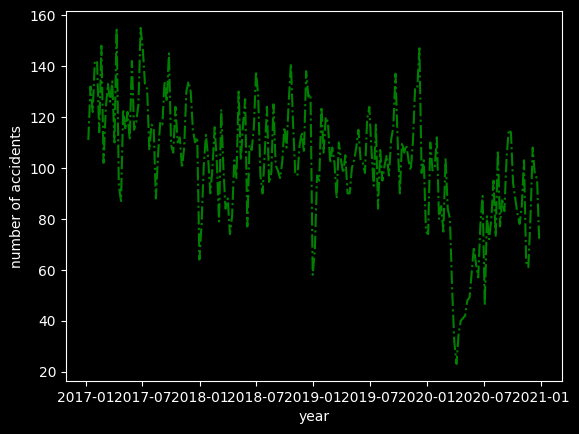

<Figure size 300x300 with 0 Axes>

In [12]:
plt.plot(weekly_accidents[['accident_count']],'g-.')
plt.xlabel('year')
plt.ylabel('number of accidents')
plt.figure(figsize= (3, 3))

Time Series Pattern : Cyclic with No Trend

## 1)Apply timeseries model with 'aic values' function on all 3 AREA together

In [21]:
# Decomposition of the series
from statsmodels.tsa.seasonal import STL

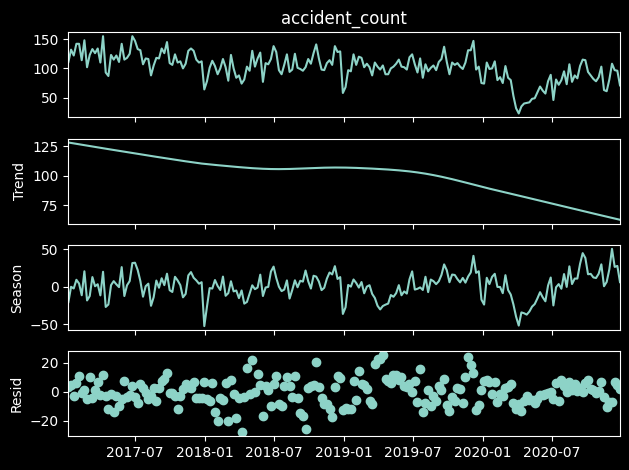

In [22]:
STL(weekly_accidents['accident_count']).fit().plot()
plt.show()

• Trend – slow moving changes in statistical properties


• Seasonality – Does not repeat any pattern over a fixed period


• Residual or Error – what is left after the removal of trend and seasonality

In [23]:
# Split the data into train and test sets for each police force
train = weekly_accidents[:-52]  # All data except the last 52 weeks (train data)
test = weekly_accidents[-52:]   # Last 52 weeks (test data)

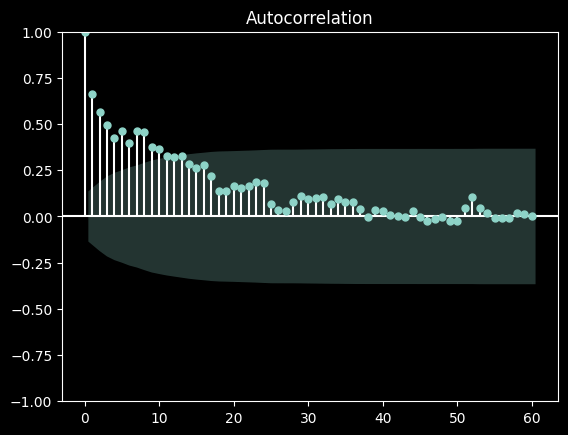

In [24]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents['accident_count'], lags=60)
plt.show()

The ACF plot shows an oscillating or wave-like pattern.

The ACF values are also gradually decaying, this is a sign of non-stationarity. So, this timeseries is non-stationary.

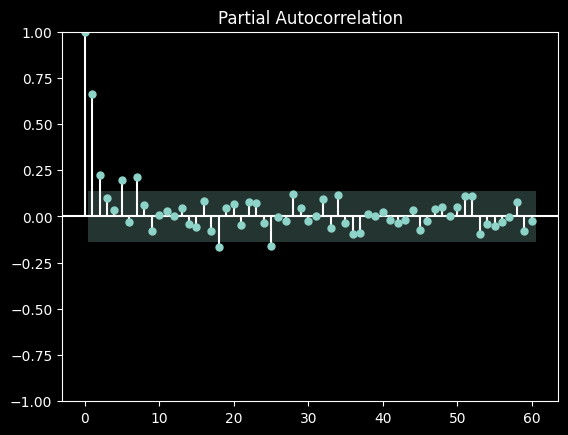

In [25]:
# Plot of PCF to understand the series 
plot_pacf(weekly_accidents['accident_count'], lags=60)
plt.show()

In [26]:
from statsmodels.tsa.stattools import adfuller

In [27]:
ADF_test = adfuller(weekly_accidents['accident_count'])
print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -2.3484081417168103; p-value 0.1568301124463623


If p-value above 0.05, data is not stationary.

The p-value is not less than 0.05. Hence, we cannot reject the null hypothesis of non-stationarity.



In [28]:
# Applying differencing to for stationarity
diff_1 = weekly_accidents[['accident_count']].diff(1).dropna()
diff_1 

,accident_count
date,
2017-01-15,21.0
2017-01-22,-10.0
2017-01-29,20.0
2017-02-05,0.0
2017-02-12,-28.0
...,...
2020-11-29,20.0
2020-12-06,27.0
2020-12-13,-11.0


In [29]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(diff_1['accident_count'])
print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -8.676170782994145; p-value 4.41023594019558e-14


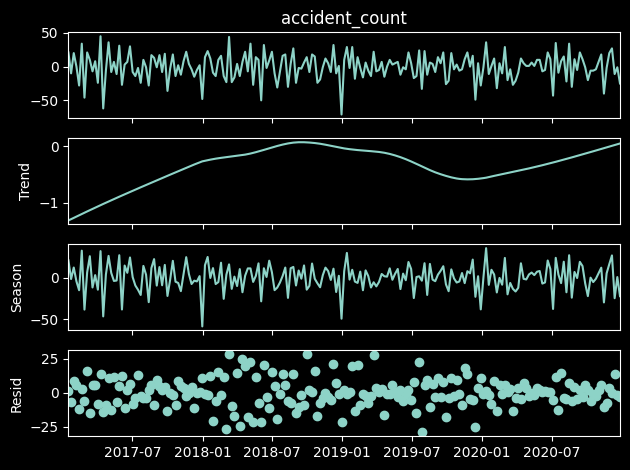

In [30]:
# Decomposition of the differenced series
STL(diff_1['accident_count']).fit().plot()
plt.show()

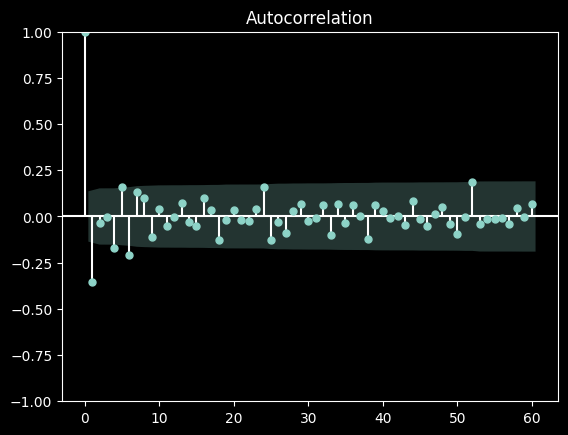

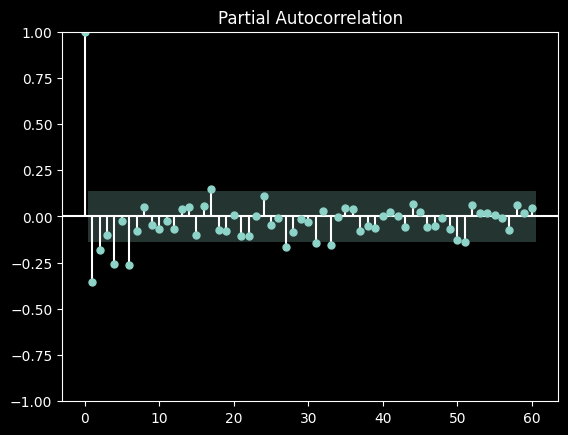

In [31]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(diff_1, lags=60)
plot_pacf(diff_1, lags=60)
plt.show()

ACF plot of the differenced series. Notice how the coefficients are significant up until lag 1 but immediately after. So, there is no clear sign of cutoff at any lag.

ACF Cutoff, PACF Decay: Suggests an MA process.

PACF Cutoff, ACF Decay: Suggests an AR process.

Both ACF and PACF Decay: Suggests a mixed ARMA process.

In [32]:
from itertools import product

In [33]:
ps = np.arange(0, 8, 1) 
qs = np.arange(0,8, 1)
Ps = [0] # Seasonal order of AR
Qs = [0] # Seasonal order of MA
d= 1  # number of times the series is differenced to attain stationarity 
D = 0 # Seasonal differencing
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs)) 
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

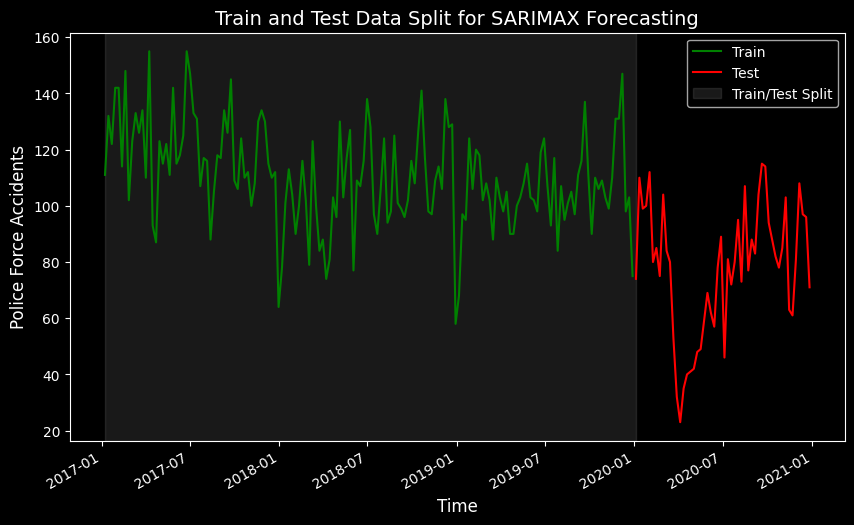

In [34]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Splitting the dataset into train and test set
train = weekly_accidents[['accident_count']][:-52]  # all the data before the last 52 weeks
test = weekly_accidents[['accident_count']][-52:]   # last 52 weeks for testing

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot training and test sets
ax.plot(train.index, train['accident_count'], 'g-', label='Train')  # Green line for train data
ax.plot(test.index, test['accident_count'], 'r-', label='Test')    # Red line for test data

# Highlight the training data region with a shaded area
ax.axvspan(train.index[0], test.index[0], alpha=0.2, color='gray', label="Train/Test Split")

# Labeling and formatting
ax.set_xlabel('Time', fontsize=12)
ax.set_ylabel('Police Force Accidents', fontsize=12)  # Adjust this label based on your data
ax.set_title('Train and Test Data Split for SARIMAX Forecasting', fontsize=14)
fig.autofmt_xdate()  # Rotates date labels if the x-axis is a date

# Display the legend
plt.legend()

# Show the plot
plt.show()


In [35]:
test.head()

,accident_count
date,
2020-01-05,74
2020-01-12,110
2020-01-19,99
2020-01-26,100
2020-02-02,112


In [36]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress bar
# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [00:17<00:00,  3.62it/s]


In [37]:
aic_df

,"Order(p,q,Ps,QS)",AIC
46,"(5, 6, 0, 0)",1300.325630
54,"(6, 6, 0, 0)",1301.795529
23,"(2, 7, 0, 0)",1304.280730
7,"(0, 7, 0, 0)",1304.737486
39,"(4, 7, 0, 0)",1305.401241
...,...,...
40,"(5, 0, 0, 0)",1338.790759
16,"(2, 0, 0, 0)",1345.957890
24,"(3, 0, 0, 0)",1346.347564
8,"(1, 0, 0, 0)",1350.848130


The number of rows in aic_df =64 and the number of models we stated with = 64, so essentially we are not skipping any model.

The lowest AIC value is 1280.445 for p=5, q =6 (from the first row of above dataframe). we used d=1 (when removed non-stationarity)

In [38]:
from statsmodels.tsa.arima.model import ARIMA


In [40]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
arima_model = ARIMA(endog=train, order=(5, 1 ,6)).fit() 
#using original data for train, because differencing (d=1) taken care of during the model fitting.

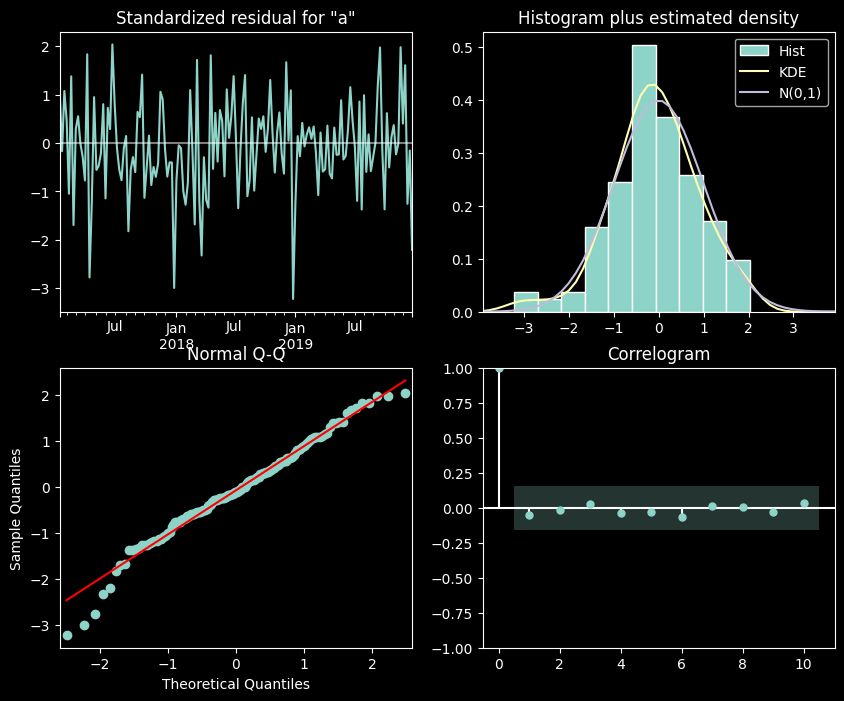

In [41]:
# Plots of the Q-Q plot
arima_model.plot_diagnostics(figsize=(10,8));

#### Understanding Q-Q plot (ideal scenarios):
 **top left corner**: The residuals should appear to be randomly scattered around zero, with no obvious trends, patterns, or heteroscedasticity (unequal variance). The residuals should stay within a constant band around zero. But, We have something completely different

  There’s likely a nonlinear pattern, trend, or heteroscedasticity (residuals fan out or compress).

  
 **top right corner**: The histogram and density curve should resemble a normal distribution with a mean of 0. This indicates that the residuals are approximately normally distributed, which is an assumption of many time series models. Mine is almost evenly distributed across the range of fitted values
 
 **bottom left corner**: The points should fall approximately along a straight diagonal line. This indicates that the residuals are approximately normally distributed. But, our data, not all the points along with the line

 Indicates deviation from normality

 **bottom right corner**: All autocorrelation coefficients should be within the blue shaded area (confidence interval), indicating that the residuals are uncorrelated. Except the first one, the rest are in the shaded area.

There’s significant autocorrelation at lag 1 → my residuals are not independent

In [42]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(arima_model.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,0.005642,0.940124
2,0.034949,0.982677
3,1.039903,0.791598
4,1.057064,0.901023
5,1.633442,0.897176
6,1.636294,0.949933
7,1.992364,0.960262
8,2.017355,0.980475
9,2.024257,0.991078
10,2.192023,0.994645


Ljung-Box test:
The Ljung-Box test is a valuable tool for assessing the adequacy of time series models and detecting serial correlation in data.

Scenarios:
 
 More than  0.05	Fail to reject the null hypothesis: residuals are not significantly autocorrelated	✅ Good — residuals are likely white noise

 


 Equal or less than 0.05	Reject the null hypothesis: residuals are significantly autocorrelated	❌ Bad — model hasn't fully captured the structure

In [43]:
# Forecasting the test set using both naive_model (using the last values) and arima
len_test = len(test)

arima_pred = arima_model.get_forecast(len_test).predicted_mean.values

naive_pred = train['accident_count'][len(train)-52:len(train)].values
test['naive_pred'] = naive_pred
test['arima_pred'] = arima_pred


test.head()

,accident_count,naive_pred,arima_pred
date,,,
2020-01-05,74,68,81.538436
2020-01-12,110,97,103.695980
2020-01-19,99,95,103.114607
2020-01-26,100,124,114.314651
2020-02-02,112,106,110.538017


In [44]:
from sklearn.metrics import mean_squared_error

arima_mse = mean_squared_error(test['accident_count'],test['arima_pred'])
naive_mse = mean_squared_error(test['accident_count'],test['naive_pred'])

print(f"ARIMA RMSE: {arima_mse}")
print(f"Naive RMSE: {naive_mse}")

ARIMA RMSE: 1417.5945343550388
Naive RMSE: 1368.25


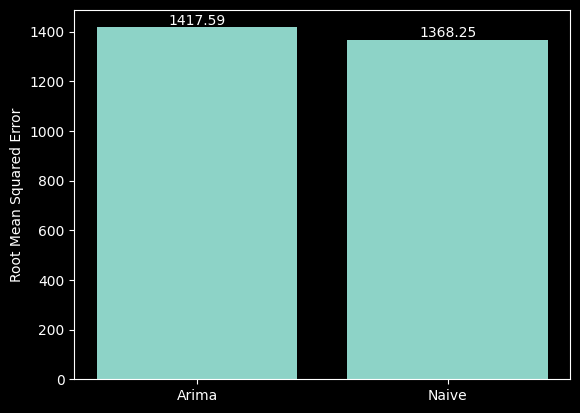

In [45]:
# Plotting the results 

list_mse = [arima_mse,naive_mse]
models = ['Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

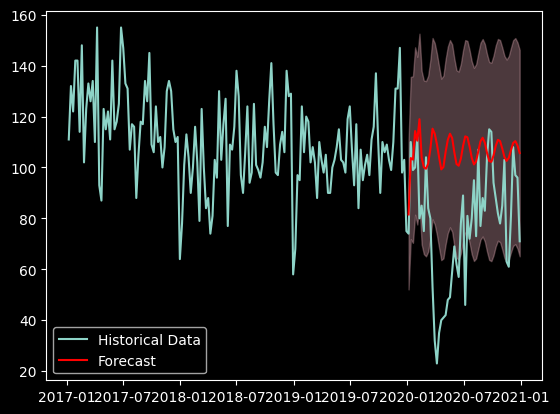

In [46]:
# Forecasting for the next 52 weeks (2020)
forecast = arima_model.get_forecast(steps=52)

# Get predicted values and confidence intervals
forecast_values = forecast.predicted_mean
conf_int = forecast.conf_int()

# Plot the forecast
plt.plot(weekly_accidents.index, weekly_accidents['accident_count'], label="Historical Data")
plt.plot(forecast_values.index, forecast_values, label="Forecast", color='red')
plt.fill_between(forecast_values.index, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.3)
plt.legend()
plt.show()


##### The scores are not satisfactory, so I don't want to work with this data as a whole. Instead, I plan to apply the model separately to each police force.

## 2)Investigation of the time series process on each area separately

In [75]:
#police_force code = 
# 16	Humberside Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 16
AND accident_year BETWEEN 2017 AND 2020;
''')

# Fetch all results
results = cur.fetchall()


# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)

,date,police_force
0,2017-01-06,16
1,2017-01-02,16
2,2017-01-01,16
3,2017-01-02,16
4,2017-01-01,16


In [76]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,2
2017-01-08,47
2017-01-15,46
2017-01-22,44
2017-01-29,56
...,...
2020-12-06,44
2020-12-13,42
2020-12-20,40


In [77]:
# drop the last row because its blongs to 2021
# drop the first row because its low
weekly_accidents = weekly_accidents.iloc[1:-1]
weekly_accidents

,accident_count
date,
2017-01-08,47
2017-01-15,46
2017-01-22,44
2017-01-29,56
2017-02-05,39
...,...
2020-11-29,32
2020-12-06,44
2020-12-13,42


<Figure size 300x300 with 0 Axes>

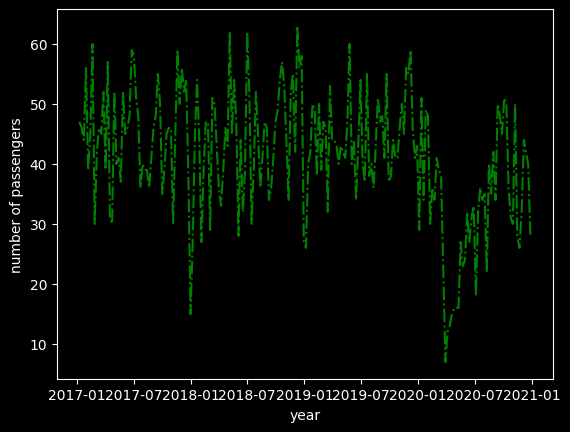

<Figure size 300x300 with 0 Axes>

In [78]:
# visualisation of the data 
plt.plot(weekly_accidents[['accident_count']],'g-.')
plt.xlabel('year')
plt.ylabel('number of passengers')
plt.figure(figsize= (3, 3))

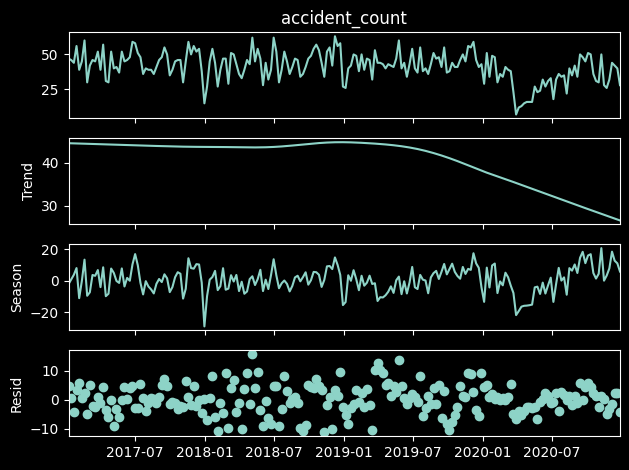

In [79]:
# Decomposition of the series
from statsmodels.tsa.seasonal import STL
STL(weekly_accidents['accident_count']).fit().plot()
plt.show()

In [80]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(weekly_accidents['accident_count'])[:2]

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")
# if above 0.05, data is not stationary

ADF Statistic: -2.467054826129164; p-value 0.12369736794703018


p-value is above 0.05

In [81]:
# Applying differencing to for stationarity
diff_1 = weekly_accidents[['accident_count']].diff(1).dropna()
diff_1 

,accident_count
date,
2017-01-15,-1.0
2017-01-22,-2.0
2017-01-29,12.0
2017-02-05,-17.0
2017-02-12,6.0
...,...
2020-11-29,6.0
2020-12-06,12.0
2020-12-13,-2.0


In [82]:
ADF_test = adfuller(diff_1['accident_count'])[:2]

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")
# if above 0.05, data is not stationary

ADF Statistic: -9.358612311212031; p-value 7.934081729829248e-16


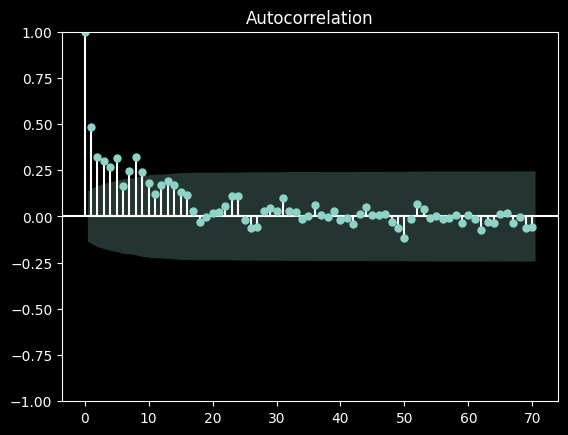

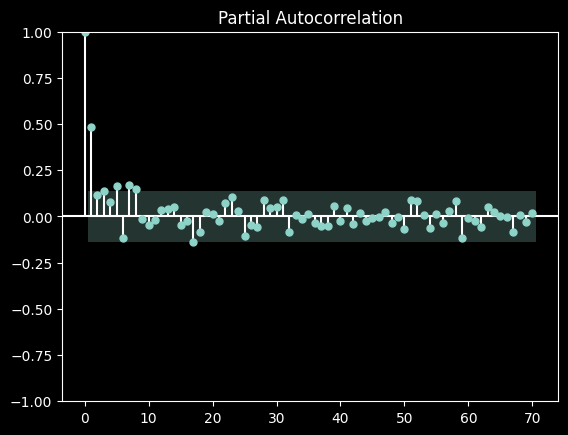

In [83]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents['accident_count'], lags=70)
plot_pacf(weekly_accidents['accident_count'], lags=70)
plt.show()

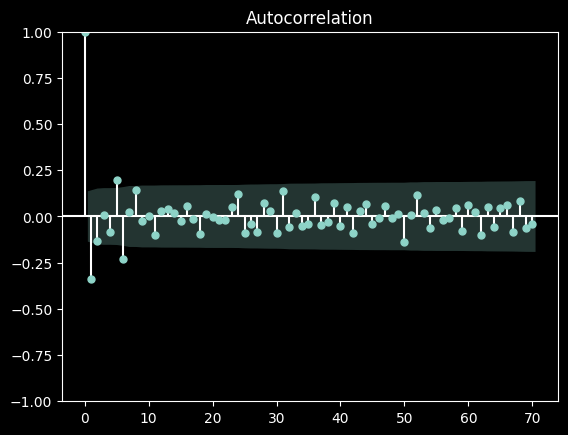

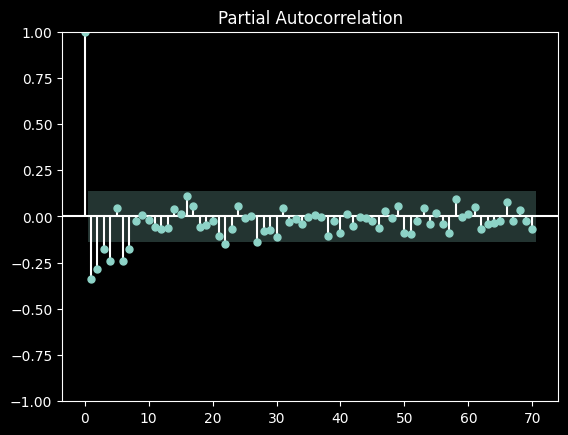

In [84]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(diff_1, lags=70)
plot_pacf(diff_1, lags=70)
plt.show()

In [85]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,8,1) # Order of AR
qs = np.arange(0,8,1) # Order of MA
Ps = [0] # Seasonal order of AR (taught in week 7)
Qs = [0] # Seasonal order of MA (taught in week 7)
d= 1 # two-order differencing
D = 0 # Seasonal differencing (taught in week 7)
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

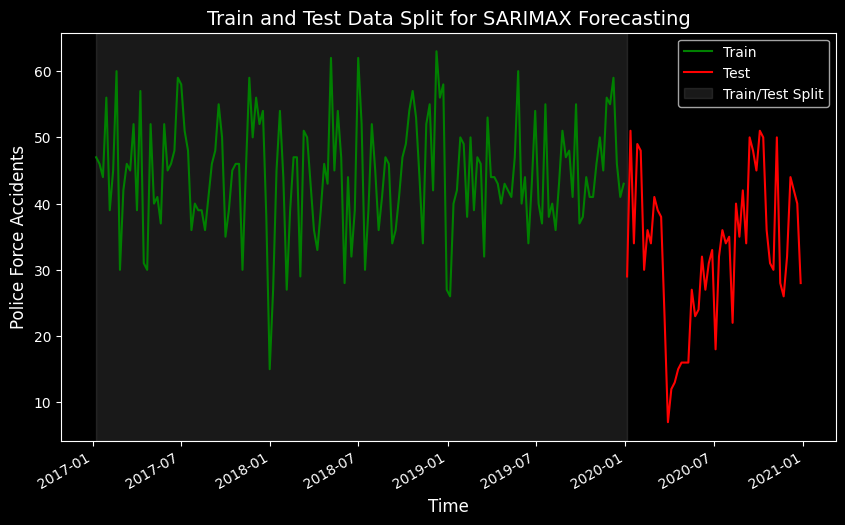

In [86]:
# Splitting the dataset into train and test set
train = weekly_accidents[['accident_count']][:-52]  # all the data before the last 52 weeks
test = weekly_accidents[['accident_count']][-52:]   # last 52 weeks for testing

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot training and test sets
ax.plot(train.index, train['accident_count'], 'g-', label='Train')  # Green line for train data
ax.plot(test.index, test['accident_count'], 'r-', label='Test')    # Red line for test data

# Highlight the training data region with a shaded area
ax.axvspan(train.index[0], test.index[0], alpha=0.2, color='gray', label="Train/Test Split")

# Labeling and formatting
ax.set_xlabel('Time', fontsize=12)
ax.set_ylabel('Police Force Accidents', fontsize=12)  # Adjust this label based on your data
ax.set_title('Train and Test Data Split for SARIMAX Forecasting', fontsize=14)
fig.autofmt_xdate()  # Rotates date labels if the x-axis is a date

# Display the legend
plt.legend()

# Show the plot
plt.show()

In [87]:
test.head()

,accident_count
date,
2020-01-05,29
2020-01-12,51
2020-01-19,34
2020-01-26,49
2020-02-02,48


In [88]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress bar
# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [00:20<00:00,  3.13it/s]


In [89]:
aic_df

,"Order(p,q,Ps,QS)",AIC
23,"(2, 7, 0, 0)",1100.027041
49,"(6, 1, 0, 0)",1100.424557
57,"(7, 1, 0, 0)",1101.600808
55,"(6, 7, 0, 0)",1101.677374
31,"(3, 7, 0, 0)",1101.890564
...,...,...
40,"(5, 0, 0, 0)",1139.396150
24,"(3, 0, 0, 0)",1147.686934
16,"(2, 0, 0, 0)",1151.185332
8,"(1, 0, 0, 0)",1166.723895


The number of rows in aic_df =64 and the number of models we stated with = 64, so essentially we are not skipping any model.

The lowest AIC value is 1100.03 for p=2, q = 7 (from the first row of above dataframe). we used d=1 (when removed non-stationarity)



In [90]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
arima_model = ARIMA(endog=train, order=(2, 1 ,7)).fit()

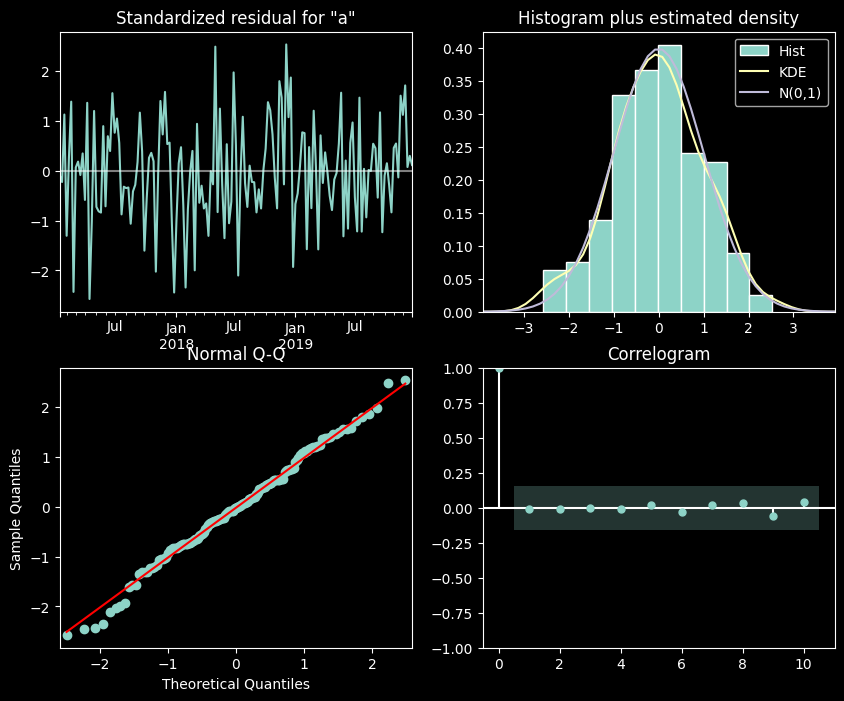

In [91]:
# Plots of the Q-Q plot
arima_model.plot_diagnostics(figsize=(10,8));

In [92]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(arima_model.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,0.086442,0.768750
2,0.141192,0.931838
3,0.591410,0.898396
4,1.230971,0.872974
5,1.384050,0.926050
6,1.456815,0.962311
7,2.037185,0.957754
8,2.168595,0.975402
9,2.526238,0.980170
10,2.832167,0.985102


In [93]:
# Forecasting the test set using both naive_model (using the last values) and arima
len_test = len(test)

arima_pred = arima_model.get_forecast(len_test).predicted_mean.values

naive_pred = train['accident_count'][len(train)-52:len(train)].values
test['naive_pred'] = naive_pred
test['arima_pred'] = arima_pred


test.head()

,accident_count,naive_pred,arima_pred
date,,,
2020-01-05,29,26,40.385073
2020-01-12,51,40,41.397487
2020-01-19,34,42,41.096770
2020-01-26,49,50,44.759456
2020-02-02,48,49,46.056834


In [94]:
# Evaluating

arima_mse = mean_squared_error(test['accident_count'],test['arima_pred'])
naive_mse = mean_squared_error(test['accident_count'],test['naive_pred'])

print(f"ARIMA RMSE: {arima_mse}")
print(f"Naive RMSE: {naive_mse}")

ARIMA RMSE: 256.17331540845316
Naive RMSE: 284.8269230769231


 Based on the scores, we can conclude that working with separate data is a much better idea

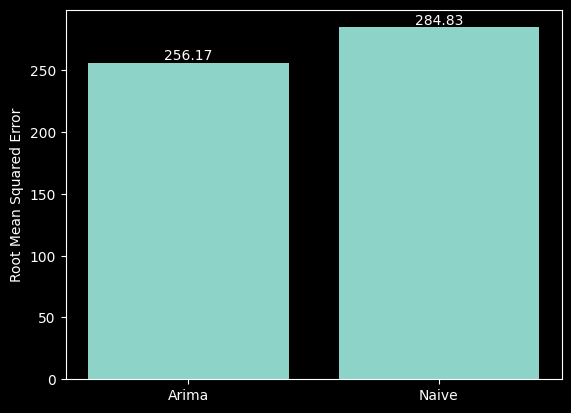

In [96]:
# Plotting the results 

list_mse = [arima_mse,naive_mse]
models = ['Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

Standard ARIMA is designed to capture:

Autoregressive (AR) relationships

Integrated (I) differencing to remove trends

Moving Average (MA) components

But it assumes that the data’s statistical properties (like mean and variance) are constant over time — no seasonal patterns.

So if your time series has clear, repeating cycles (e.g., monthly sales, yearly weather patterns), regular ARIMA will miss that.



As seen earlier, the original is periodic and non-stationary, throguh the above modelling, we have not considered the seasonal (periodic) component of the time-series, and that's why the results are showing that the modelling in inadequate.

In [97]:
def seasonal_difference(series, m):
  """
  Performs seasonal differencing on a time series.

  Args:
    series: A Pandas Series representing the time series data.
    m: The seasonal period (integer).

  Returns:
    A Pandas Series containing the seasonally differenced data.
  """
  return series.diff(m)

m = 52 because our data is weekly

In [98]:
m= 52
time_series = diff_1
differenced_series = seasonal_difference(time_series, m)

In [99]:
differenced_series

,accident_count
date,
2017-01-15,NaN
2017-01-22,NaN
2017-01-29,NaN
2017-02-05,NaN
2017-02-12,NaN
...,...
2020-11-29,7.0
2020-12-06,8.0
2020-12-13,11.0


There are 'm' NaN values in the differenced_series because they have no previous season to subtract from. So, we can drop these rows with NaNs.

In [100]:
differenced_series = differenced_series.dropna()

In [101]:
print(differenced_series)

            accident_count
date                      
2018-01-14            19.0
2018-01-21            11.0
2018-01-28           -22.0
2018-02-04             0.0
2018-02-11             6.0
...                    ...
2020-11-29             7.0
2020-12-06             8.0
2020-12-13            11.0
2020-12-20             3.0
2020-12-27           -14.0

[155 rows x 1 columns]


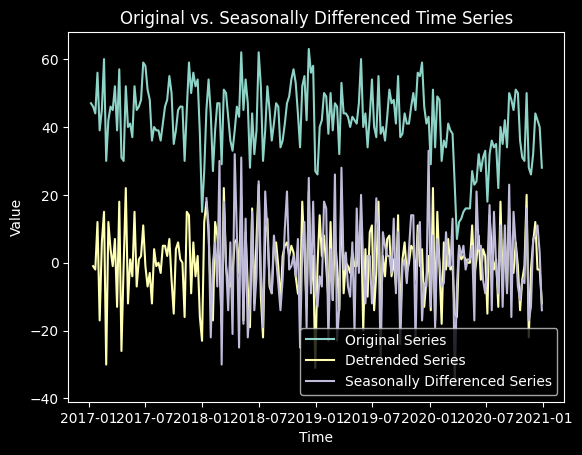

In [102]:
# Plot the original and differenced series to visualise the non-stationarity.
import matplotlib.pyplot as plt
plt.plot(weekly_accidents['accident_count'], label='Original Series')
plt.plot(time_series, label='Detrended Series')
plt.plot(differenced_series, label='Seasonally Differenced Series')
plt.title('Original vs. Seasonally Differenced Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


In [103]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(differenced_series)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -8.848759
p-value: 0.000000


As p-value is < 0.05 and ADF Statistic is close to or negative, the resulting differenced series is stationary.

plotting ACF and PACF up to 2×seasonal period (2*m) is a key step in identifying the right SARIMA model parameters.

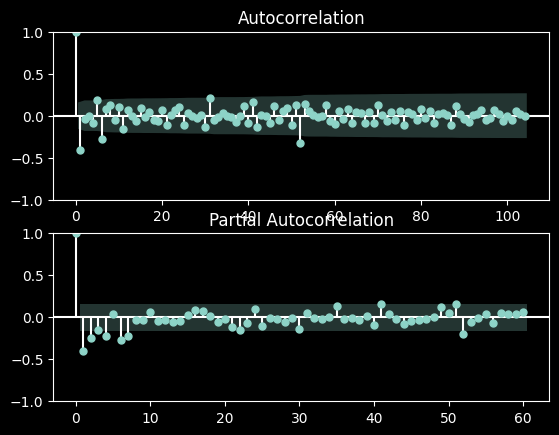

In [104]:
# Plot ACF and PACF of the DIFFERENCED data

fig, ax = plt.subplots(2, 1)
plot_acf(differenced_series, lags=104, ax=ax[0])  # Adjust lags as needed (often 2*m), here we are using 4*m
plot_pacf(differenced_series, lags=60, ax=ax[1])  # Adjust lags as needed
plt.show()

**ACF Plot (Top)**:

Overall Pattern: The ACF shows a  negative spike at lag 1, followed by values generally within the confidence interval (shaded area). There are some minor deviations outside of the shade line. The negative correlation is less than -0.5, so this not be the case of overdifferencing. 

Seasonal Lags (assuming m=52): The spikes around the seasonal lags (52, 104, etc) are close to or within the confidence bands, suggesting that the seasonal differencing has largely removed the seasonal autocorrelation.

**PACF Plot (Bottom)**:

Overall Pattern: The PACF has a negative spike at lag 1 and then gradualy dies off, falling well within the confidence interval for all subsequent lags. suggest that d=1 differencing may be fine. 

Seasonal Lags: (assuming m=52) Spikes around 52 is within the confidence interval.

In [105]:
#Using residual standard deviation to check overdifferencing
#The optimal order of differencing is often the order of differencing at which the standard deviation is lowest.

#d=0, D=0
#arima model with no differencing
arima_model_test = SARIMAX(endog=train, order=(0, 0,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.


In [106]:
print(arima_model_test.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:                        SARIMAX   Log Likelihood                -816.032
Date:                Sat, 12 Apr 2025   AIC                           1634.064
Time:                        13:09:27   BIC                           1637.114
Sample:                    01-08-2017   HQIC                          1635.303
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2046.8782    902.525      2.268      0.023     277.961    3815.795
Ljung-Box (L1) (Q):                   5.22   Jarque-Bera (JB):                 1.65
Prob(Q):                              0.02   Pr

here sigma2 is the variance of the residuals i.e. 2046.8782. Let's test again for d=1, D=0

In [107]:
#d=1, D=0.
#arima model with no differencing
arima_model_test1 = SARIMAX(endog=train, order=(0, 1,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test1.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -589.807
Date:                Sat, 12 Apr 2025   AIC                           1181.615
Time:                        13:09:37   BIC                           1184.658
Sample:                    01-08-2017   HQIC                          1182.851
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2       118.2300     13.619      8.681      0.000      91.537     144.922
Ljung-Box (L1) (Q):                  16.41   Jarque-Bera (JB):                 1.95
Prob(Q):                              0.00   Pr

here sigma2 is the variance of the residuals i.e. 118.2300.

In [74]:
#d=2 and D=0
#arima model with no differencing
arima_model_test2 = SARIMAX(endog=train, order=(0, 1,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test2.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -684.449
Date:                Sat, 12 Apr 2025   AIC                           1370.898
Time:                        13:05:56   BIC                           1373.941
Sample:                    01-08-2017   HQIC                          1372.134
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2       400.9137     38.306     10.466      0.000     325.835     475.993
Ljung-Box (L1) (Q):                  20.69   Jarque-Bera (JB):                12.45
Prob(Q):                              0.00   Pr

here sigma2 is the variance of the residuals i.e. 400.9137.

We have to select d and D where the residual variance is lowest. d=1, D=0 is the optimal differencing.

we can start by trying the following parameters as a baseline p=1, d=1, q=1 P=0, Q=2, m = 52, with original assumption m is 52


p (AR) = 1	Negative spike in PACF at lag 1

q (MA) = 1	Negative spike in ACF at lag 1

P (Seasonal AR)	0 or 1 (likely 0)	Seasonal lags in PACF show no significant spikes

Q (Seasonal MA)	0 or 1 (likely 0)	Seasonal lags in ACF show no significant spikes


In [138]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
sarima_model0 = SARIMAX(endog=train, order=(1, 1,1), seasonal_order=(0, 0 , 1, 52)).fit() #using original data for train, because differencing (d=1, D=1) taken care of during the model fitting.
print(sarima_model0.summary())

                                     SARIMAX Results                                      
Dep. Variable:                     accident_count   No. Observations:                  156
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 52)   Log Likelihood                -550.129
Date:                            Sat, 12 Apr 2025   AIC                           1108.257
Time:                                    13:23:05   BIC                           1120.431
Sample:                                01-08-2017   HQIC                          1113.202
                                     - 12-29-2019                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1752      0.083      2.118      0.034       0.013       0.337
ma.L1         -0.9999      6.303   

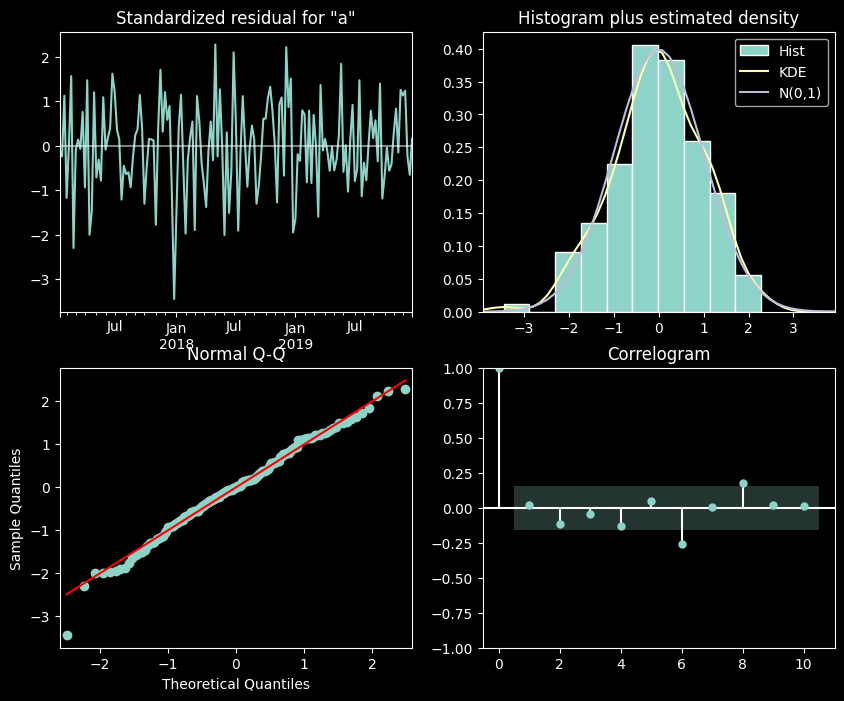

In [139]:
# Plots of the Q-Q plot
sarima_model0.plot_diagnostics(figsize=(10,8));

Let's analyze the provided diagnostics plots to assess the adequacy of your SARIMAX(1, 1, 1)x(0, 0, 1, 52) model:

1. Standardized Residuals (Top Left):

Pattern: The residuals appear to not be randomly distributed around zero.

2. Histogram Plus Estimated Density (Top Right):

Normality: The histogram of the residuals is bell-shaped . The histogram fits a curve to the data. 

3. Normal Q-Q Plot (Bottom Left):

Normality: The Q-Q plot assesses how well the data follows a normal distribution. If the data were perfectly normal, the points would fall exactly on the red line. TThis supports a normal distribution, with some possible outliers. (except from first point)
A perfect fit would see all points aligned along the red line, but small deviations are common and usually okay, as long as they don’t indicate major issues.


4. Correlogram (ACF of Residuals - Bottom Right):

Autocorrelation: The correlogram (ACF plot) shows the autocorrelation of the residuals. Ideally, we want the residuals to be uncorrelated, meaning that all the bars should be within the blue shaded area (the confidence interval). but In my plot, all the bars are almost within the blue band. This indicates that there are no statistically significant autocorrelations in the residuals, suggesting that the model has captured the autocorrelation structure in the data.

In [140]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model0.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,0.007270,0.932053
2,1.796668,0.407248
3,1.804106,0.614042
4,5.313692,0.256598
5,5.590535,0.348120
6,10.152923,0.118358
7,10.868030,0.144480
8,14.153930,0.077840
9,14.197193,0.115482
10,14.215629,0.163381


In [141]:
d=1
D=0
# Function to plot the aic (repeating from above)
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            print ('getting some error')
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df


In [142]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,3,1) # Order of AR
qs = np.arange(0,3,1) # Order of MA
ds = np.arange(1,3,1)
Ps = np.arange(0,3,1) # Seasonal order of AR
Qs = np.arange(0,3,1) # Seasonal order of MA
Ds = np.arange(1,3,1)
d=1 # 1 normal differencing 
D = 1 # 1 Seasonal differencing 
s= 12 # period
p_q_list = list(product(ps,ds, qs,Ps,Ds, Qs))
p_q_list[:5]

[(0, 1, 0, 0, 1, 0),
 (0, 1, 0, 0, 1, 1),
 (0, 1, 0, 0, 1, 2),
 (0, 1, 0, 0, 2, 0),
 (0, 1, 0, 0, 2, 1)]

In [143]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,3,1) # Order of AR
qs = np.arange(0,3,1) # Order of MA
Ps = np.arange(0,3,1) # Seasonal order of AR
Qs = np.arange(0,3,1) # Seasonal order of MA
d=1 # 1 normal differencing 
D = 1 # 1 Seasonal differencing 
s= 12 # period
p_q_list = list(product(ps,qs,Ps,Qs))


aic_df = aic_values(train)

aic_df

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [01:17<00:00,  1.04it/s]


,"Order(p,q,Ps,QS)",AIC
49,"(1, 2, 1, 1)",1044.490467
22,"(0, 2, 1, 1)",1044.947338
52,"(1, 2, 2, 1)",1045.266759
67,"(2, 1, 1, 1)",1045.866944
50,"(1, 2, 1, 2)",1046.016284
...,...,...
36,"(1, 1, 0, 0)",1131.077088
9,"(0, 1, 0, 0)",1135.665380
54,"(2, 0, 0, 0)",1171.265447
27,"(1, 0, 0, 0)",1183.495802


In [144]:
# Fitting the SARIMA model based on the lowest AIC
sarima_model = SARIMAX(endog=train, order=(1, 1,2), seasonal_order=(1, 0, 1, 52)).fit()
sarima_model

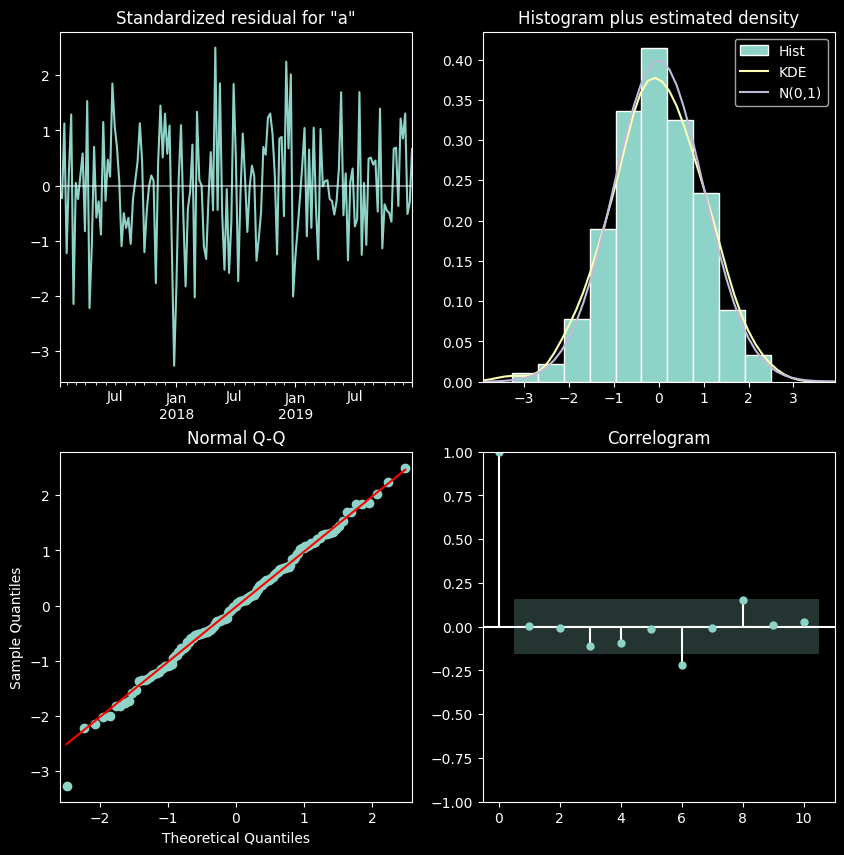

In [145]:
# Q-Q plot
sarima_model.plot_diagnostics(figsize = (10,10))
plt.show()

In [146]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model.resid)

,lb_stat,lb_pvalue
1,0.000888,0.976224
2,0.038238,0.981063
3,0.326499,0.954970
4,2.687036,0.611485
5,2.687632,0.748009
6,5.774719,0.448894
7,6.682444,0.462675
8,9.346801,0.313890
9,9.351973,0.405439
10,9.558144,0.480075


In [147]:
# Making predictions with the model
len_test = len(test) # this also referred to as the window of forecast
sarima_pred = sarima_model.get_forecast(len_test)
sarima_pred = sarima_pred.predicted_mean

sarima_pred

2020-01-05    40.345291
2020-01-12    43.766304
2020-01-19    45.586354
2020-01-26    46.639605
2020-02-02    41.974264
2020-02-09    42.809310
2020-02-16    47.772103
2020-02-23    42.014119
2020-03-01    42.320896
2020-03-08    45.788727
2020-03-15    43.553247
2020-03-22    46.493169
2020-03-29    42.450383
2020-04-05    44.528222
2020-04-12    41.616956
2020-04-19    42.032562
2020-04-26    45.090319
2020-05-03    45.935275
2020-05-10    43.561092
2020-05-17    45.105068
2020-05-24    48.037777
2020-05-31    41.603105
2020-06-07    44.537261
2020-06-14    41.734577
2020-06-21    45.503656
2020-06-28    50.120952
2020-07-05    45.785749
2020-07-12    41.877098
2020-07-19    43.997161
2020-07-26    43.977514
2020-08-02    43.142802
2020-08-09    41.324489
2020-08-16    42.589685
2020-08-23    45.245670
2020-08-30    45.238022
2020-09-06    43.981459
2020-09-13    44.248475
2020-09-20    46.220004
2020-09-27    42.444836
2020-10-04    43.420193
2020-10-11    45.793750
2020-10-18    45

In [148]:
# Assiging the prediction to the test set dataframe 
test['sarima_pred'] = sarima_pred
test.head()

,accident_count,naive_pred,arima_pred,sarima_pred
date,,,,
2020-01-05,29,26,40.385073,40.345291
2020-01-12,51,40,41.397487,43.766304
2020-01-19,34,42,41.096770,45.586354
2020-01-26,49,50,44.759456,46.639605
2020-02-02,48,49,46.056834,41.974264


In [149]:
# Evaluation
from sklearn.metrics import mean_squared_error
# Evaluation of the model against the test set
sarima_mse = mean_squared_error(test['accident_count'],test['sarima_pred'], squared=False)
sarima_mse

16.1007398310207

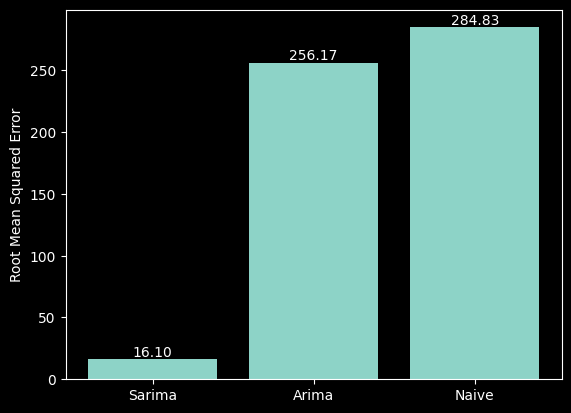

In [150]:
# Plot of the results of all the models

list_mse = [sarima_mse,arima_mse,naive_mse]
models = ['Sarima','Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

The scores have improved significantly, and we will apply the same approach to the other two areas as well.

In [128]:
#police_force code = 
# 21	North Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 21
AND accident_year BETWEEN 2017 AND 2020;
''')

# Fetch all results
results = cur.fetchall()


# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)

,date,police_force
0,2017-01-01,21
1,2017-01-02,21
2,2017-01-02,21
3,2017-01-02,21
4,2017-01-02,21


In [129]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,3
2017-01-08,38
2017-01-15,56
2017-01-22,46
2017-01-29,50
...,...
2020-12-06,21
2020-12-13,20
2020-12-20,20


In [130]:
# drop the last row because its blongs to 2021
# drop the first row because its low
weekly_accidents = weekly_accidents.iloc[1:-1]
weekly_accidents

,accident_count
date,
2017-01-08,38
2017-01-15,56
2017-01-22,46
2017-01-29,50
2017-02-05,47
...,...
2020-11-29,12
2020-12-06,21
2020-12-13,20


<Figure size 300x300 with 0 Axes>

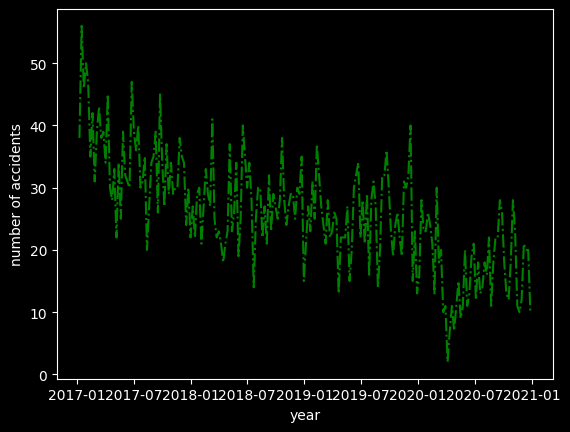

<Figure size 300x300 with 0 Axes>

In [131]:
# visualisation of the data 
plt.plot(weekly_accidents[['accident_count']],'g-.')
plt.xlabel('year')
plt.ylabel('number of accidents')
plt.figure(figsize= (3, 3))

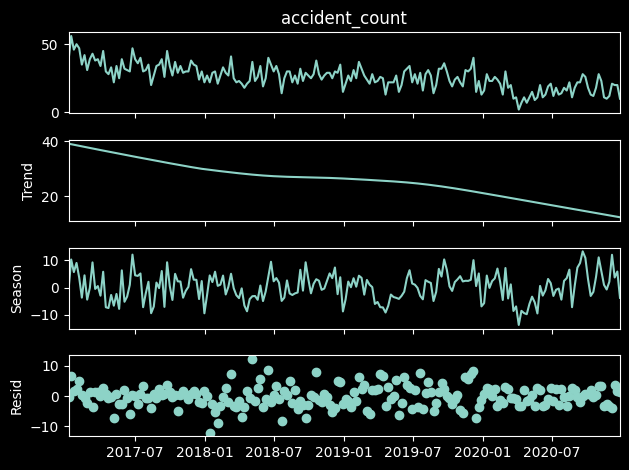

In [132]:
# Decomposition of the series
from statsmodels.tsa.seasonal import STL
STL(weekly_accidents['accident_count']).fit().plot()
plt.show()

In [133]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(weekly_accidents['accident_count'])[:2]

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")
# if above 0.05, data is not stationary

ADF Statistic: -2.5546415672982414; p-value 0.10273890508415501


In [134]:
# Applying differencing to for stationarity
diff_1 = weekly_accidents[['accident_count']].diff(1).dropna()
diff_1

,accident_count
date,
2017-01-15,18.0
2017-01-22,-10.0
2017-01-29,4.0
2017-02-05,-3.0
2017-02-12,-12.0
...,...
2020-11-29,2.0
2020-12-06,9.0
2020-12-13,-1.0


In [135]:
ADF_test = adfuller(diff_1['accident_count'])[:2]

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")
# if above 0.05, data is not stationary

ADF Statistic: -9.89512505181066; p-value 3.4742948342686645e-17


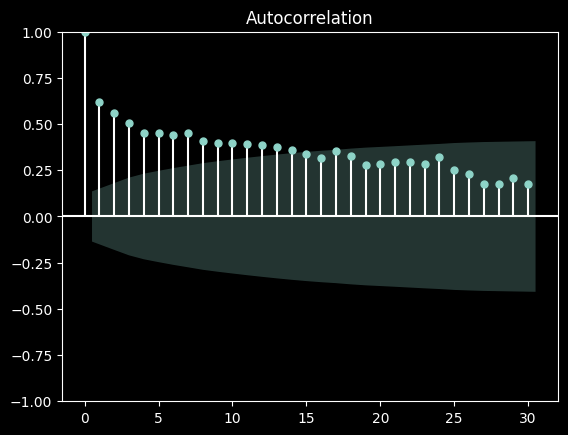

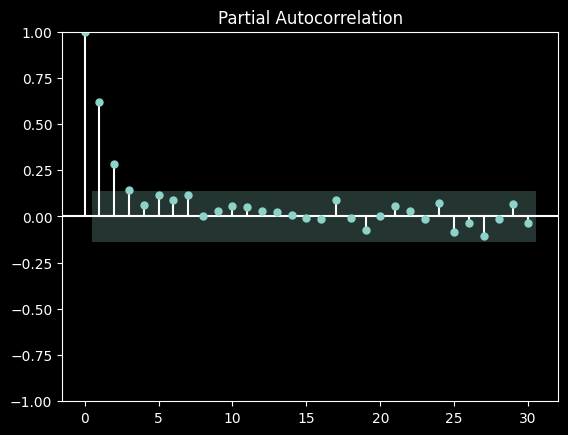

In [136]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents['accident_count'], lags=30)
plot_pacf(weekly_accidents['accident_count'], lags=30)
plt.show()

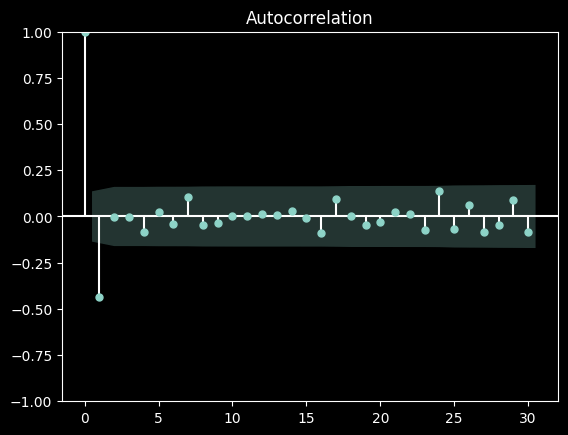

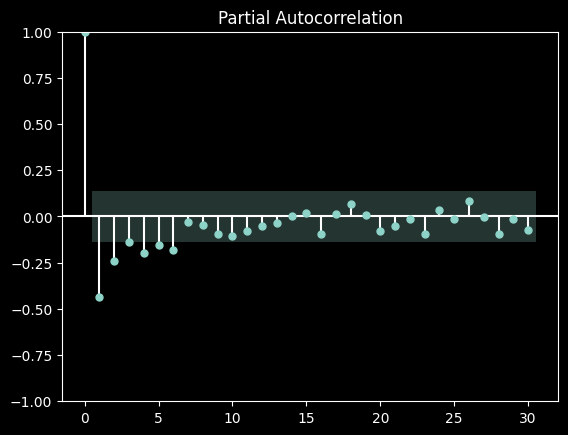

In [137]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(diff_1, lags=30)
plot_pacf(diff_1, lags=30)
plt.show()

In [138]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,8,1) # Order of AR
qs = np.arange(0,8,1) # Order of MA
Ps = [0] # Seasonal order of AR (taught in week 7)
Qs = [0] # Seasonal order of MA (taught in week 7)
d= 1 # two-order differencing
D = 0 # Seasonal differencing (taught in week 7)
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

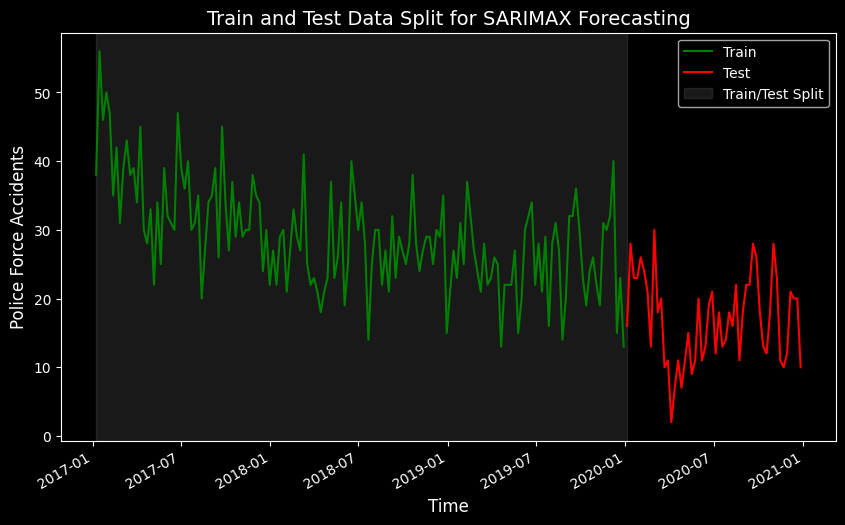

In [139]:
# Splitting the dataset into train and test set
train = weekly_accidents[['accident_count']][:-52]  # all the data before the last 52 weeks
test = weekly_accidents[['accident_count']][-52:]   # last 52 weeks for testing

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot training and test sets
ax.plot(train.index, train['accident_count'], 'g-', label='Train')  # Green line for train data
ax.plot(test.index, test['accident_count'], 'r-', label='Test')    # Red line for test data

# Highlight the training data region with a shaded area
ax.axvspan(train.index[0], test.index[0], alpha=0.2, color='gray', label="Train/Test Split")

# Labeling and formatting
ax.set_xlabel('Time', fontsize=12)
ax.set_ylabel('Police Force Accidents', fontsize=12)  # Adjust this label based on your data
ax.set_title('Train and Test Data Split for SARIMAX Forecasting', fontsize=14)
fig.autofmt_xdate()  # Rotates date labels if the x-axis is a date

# Display the legend
plt.legend()

# Show the plot
plt.show()

In [140]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress bar
# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [00:20<00:00,  3.07it/s]


In [141]:
aic_df

,"Order(p,q,Ps,QS)",AIC
1,"(0, 1, 0, 0)",1025.836714
9,"(1, 1, 0, 0)",1026.181955
2,"(0, 2, 0, 0)",1026.469933
3,"(0, 3, 0, 0)",1027.146976
17,"(2, 1, 0, 0)",1027.193078
...,...,...
40,"(5, 0, 0, 0)",1043.111736
24,"(3, 0, 0, 0)",1045.203750
16,"(2, 0, 0, 0)",1045.984172
8,"(1, 0, 0, 0)",1054.847950


In [142]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
arima_model = ARIMA(endog=train, order=(0, 1 ,1)).fit()

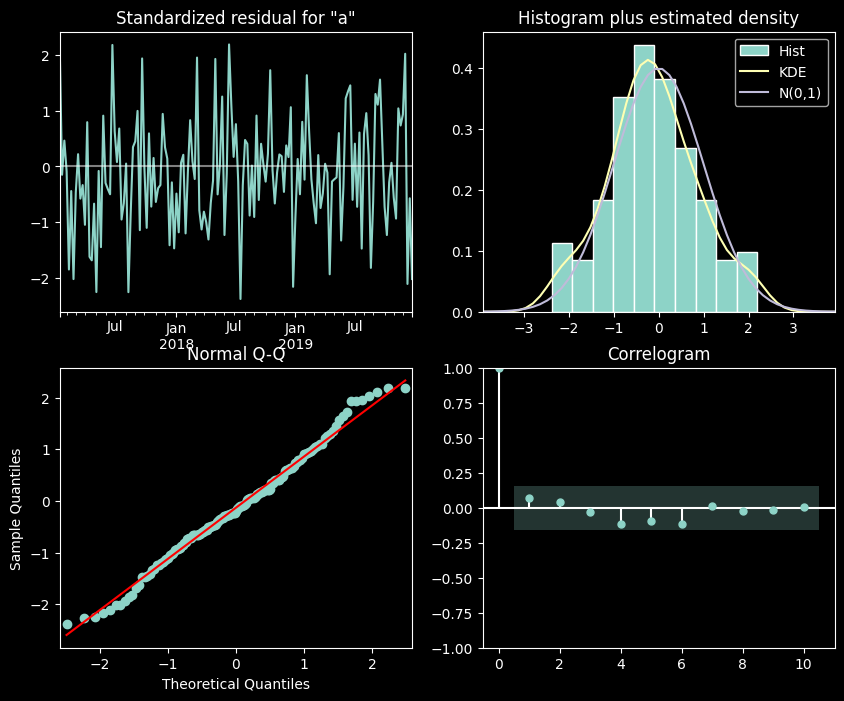

In [143]:
# Plots of the Q-Q plot
arima_model.plot_diagnostics(figsize=(10,8));

In [144]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(arima_model.resid) #returns test score for first 10 lags

,lb_stat,lb_pvalue
1,3.453337,0.063124
2,3.653245,0.160956
3,3.656258,0.301054
4,5.273400,0.260377
5,8.048514,0.153582
6,10.097602,0.120601
7,10.519880,0.160976
8,10.676647,0.220702
9,10.682767,0.298082
10,10.699816,0.381378


In [145]:
# Forecasting the test set using both naive_model (using the last values) and arima
len_test = len(test)

arima_pred = arima_model.get_forecast(len_test).predicted_mean.values

naive_pred = train['accident_count'][len(train)-52:len(train)].values
test['naive_pred'] = naive_pred
test['arima_pred'] = arima_pred


test.head()

,accident_count,naive_pred,arima_pred
date,,,
2020-01-05,16,21,24.234575
2020-01-12,28,27,24.234575
2020-01-19,23,23,24.234575
2020-01-26,23,31,24.234575
2020-02-02,26,25,24.234575


In [146]:
# Evaluating

arima_mse = mean_squared_error(test['accident_count'],test['arima_pred'])
naive_mse = mean_squared_error(test['accident_count'],test['naive_pred'])

print(f"ARIMA RMSE: {arima_mse}")
print(f"Naive RMSE: {naive_mse}")

ARIMA RMSE: 94.21894176360603
Naive RMSE: 127.96153846153847


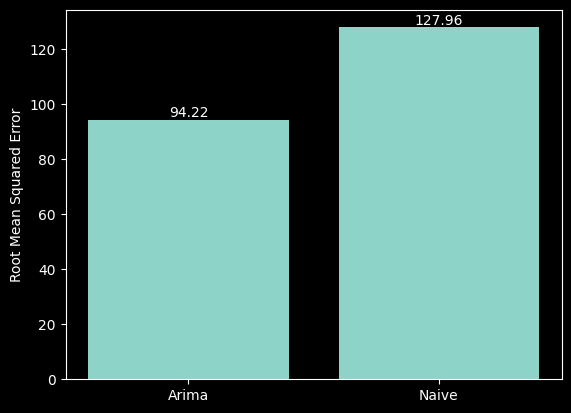

In [147]:
# Plotting the results 

list_mse = [arima_mse,naive_mse]
models = ['Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

In [148]:
def seasonal_difference(series, m):
  """
  Performs seasonal differencing on a time series.

  Args:
    series: A Pandas Series representing the time series data.
    m: The seasonal period (integer).

  Returns:
    A Pandas Series containing the seasonally differenced data.
  """
  return series.diff(m)

In [149]:
m= 52
time_series = diff_1
differenced_series = seasonal_difference(time_series, m)

In [150]:
differenced_series

,accident_count
date,
2017-01-15,NaN
2017-01-22,NaN
2017-01-29,NaN
2017-02-05,NaN
2017-02-12,NaN
...,...
2020-11-29,0.0
2020-12-06,1.0
2020-12-13,24.0


In [151]:
differenced_series = differenced_series.dropna()

In [152]:
print(differenced_series)

            accident_count
date                      
2018-01-14           -23.0
2018-01-21            17.0
2018-01-28            -3.0
2018-02-04            -6.0
2018-02-11            18.0
...                    ...
2020-11-29             0.0
2020-12-06             1.0
2020-12-13            24.0
2020-12-20            -8.0
2020-12-27             0.0

[155 rows x 1 columns]


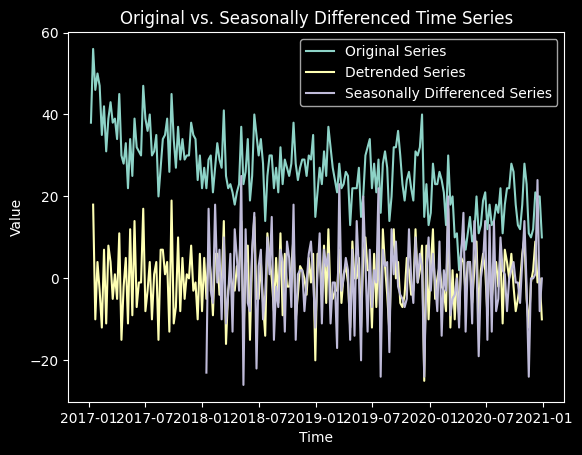

In [153]:
# Plot the original and differenced series to visualise the non-stationarity.
import matplotlib.pyplot as plt
plt.plot(weekly_accidents['accident_count'], label='Original Series')
plt.plot(time_series, label='Detrended Series')
plt.plot(differenced_series, label='Seasonally Differenced Series')
plt.title('Original vs. Seasonally Differenced Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


In [154]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(differenced_series)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -8.535008
p-value: 0.000000


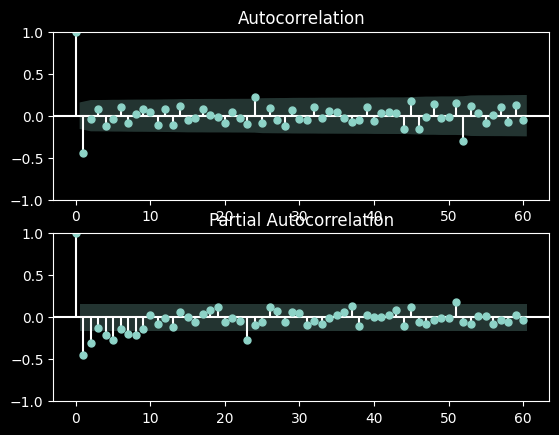

In [155]:
# Plot ACF and PACF of the DIFFERENCED data

fig, ax = plt.subplots(2, 1)
plot_acf(differenced_series, lags=60, ax=ax[0])  # Adjust lags as needed (often 2*m), here we are using 4*m
plot_pacf(differenced_series, lags=60, ax=ax[1])  # Adjust lags as needed
plt.show()

In [156]:
#d=0, D=0
#arima model with no differencing
arima_model_test = SARIMAX(endog=train, order=(0, 0,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.


In [157]:
print(arima_model_test.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:                        SARIMAX   Log Likelihood                -752.043
Date:                Fri, 11 Apr 2025   AIC                           1506.087
Time:                        18:38:35   BIC                           1509.137
Sample:                    01-08-2017   HQIC                          1507.325
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2       901.1795    269.921      3.339      0.001     372.144    1430.215
Ljung-Box (L1) (Q):                  27.89   Jarque-Bera (JB):                 8.09
Prob(Q):                              0.00   Pr

In [158]:
#d=1, D=0.
#arima model with no differencing
arima_model_test1 = SARIMAX(endog=train, order=(0, 1,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test1.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -545.200
Date:                Fri, 11 Apr 2025   AIC                           1092.400
Time:                        18:38:43   BIC                           1095.443
Sample:                    01-08-2017   HQIC                          1093.636
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2        66.4839      8.028      8.281      0.000      50.749      82.219
Ljung-Box (L1) (Q):                  34.43   Jarque-Bera (JB):                 1.15
Prob(Q):                              0.00   Pr

In [160]:
#d=2 and D=0
#arima model with no differencing
arima_model_test2 = SARIMAX(endog=train, order=(0, 2,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test2.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:               SARIMAX(0, 2, 0)   Log Likelihood                -623.925
Date:                Fri, 11 Apr 2025   AIC                           1249.850
Time:                        18:39:37   BIC                           1252.887
Sample:                    01-08-2017   HQIC                          1251.083
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2       193.4732     25.609      7.555      0.000     143.280     243.666
Ljung-Box (L1) (Q):                  66.54   Jarque-Bera (JB):                 1.89
Prob(Q):                              0.00   Pr

In [164]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
sarima_model0 = SARIMAX(endog=train, order=(0, 1,0), seasonal_order=(0, 0 , 1, 52)).fit() #using original data for train, because differencing (d=1, D=1) taken care of during the model fitting.
print(sarima_model0.summary())

                                      SARIMAX Results                                       
Dep. Variable:                       accident_count   No. Observations:                  156
Model:             SARIMAX(0, 1, 0)x(0, 0, [1], 52)   Log Likelihood                -544.758
Date:                              Fri, 11 Apr 2025   AIC                           1093.515
Time:                                      18:41:16   BIC                           1099.602
Sample:                                  01-08-2017   HQIC                          1095.987
                                       - 12-29-2019                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L52       0.0906      0.111      0.816      0.414      -0.127       0.308
sigma2        65.92

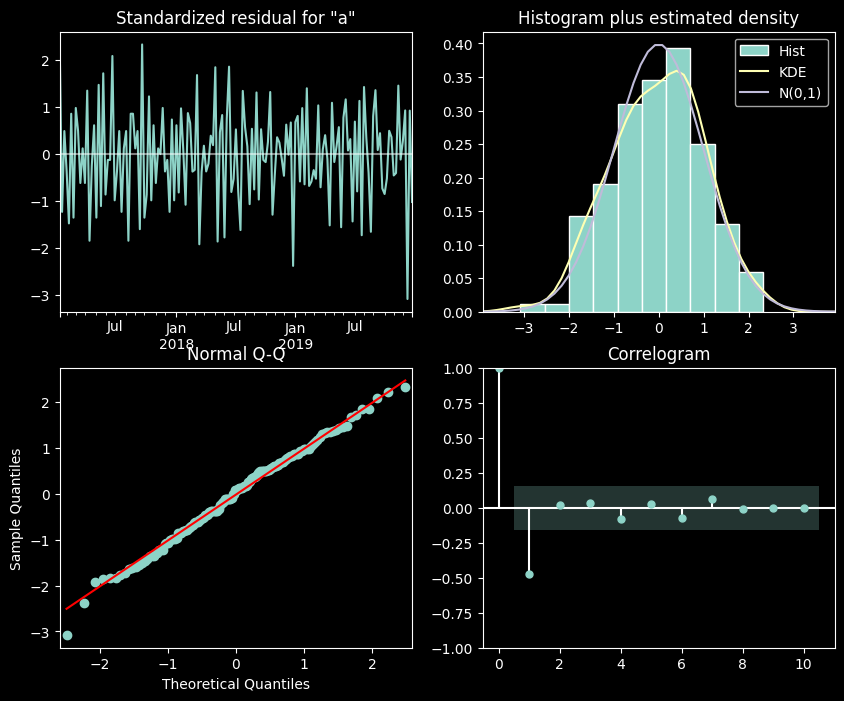

In [165]:
# Plots of the Q-Q plot
sarima_model0.plot_diagnostics(figsize=(10,8));

In [166]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model0.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,20.004954,0.000008
2,20.039245,0.000045
3,20.344962,0.000144
4,21.405345,0.000263
5,21.452687,0.000665
6,21.768082,0.001334
7,21.829155,0.002719
8,21.869548,0.005163
9,21.897850,0.009208
10,21.965551,0.015281


In [167]:
d=1
D=0
# Function to plot the aic (repeating from above)
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            print ('getting some error')
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df


In [168]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,3,1) # Order of AR
qs = np.arange(0,3,1) # Order of MA
ds = np.arange(1,3,1)
Ps = np.arange(0,3,1) # Seasonal order of AR
Qs = np.arange(0,3,1) # Seasonal order of MA
Ds = np.arange(1,3,1)
d=1 # 1 normal differencing 
D = 1 # 1 Seasonal differencing 
s= 12 # period
p_q_list = list(product(ps,ds, qs,Ps,Ds, Qs))
p_q_list[:5]

[(0, 1, 0, 0, 1, 0),
 (0, 1, 0, 0, 1, 1),
 (0, 1, 0, 0, 1, 2),
 (0, 1, 0, 0, 2, 0),
 (0, 1, 0, 0, 2, 1)]

In [169]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,3,1) # Order of AR
qs = np.arange(0,3,1) # Order of MA
Ps = np.arange(0,3,1) # Seasonal order of AR
Qs = np.arange(0,3,1) # Seasonal order of MA
d=1 # 1 normal differencing 
D = 1 # 1 Seasonal differencing 
s= 12 # period
p_q_list = list(product(ps,qs,Ps,Qs))


aic_df = aic_values(train)

aic_df

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [01:19<00:00,  1.02it/s]


,"Order(p,q,Ps,QS)",AIC
40,"(1, 1, 1, 1)",967.863429
13,"(0, 1, 1, 1)",968.115793
22,"(0, 2, 1, 1)",968.196429
11,"(0, 1, 0, 2)",968.694662
38,"(1, 1, 0, 2)",968.798818
...,...,...
63,"(2, 1, 0, 0)",1036.216178
3,"(0, 0, 1, 0)",1036.463983
54,"(2, 0, 0, 0)",1059.480384
27,"(1, 0, 0, 0)",1072.652740


In [170]:
# Fitting the SARIMA model based on the lowest AIC
sarima_model = SARIMAX(endog=train, order=(1, 1,1), seasonal_order=(1, 0, 1, 52)).fit()
sarima_model

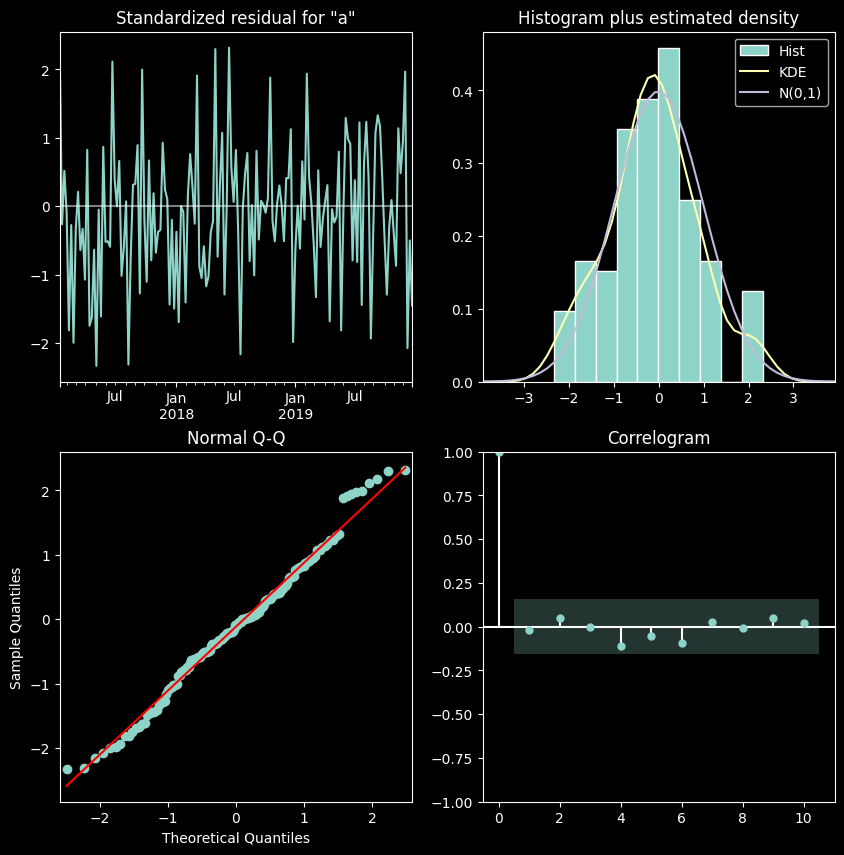

In [171]:
# Q-Q plot
sarima_model.plot_diagnostics(figsize = (10,10))
plt.show()

In [172]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model.resid)

,lb_stat,lb_pvalue
1,0.904844,0.341486
2,1.139323,0.565717
3,1.217393,0.748836
4,2.554837,0.634844
5,4.120897,0.532144
6,5.391675,0.494645
7,5.637888,0.582608
8,5.652425,0.686100
9,6.004835,0.739434
10,6.005298,0.814818


In [173]:
# Making predictions with the model
len_test = len(test) # this also referred to as the window of forecast
sarima_pred = sarima_model.get_forecast(len_test)
sarima_pred = sarima_pred.predicted_mean

print(sarima_pred)

2020-01-05    21.973230
2020-01-12    25.154533
2020-01-19    24.317435
2020-01-26    26.028398
2020-02-02    23.674935
2020-02-09    24.495525
2020-02-16    25.520234
2020-02-23    22.918071
2020-03-01    23.292938
2020-03-08    25.238242
2020-03-15    23.431921
2020-03-22    22.376451
2020-03-29    21.993870
2020-04-05    23.549134
2020-04-12    21.090067
2020-04-19    19.636677
2020-04-26    21.732617
2020-05-03    22.138941
2020-05-10    21.861658
2020-05-17    21.752587
2020-05-24    23.015917
2020-05-31    20.817501
2020-06-07    22.793057
2020-06-14    24.884629
2020-06-21    26.690689
2020-06-28    23.419752
2020-07-05    24.347552
2020-07-12    23.155756
2020-07-19    21.097266
2020-07-26    20.942087
2020-08-02    23.696860
2020-08-09    22.157880
2020-08-16    21.489018
2020-08-23    21.325611
2020-08-30    21.465450
2020-09-06    25.002698
2020-09-13    22.151451
2020-09-20    25.914556
2020-09-27    23.441006
2020-10-04    21.351408
2020-10-11    22.504208
2020-10-18    23

In [174]:
# Assiging the prediction to the test set dataframe 
test['sarima_pred'] = sarima_pred
test.head()

,accident_count,naive_pred,arima_pred,sarima_pred
date,,,,
2020-01-05,16,21,24.234575,21.973230
2020-01-12,28,27,24.234575,25.154533
2020-01-19,23,23,24.234575,24.317435
2020-01-26,23,31,24.234575,26.028398
2020-02-02,26,25,24.234575,23.674935


In [175]:
# Evaluation
from sklearn.metrics import mean_squared_error
# Evaluation of the model against the test set
sarima_mse = mean_squared_error(test['accident_count'],test['sarima_pred'], squared=False)
sarima_mse

8.465851315069312

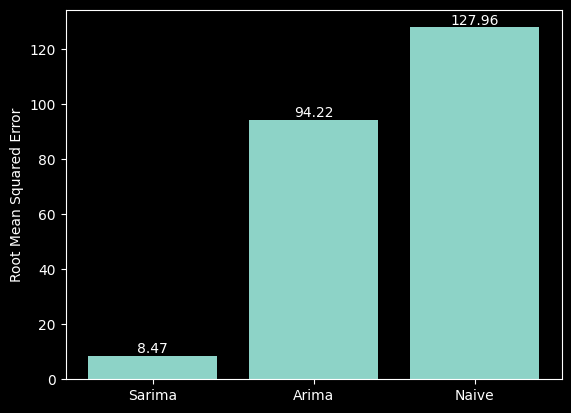

In [176]:
# Plot of the results of all the models

list_mse = [sarima_mse,arima_mse,naive_mse]
models = ['Sarima','Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

In [177]:
#police_force code = 
# 22 West Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 22
AND accident_year BETWEEN 2017 AND 2020;
''')

# Fetch all results
results = cur.fetchall()


# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)

,date,police_force
0,2017-01-04,22
1,2017-01-13,22
2,2017-01-19,22
3,2017-01-23,22
4,2017-01-12,22


In [178]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,3
2017-01-08,26
2017-01-15,30
2017-01-22,32
2017-01-29,36
...,...
2020-12-06,43
2020-12-13,35
2020-12-20,36


In [179]:
# drop the last row because its blongs to 2021
# drop the first row because its low
weekly_accidents = weekly_accidents.iloc[1:-1]
weekly_accidents

,accident_count
date,
2017-01-08,26
2017-01-15,30
2017-01-22,32
2017-01-29,36
2017-02-05,56
...,...
2020-11-29,37
2020-12-06,43
2020-12-13,35


<Figure size 300x300 with 0 Axes>

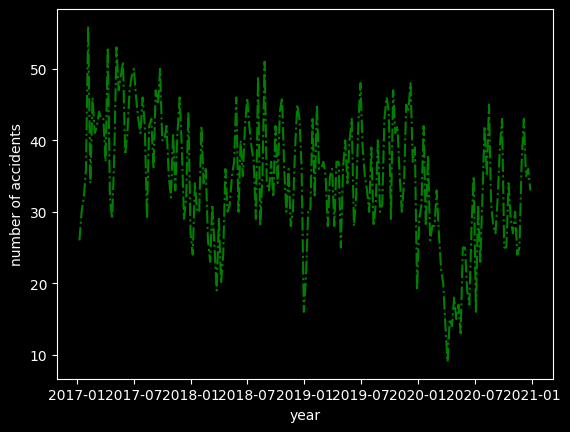

<Figure size 300x300 with 0 Axes>

In [180]:
# visualisation of the data 
plt.plot(weekly_accidents[['accident_count']],'g-.')
plt.xlabel('year')
plt.ylabel('number of accidents')
plt.figure(figsize= (3, 3))

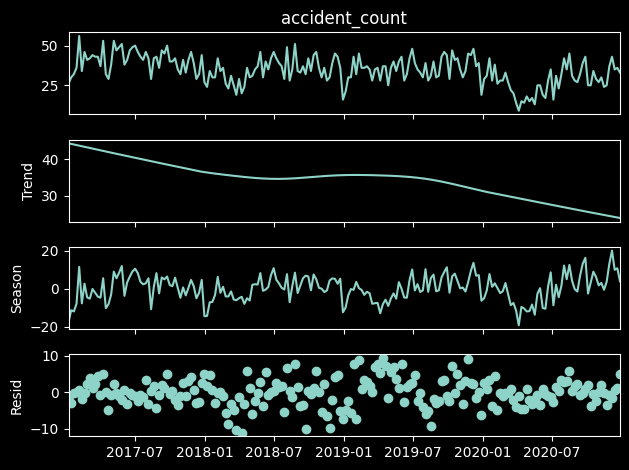

In [181]:
# Decomposition of the series
from statsmodels.tsa.seasonal import STL
STL(weekly_accidents['accident_count']).fit().plot()
plt.show()

In [182]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(weekly_accidents['accident_count'])[:2]

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")
# if above 0.05, data is not stationary

ADF Statistic: -2.683589616213309; p-value 0.0769212852886549


In [183]:
# Applying differencing to for stationarity
diff_1 = weekly_accidents[['accident_count']].diff(1).dropna()
diff_1 

,accident_count
date,
2017-01-15,4.0
2017-01-22,2.0
2017-01-29,4.0
2017-02-05,20.0
2017-02-12,-22.0
...,...
2020-11-29,12.0
2020-12-06,6.0
2020-12-13,-8.0


In [184]:
ADF_test = adfuller(diff_1['accident_count'])[:2]

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")
# if above 0.05, data is not stationary

ADF Statistic: -10.586084840305697; p-value 6.711421883411861e-19


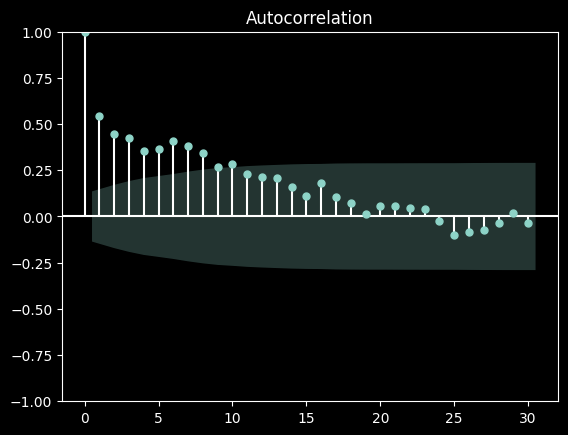

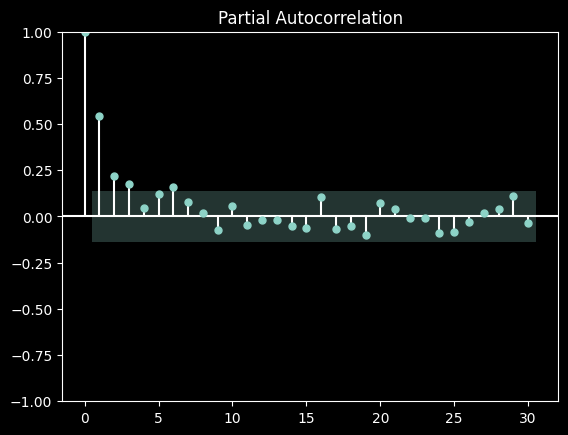

In [185]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents['accident_count'], lags=30)
plot_pacf(weekly_accidents['accident_count'], lags=30)
plt.show()

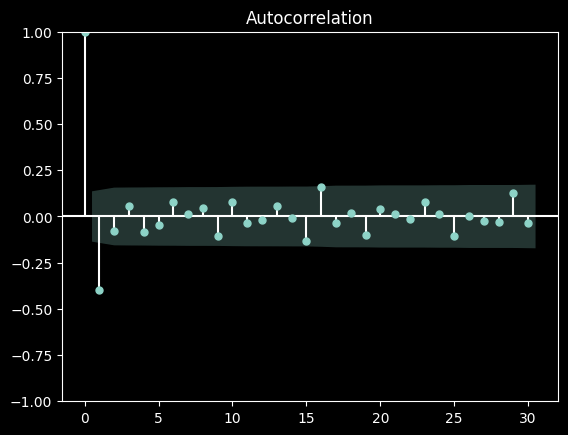

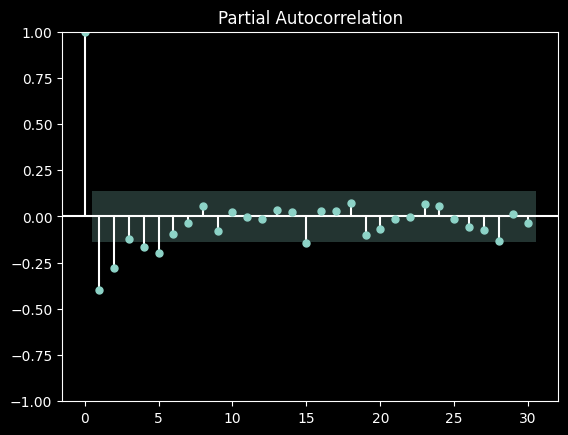

In [186]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(diff_1, lags=30)
plot_pacf(diff_1, lags=30)
plt.show()

In [187]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,8,1) # Order of AR
qs = np.arange(0,8,1) # Order of MA
Ps = [0] # Seasonal order of AR (taught in week 7)
Qs = [0] # Seasonal order of MA (taught in week 7)
d= 1 # two-order differencing
D = 0 # Seasonal differencing (taught in week 7)
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

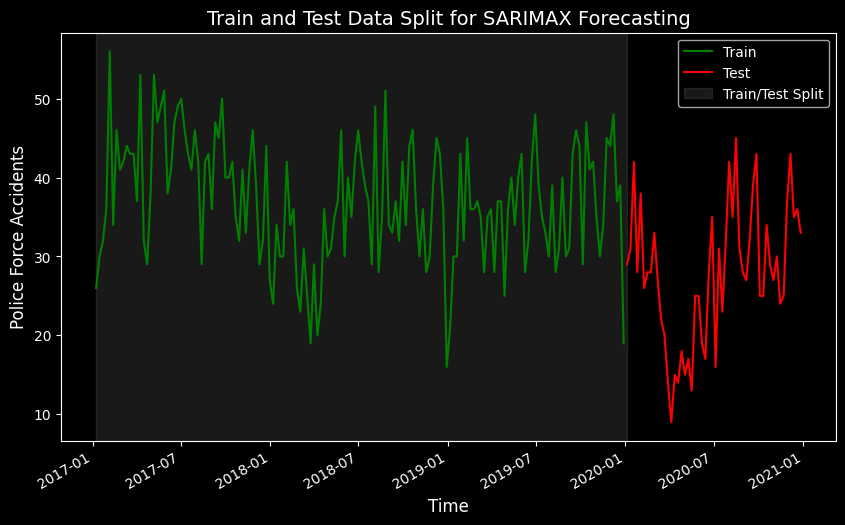

In [188]:
# Splitting the dataset into train and test set
train = weekly_accidents[['accident_count']][:-52]  # all the data before the last 52 weeks
test = weekly_accidents[['accident_count']][-52:]   # last 52 weeks for testing

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot training and test sets
ax.plot(train.index, train['accident_count'], 'g-', label='Train')  # Green line for train data
ax.plot(test.index, test['accident_count'], 'r-', label='Test')    # Red line for test data

# Highlight the training data region with a shaded area
ax.axvspan(train.index[0], test.index[0], alpha=0.2, color='gray', label="Train/Test Split")

# Labeling and formatting
ax.set_xlabel('Time', fontsize=12)
ax.set_ylabel('Police Force Accidents', fontsize=12)  # Adjust this label based on your data
ax.set_title('Train and Test Data Split for SARIMAX Forecasting', fontsize=14)
fig.autofmt_xdate()  # Rotates date labels if the x-axis is a date

# Display the legend
plt.legend()

# Show the plot
plt.show()

In [189]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress bar
# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [00:20<00:00,  3.12it/s]


In [190]:
aic_df

,"Order(p,q,Ps,QS)",AIC
2,"(0, 2, 0, 0)",1058.775095
9,"(1, 1, 0, 0)",1058.813027
1,"(0, 1, 0, 0)",1060.039154
10,"(1, 2, 0, 0)",1060.475367
3,"(0, 3, 0, 0)",1060.762907
...,...,...
32,"(4, 0, 0, 0)",1072.913534
16,"(2, 0, 0, 0)",1075.472198
24,"(3, 0, 0, 0)",1076.378382
8,"(1, 0, 0, 0)",1089.231606


In [191]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
arima_model = ARIMA(endog=train, order=(0, 1 ,2)).fit()

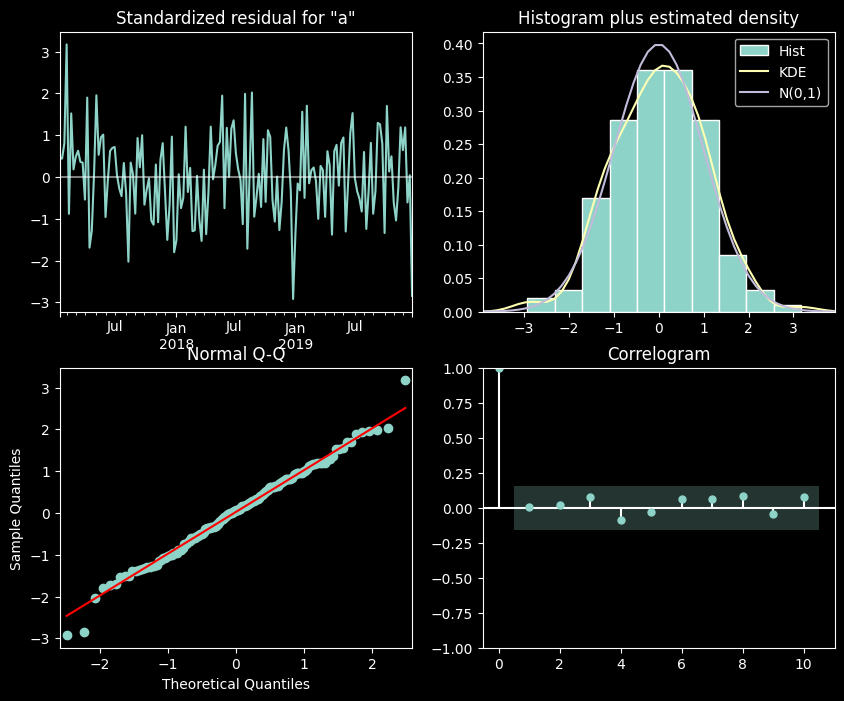

In [192]:
# Plots of the Q-Q plot
arima_model.plot_diagnostics(figsize=(10,8));

In [193]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(arima_model.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,0.034719,0.852186
2,0.184977,0.911660
3,1.575015,0.665068
4,1.601609,0.808503
5,1.969984,0.853283
6,3.270653,0.774190
7,3.941123,0.786533
8,5.268250,0.728558
9,5.356962,0.802147
10,6.294050,0.789983


In [194]:
# Forecasting the test set using both naive_model (using the last values) and arima
len_test = len(test)

arima_pred = arima_model.get_forecast(len_test).predicted_mean.values

naive_pred = train['accident_count'][len(train)-52:len(train)].values
test['naive_pred'] = naive_pred
test['arima_pred'] = arima_pred


test.head()

,accident_count,naive_pred,arima_pred
date,,,
2020-01-05,29,21,33.11004
2020-01-12,31,30,36.29579
2020-01-19,42,30,36.29579
2020-01-26,28,43,36.29579
2020-02-02,38,32,36.29579


In [195]:
# Evaluating

arima_mse = mean_squared_error(test['accident_count'],test['arima_pred'])
naive_mse = mean_squared_error(test['accident_count'],test['naive_pred'])

print(f"ARIMA RMSE: {arima_mse}")
print(f"Naive RMSE: {naive_mse}")

ARIMA RMSE: 146.71156860217235
Naive RMSE: 164.96153846153845


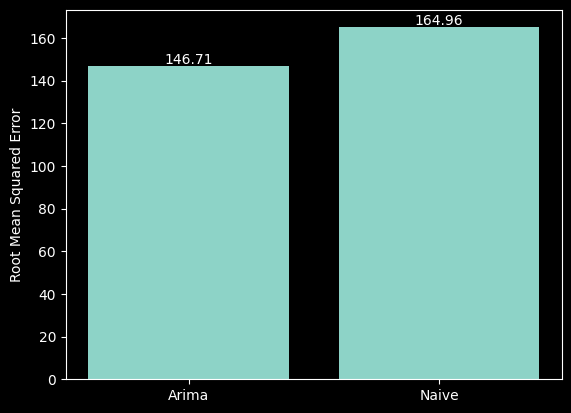

In [196]:
# Plotting the results 

list_mse = [arima_mse,naive_mse]
models = ['Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

In [197]:
def seasonal_difference(series, m):
  """
  Performs seasonal differencing on a time series.

  Args:
    series: A Pandas Series representing the time series data.
    m: The seasonal period (integer).

  Returns:
    A Pandas Series containing the seasonally differenced data.
  """
  return series.diff(m)



m= 52
time_series = diff_1
differenced_series = seasonal_difference(time_series, m)


differenced_series

,accident_count
date,
2017-01-15,NaN
2017-01-22,NaN
2017-01-29,NaN
2017-02-05,NaN
2017-02-12,NaN
...,...
2020-11-29,13.0
2020-12-06,2.0
2020-12-13,3.0


In [198]:
differenced_series = differenced_series.dropna()
print(differenced_series)

            accident_count
date                      
2018-01-14             6.0
2018-01-21            -6.0
2018-01-28            -4.0
2018-02-04            -8.0
2018-02-11            14.0
...                    ...
2020-11-29            13.0
2020-12-06             2.0
2020-12-13             3.0
2020-12-20            -1.0
2020-12-27            17.0

[155 rows x 1 columns]


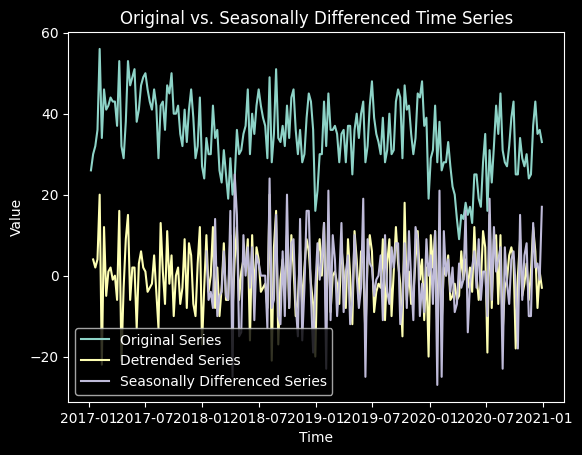

In [199]:
# Plot the original and differenced series to visualise the non-stationarity.
import matplotlib.pyplot as plt
plt.plot(weekly_accidents['accident_count'], label='Original Series')
plt.plot(time_series, label='Detrended Series')
plt.plot(differenced_series, label='Seasonally Differenced Series')
plt.title('Original vs. Seasonally Differenced Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


In [200]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(differenced_series)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -9.158792
p-value: 0.000000


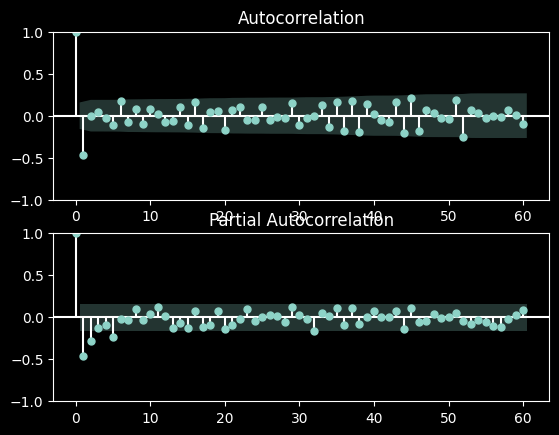

In [201]:
# Plot ACF and PACF of the DIFFERENCED data

fig, ax = plt.subplots(2, 1)
plot_acf(differenced_series, lags=60, ax=ax[0])  # Adjust lags as needed (often 2*m), here we are using 4*m
plot_pacf(differenced_series, lags=60, ax=ax[1])  # Adjust lags as needed
plt.show()

In [203]:
#Using residual standard deviation to check overdifferencing
#The optimal order of differencing is often the order of differencing at which the standard deviation is lowest.

#d=0, D=0
#arima model with no differencing
arima_model_test = SARIMAX(endog=train, order=(0, 0,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:                        SARIMAX   Log Likelihood                -788.101
Date:                Fri, 11 Apr 2025   AIC                           1578.202
Time:                        18:47:34   BIC                           1581.252
Sample:                    01-08-2017   HQIC                          1579.441
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1430.7885    576.506      2.482      0.013     300.858    2560.719
Ljung-Box (L1) (Q):                  18.38   Jarque-Bera (JB):                 1.18
Prob(Q):                              0.00   Pr

In [204]:
#d=1, D=0.
#arima model with no differencing
arima_model_test1 = SARIMAX(endog=train, order=(0, 1,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test1.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -555.626
Date:                Fri, 11 Apr 2025   AIC                           1113.253
Time:                        18:47:41   BIC                           1116.296
Sample:                    01-08-2017   HQIC                          1114.489
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2        76.0581      9.131      8.330      0.000      58.163      93.954
Ljung-Box (L1) (Q):                  23.70   Jarque-Bera (JB):                 1.32
Prob(Q):                              0.00   Pr

In [206]:
#d=2 and D=0
#arima model with no differencing
arima_model_test2 = SARIMAX(endog=train, order=(0, 2,0)).fit() #using original data for train, because differencing (d=2) taken care of during the model fitting.
print(arima_model_test2.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  156
Model:               SARIMAX(0, 2, 0)   Log Likelihood                -630.134
Date:                Fri, 11 Apr 2025   AIC                           1262.268
Time:                        18:47:59   BIC                           1265.305
Sample:                    01-08-2017   HQIC                          1263.502
                         - 12-29-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2       209.7199     23.738      8.835      0.000     163.195     256.245
Ljung-Box (L1) (Q):                  55.75   Jarque-Bera (JB):                 1.60
Prob(Q):                              0.00   Pr

In [207]:
# Fitting the ARIMA model based on the lowest AIC , order (p,d,q)
sarima_model0 = SARIMAX(endog=train, order=(0, 1,0), seasonal_order=(0, 0 , 1, 52)).fit() #using original data for train, because differencing (d=1, D=1) taken care of during the model fitting.
print(sarima_model0.summary())

                                      SARIMAX Results                                       
Dep. Variable:                       accident_count   No. Observations:                  156
Model:             SARIMAX(0, 1, 0)x(0, 0, [1], 52)   Log Likelihood                -551.440
Date:                              Fri, 11 Apr 2025   AIC                           1106.880
Time:                                      18:48:41   BIC                           1112.966
Sample:                                  01-08-2017   HQIC                          1109.352
                                       - 12-29-2019                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L52       0.2983      0.111      2.698      0.007       0.082       0.515
sigma2        69.84

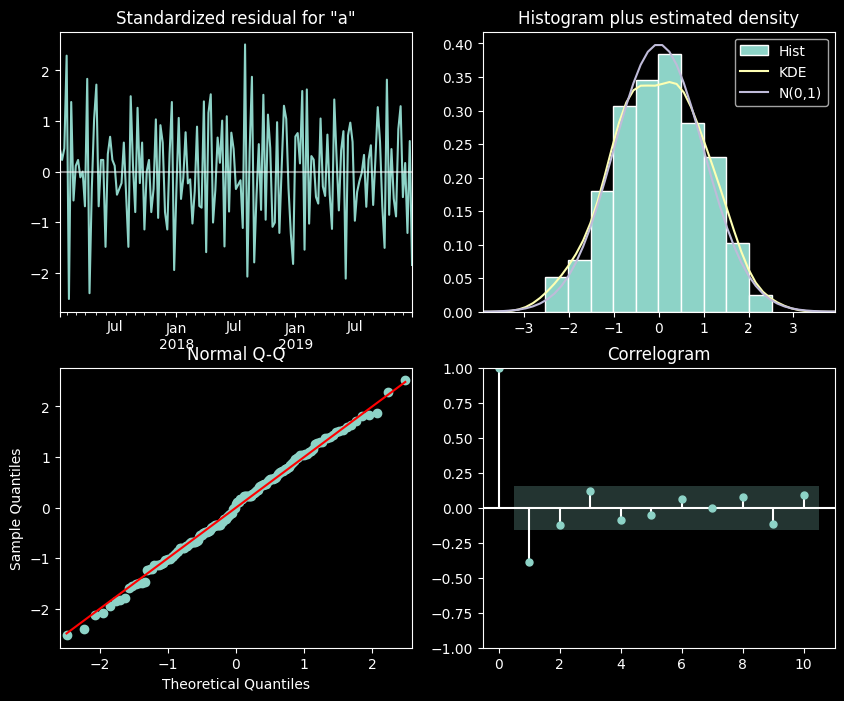

In [208]:
# Plots of the Q-Q plot
sarima_model0.plot_diagnostics(figsize=(10,8));

In [209]:
# Evaluation using Ljung-Box test

from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model0.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,20.346688,0.000006
2,22.299640,0.000014
3,24.550991,0.000019
4,24.775445,0.000056
5,26.414410,0.000074
6,27.469785,0.000118
7,27.482169,0.000273
8,28.189041,0.000440
9,29.801019,0.000474
10,31.027402,0.000581


In [210]:
d=1
D=0
# Function to plot the aic (repeating from above)
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=target, order=(order[0], d, order[1]),seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            print ('getting some error')
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df


In [211]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,3,1) # Order of AR
qs = np.arange(0,3,1) # Order of MA
ds = np.arange(1,3,1)
Ps = np.arange(0,3,1) # Seasonal order of AR
Qs = np.arange(0,3,1) # Seasonal order of MA
Ds = np.arange(1,3,1)
d=1 # 1 normal differencing 
D = 1 # 1 Seasonal differencing 
s= 12 # period
p_q_list = list(product(ps,ds, qs,Ps,Ds, Qs))
p_q_list[:5]

[(0, 1, 0, 0, 1, 0),
 (0, 1, 0, 0, 1, 1),
 (0, 1, 0, 0, 1, 2),
 (0, 1, 0, 0, 2, 0),
 (0, 1, 0, 0, 2, 1)]

In [212]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,3,1) # Order of AR
qs = np.arange(0,3,1) # Order of MA
Ps = np.arange(0,3,1) # Seasonal order of AR
Qs = np.arange(0,3,1) # Seasonal order of MA
d=1 # 1 normal differencing 
D = 1 # 1 Seasonal differencing 
s= 12 # period
p_q_list = list(product(ps,qs,Ps,Qs))


aic_df = aic_values(train)

aic_df

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [01:46<00:00,  1.31s/it]


,"Order(p,q,Ps,QS)",AIC
44,"(1, 1, 2, 2)",1008.117989
37,"(1, 1, 0, 1)",1010.036278
17,"(0, 1, 2, 2)",1010.045124
19,"(0, 2, 0, 1)",1010.206519
10,"(0, 1, 0, 1)",1011.571932
...,...,...
6,"(0, 0, 2, 0)",1080.681654
3,"(0, 0, 1, 0)",1087.125264
54,"(2, 0, 0, 0)",1092.570586
27,"(1, 0, 0, 0)",1110.219494


In [214]:
# Fitting the SARIMA model based on the lowest AIC
sarima_model = SARIMAX(endog=train, order=(1, 1,1), seasonal_order=(2, 0, 2, 52)).fit()
sarima_model

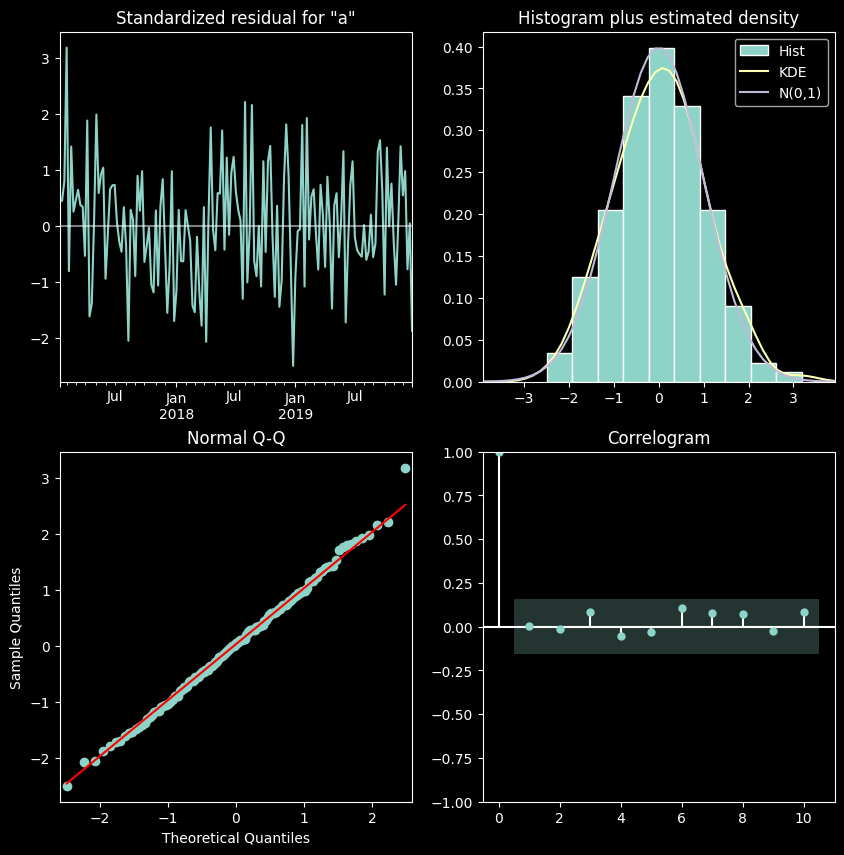

In [215]:
# Q-Q plot
sarima_model.plot_diagnostics(figsize = (10,10))
plt.show()

In [216]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model.resid)

,lb_stat,lb_pvalue
1,0.039064,0.843321
2,0.040589,0.979910
3,1.735248,0.629126
4,1.921422,0.750209
5,2.264742,0.811431
6,5.044511,0.538117
7,6.213039,0.515106
8,7.082585,0.527749
9,7.083099,0.628468
10,8.295932,0.599955


In [217]:
# Making predictions with the model
len_test = len(test) # this also referred to as the window of forecast
sarima_pred = sarima_model.get_forecast(len_test)
sarima_pred = sarima_pred.predicted_mean

print(sarima_pred)

2020-01-05    27.743231
2020-01-12    32.590944
2020-01-19    33.267012
2020-01-26    37.964002
2020-02-02    39.590881
2020-02-09    38.065958
2020-02-16    38.352045
2020-02-23    37.158591
2020-03-01    37.681389
2020-03-08    37.588655
2020-03-15    35.348772
2020-03-22    37.346762
2020-03-29    36.207337
2020-04-05    37.727714
2020-04-12    35.301168
2020-04-19    34.590845
2020-04-26    33.302998
2020-05-03    40.016844
2020-05-10    39.732604
2020-05-17    38.495144
2020-05-24    40.688340
2020-05-31    38.445620
2020-06-07    34.877463
2020-06-14    37.446994
2020-06-21    40.782354
2020-06-28    42.735896
2020-07-05    39.211088
2020-07-12    37.353161
2020-07-19    36.305010
2020-07-26    36.635617
2020-08-02    38.261111
2020-08-09    32.016974
2020-08-16    35.971022
2020-08-23    38.785506
2020-08-30    34.256675
2020-09-06    37.160652
2020-09-13    40.114239
2020-09-20    42.160014
2020-09-27    39.211269
2020-10-04    34.923191
2020-10-11    40.545121
2020-10-18    37

In [218]:
# Assiging the prediction to the test set dataframe 
test['sarima_pred'] = sarima_pred
test.head()

,accident_count,naive_pred,arima_pred,sarima_pred
date,,,,
2020-01-05,29,21,33.11004,27.743231
2020-01-12,31,30,36.29579,32.590944
2020-01-19,42,30,36.29579,33.267012
2020-01-26,28,43,36.29579,37.964002
2020-02-02,38,32,36.29579,39.590881


In [219]:
# Evaluation
from sklearn.metrics import mean_squared_error
# Evaluation of the model against the test set
sarima_mse = mean_squared_error(test['accident_count'],test['sarima_pred'], squared=False)
sarima_mse

13.006353296280599

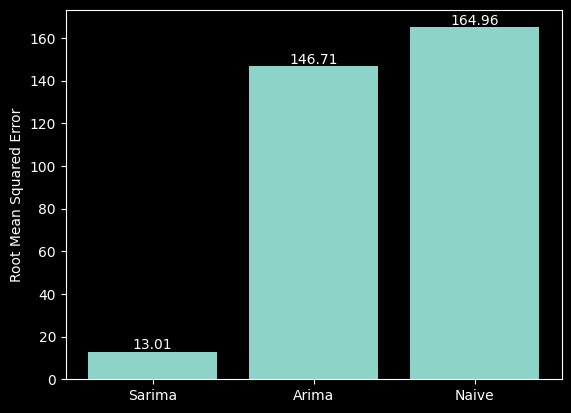

In [220]:
# Plot of the results of all the models

list_mse = [sarima_mse,arima_mse,naive_mse]
models = ['Sarima','Arima', 'Naive']
plt.bar(x=models,height=list_mse)
plt.ylabel('Root Mean Squared Error')

for i, value in enumerate(list_mse):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.show()

## 3)AutoArima

In [21]:
#police_force code = 
# 16	Humberside Police
# 21	North Yorkshire Police
# 22	West Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force IN (16, 21, 22)
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all results
results = cur.fetchall()


# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)

,date,police_force
0,2017-01-06,16
1,2017-01-02,16
2,2017-01-01,16
3,2017-01-02,16
4,2017-01-01,16


In [22]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,8
2017-01-08,111
2017-01-15,132
2017-01-22,122
2017-01-29,142
...,...
2019-12-08,147
2019-12-15,98
2019-12-22,103


In [23]:
# drop the last row because its blongs to 2021
# and first row, because its too low

weekly_accidents = weekly_accidents.drop(weekly_accidents.index[-1])
weekly_accidents = weekly_accidents.iloc[1:]
weekly_accidents

,accident_count
date,
2017-01-08,111
2017-01-15,132
2017-01-22,122
2017-01-29,142
2017-02-05,142
...,...
2019-12-01,131
2019-12-08,147
2019-12-15,98


<Figure size 300x300 with 0 Axes>

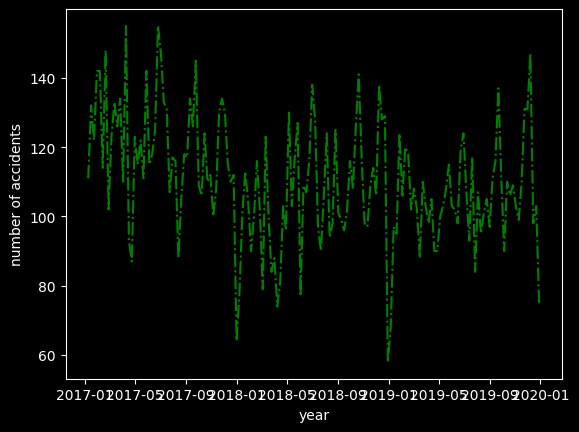

<Figure size 300x300 with 0 Axes>

In [24]:
plt.plot(weekly_accidents[['accident_count']],'g-.')
plt.xlabel('year')
plt.ylabel('number of accidents')
plt.figure(figsize= (3, 3))

In [26]:
#Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller
adf, pvalue, usedlag_, nobs_, critical_values_, icbest_ = adfuller(weekly_accidents)
print("pvalue = ", pvalue, " if above 0.05, data is not stationary")
#Since data is not stationary, we may need SARIMA and not just ARIMA

pvalue =  0.04321516724956073  if above 0.05, data is not stationary


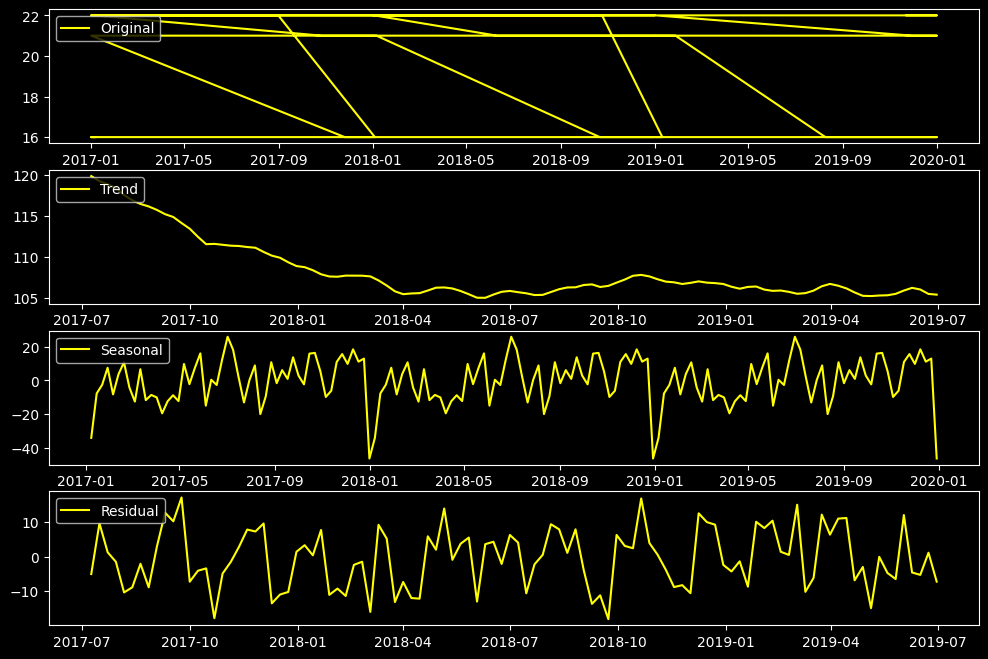

In [29]:
#Extract and plot trend, seasonal and residuals. 
from statsmodels.tsa.seasonal import seasonal_decompose 
decomposed = seasonal_decompose(weekly_accidents['accident_count'],  
                            model ='additive')

trend = decomposed.trend
seasonal = decomposed.seasonal
residual = decomposed.resid

plt.figure(figsize=(12,8))
plt.subplot(411)
plt.plot(df, label='Original', color='yellow')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='yellow')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='yellow')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residual', color='yellow')
plt.legend(loc='upper left')
plt.show()

In [30]:
from pmdarima.arima import auto_arima
#Autoarima gives us bet model suited for the data
# p - number of autoregressive terms (AR)
# q - Number of moving avergae terms (MA)
# d - number of non-seasonal differences
#p, d, q represent non-seasonal components
#P, D, Q represent seasonal components
arima_mode3 = auto_arima(weekly_accidents['accident_count'], start_p = 1, d=0, start_q = 1, 
                          max_p = 5, max_q = 5, max_d=0, m = 52, 
                          start_P = 0, D=1, start_Q=0, max_P=5, max_D=5, max_Q=5, # Use m=52 for weekly data with annual seasonality
                          seasonal = True, 
                          trace = True, 
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True, n_fits=50)   

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,0)[52] intercept   : AIC=924.343, Time=0.82 sec
 ARIMA(0,0,0)(0,1,0)[52] intercept   : AIC=931.990, Time=0.17 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : AIC=inf, Time=7.04 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : AIC=inf, Time=15.55 sec
 ARIMA(0,0,0)(0,1,0)[52]             : AIC=941.893, Time=0.11 sec
 ARIMA(1,0,1)(1,1,0)[52] intercept   : AIC=893.522, Time=17.03 sec
 ARIMA(1,0,1)(2,1,0)[52] intercept   : AIC=892.884, Time=85.35 sec
 ARIMA(1,0,1)(3,1,0)[52] intercept   : AIC=894.775, Time=165.88 sec
 ARIMA(1,0,1)(2,1,1)[52] intercept   : AIC=inf, Time=107.91 sec
 ARIMA(1,0,1)(1,1,1)[52] intercept   : AIC=inf, Time=30.30 sec
 ARIMA(1,0,1)(3,1,1)[52] intercept   : AIC=inf, Time=160.31 sec
 ARIMA(0,0,1)(2,1,0)[52] intercept   : AIC=900.428, Time=80.09 sec
 ARIMA(1,0,0)(2,1,0)[52] intercept   : AIC=inf, Time=61.20 sec
 ARIMA(2,0,1)(2,1,0)[52] intercept   : AIC=894.694, Time=57.66 sec
 ARIMA(1,0,2)(2,1,0)[52] intercept   : AIC=8

In [32]:
print (arima_mode3.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  156
Model:             SARIMAX(1, 0, 1)x(2, 1, [], 52)   Log Likelihood                -440.442
Date:                             Sun, 13 Apr 2025   AIC                            892.884
Time:                                     12:11:15   BIC                            908.750
Sample:                                 01-08-2017   HQIC                           899.312
                                      - 12-29-2019                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.1603     11.619     -0.014      0.989     -22.934      22.613
ar.L1          0.9940      

The best-fitting model suggested by the system is SARIMAX (1, 0, 1)x(2, 1, 0, 52)

In [33]:
# Splitting the dataset into train and test sets
train = weekly_accidents[['accident_count']][:len(weekly_accidents) - 52]  # All weeks before the last 7 weeks
test = weekly_accidents[['accident_count']][-52:]  # Last 7 weeks for prediction

In [34]:
from statsmodels.tsa.statespace.sarimax import SARIMAX 

SARIMAX model is designed to capture both the seasonal and non-seasonal patterns in the weekly accident data, providing a robust forecast for the upcoming year.

In [35]:
model = SARIMAX(train['accident_count'], order= (1, 0, 1) , seasonal_order= (2, 1, 0, 52))

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


In [36]:
result = model.fit()

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Program Files\Python312\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [37]:
#Train prediction
start_index = 0
end_index = len(train)-1
train_prediction = result.predict(start_index, end_index) 

#Prediction
start_index = len(train)
end_index = len(weekly_accidents)-1
prediction = result.predict(start_index, end_index).rename('Predicted accidents') 
#Rename the column

<Axes: xlabel='date'>

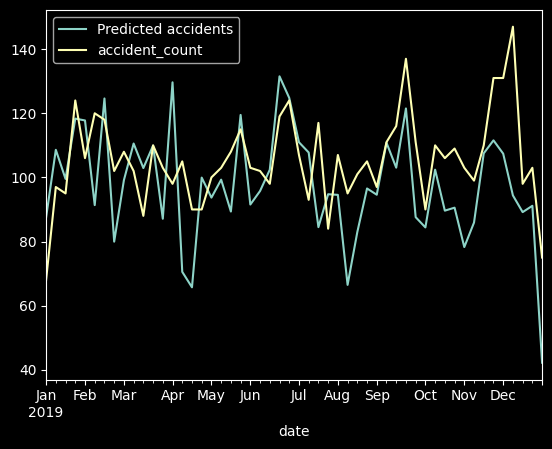

In [38]:
prediction.plot(legend = True) 
test['accident_count'].plot(legend = True)

In [39]:
import math
from sklearn.metrics import mean_squared_error
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(train, train_prediction))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(test, prediction))
print('Test Score: %.2f RMSE' % (testScore))

#from sklearn.metrics import r2_score
#score = r2_score(X_test, prediction)
#print("R2 score is: ", score)

Train Score: 86.76 RMSE
Test Score: 17.84 RMSE


C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


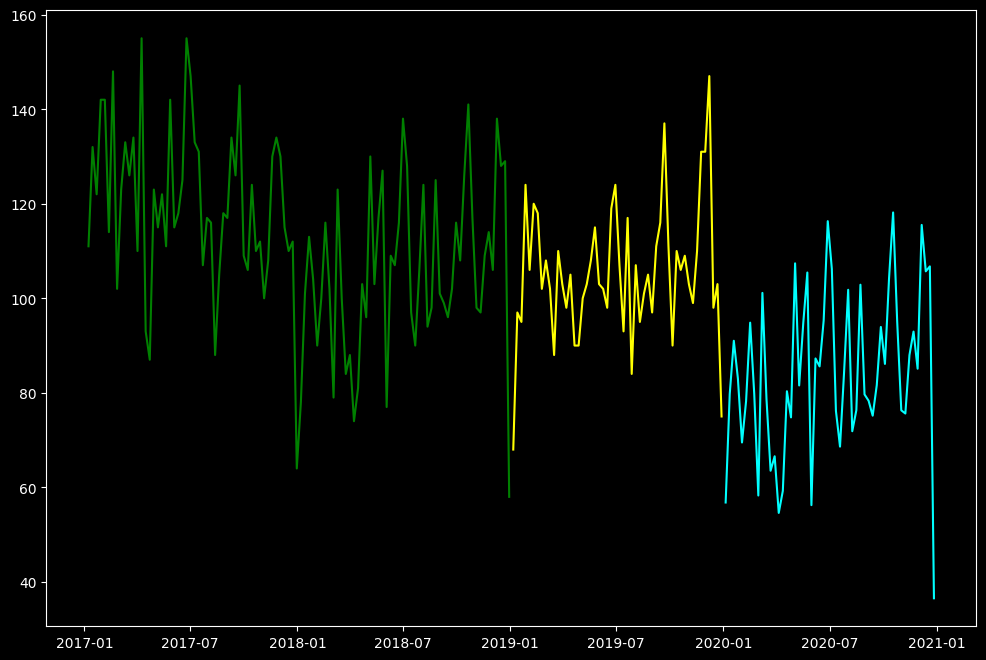

In [40]:
forecast = result.predict(start = len(weekly_accidents),  
                          end = (len(weekly_accidents)-1) + 1 * 52,  
                          typ = 'levels').rename('Forecast') 
  
plt.figure(figsize=(12,8))
plt.plot(train, label='Training', color='green')
plt.plot(test, label='Test', color='yellow')
plt.plot(forecast, label='Forecast2', color='cyan')
plt.show()

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


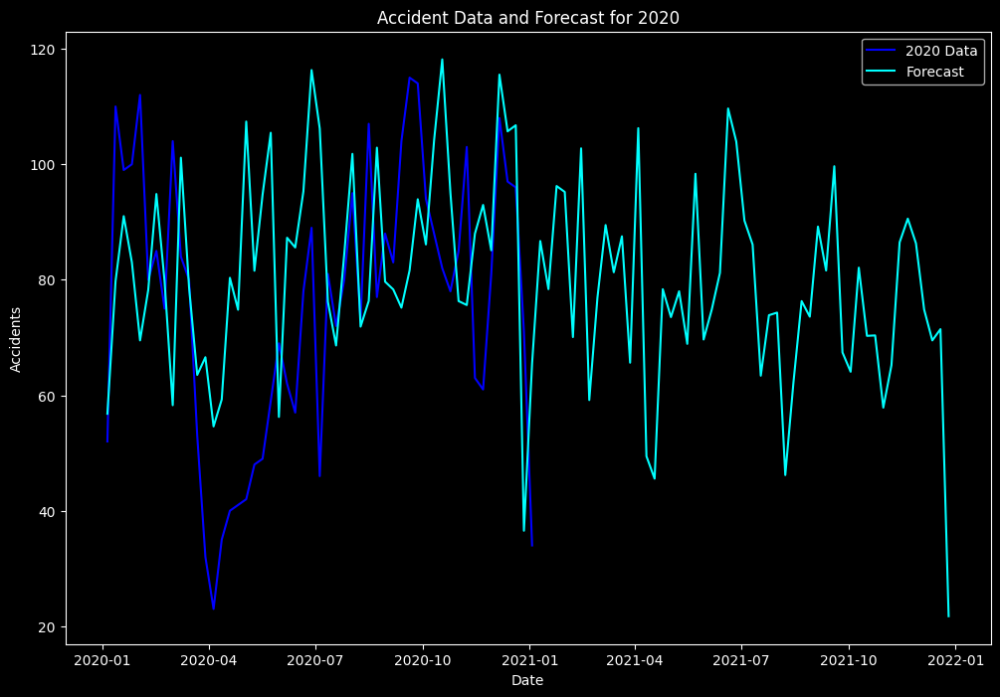

In [52]:
# Extract data for 2020 from the database
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force IN (16, 21, 22)
AND accident_year = 2020;
''')

# Fetch the results for 2020
results_2020 = cur.fetchall()

# Convert results into a DataFrame
df_2020 = pd.DataFrame(results_2020, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df_2020['date'] = pd.to_datetime(df_2020['date'], dayfirst=True)

# Resample the 2020 data weekly (if needed) and aggregate it (e.g., sum the accidents per week)
df_2020.set_index('date', inplace=True)
df_2020_weekly = df_2020.resample('W').size()  # Weekly accident counts

# Assuming you have the forecast data and want to plot it alongside the 2020 data
forecast = result.predict(start=len(weekly_accidents),  
                          end=(len(weekly_accidents)-1) + 2 * 52,  
                          typ='levels').rename('Forecast')

# Plotting the original 2020 data and forecast
plt.figure(figsize=(12,8))
plt.plot(df_2020_weekly, label='2020 Data', color='blue')  # Plot 2020 data
plt.plot(forecast, label='Forecast', color='cyan')  # Plot the forecasted data
plt.legend()
plt.title('Accident Data and Forecast for 2020')
plt.xlabel('Date')
plt.ylabel('Accidents')
plt.show()


In [58]:
# Combine 2020 weekly data and forecast into a single DataFrame
combined_df = pd.DataFrame({
   'Date': df_2020_weekly.index,
   '2020 Data': df_2020_weekly.values
})
# Reset index to have 'Date' as a column
combined_df.reset_index(drop=True, inplace=True)
# Create forecast DataFrame
forecast_df = pd.DataFrame({
   'Date': forecast.index,
   'Forecast': forecast.values
})
# Reset index of forecast
forecast_df.reset_index(drop=True, inplace=True)
# Merge the two dataframes
final_df = pd.merge(combined_df, forecast_df, on='Date', how='outer').sort_values('Date')
# Display the final table
final_df.head(52)

,Date,2020 Data,Forecast
0,2020-01-05,52.0,56.802620
1,2020-01-12,110.0,79.747792
2,2020-01-19,99.0,91.013569
3,2020-01-26,100.0,83.011761
4,2020-02-02,112.0,69.500406
5,2020-02-09,80.0,78.222648
6,2020-02-16,85.0,94.847160
7,2020-02-23,75.0,79.773195
8,2020-03-01,104.0,58.280880
9,2020-03-08,84.0,101.138974


## 4)Work on each police force separately with AutoArima

In [71]:
#police_force code = 
# 16	Humberside Police


# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 16
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all results
results = cur.fetchall()

start_date = '2020-01-01'

# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)

,date,police_force
0,2017-01-06,16
1,2017-01-02,16
2,2017-01-01,16
3,2017-01-02,16
4,2017-01-01,16


In [72]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,2
2017-01-08,47
2017-01-15,46
2017-01-22,44
2017-01-29,56
...,...
2019-12-08,59
2019-12-15,46
2019-12-22,41


In [73]:
# drop the last row because its blongs to 2020

weekly_accidents = weekly_accidents.drop(weekly_accidents.index[-1])
weekly_accidents

,accident_count
date,
2017-01-01,2
2017-01-08,47
2017-01-15,46
2017-01-22,44
2017-01-29,56
...,...
2019-12-01,55
2019-12-08,59
2019-12-15,46


In [75]:
#Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller
adf, pvalue, usedlag_, nobs_, critical_values_, icbest_ = adfuller(weekly_accidents)
print("pvalue = ", pvalue, " if above 0.05, data is not stationary")
#Since data is not stationary, we may need SARIMA and not just ARIMA

pvalue =  2.035829637553865e-10  if above 0.05, data is not stationary


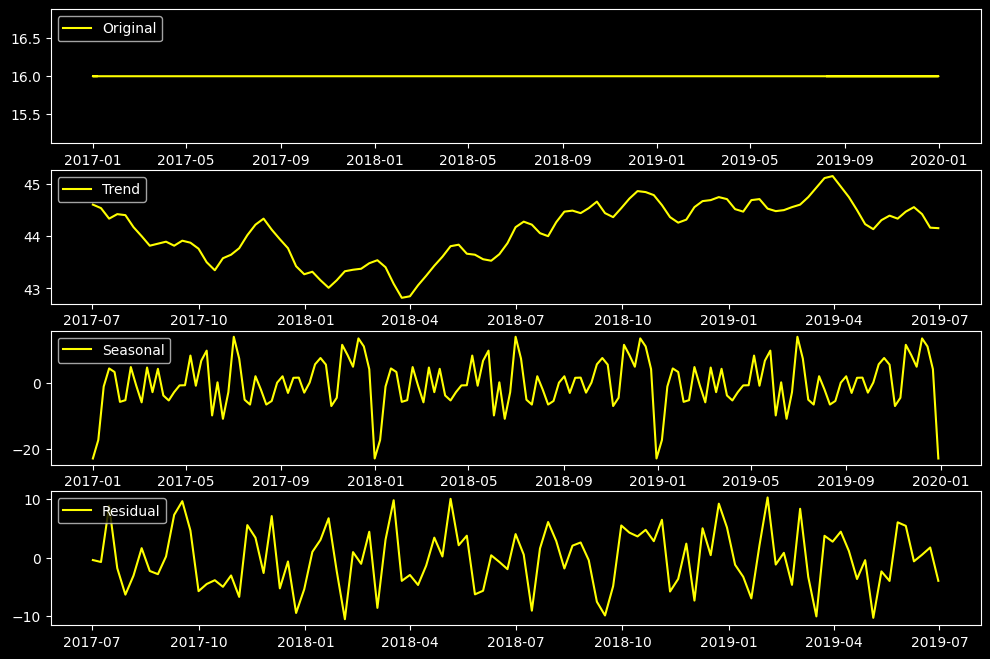

In [76]:
#Extract and plot trend, seasonal and residuals. 
from statsmodels.tsa.seasonal import seasonal_decompose 
decomposed = seasonal_decompose(weekly_accidents['accident_count'],  
                            model ='additive')

trend = decomposed.trend
seasonal = decomposed.seasonal
residual = decomposed.resid

plt.figure(figsize=(12,8))
plt.subplot(411)
plt.plot(df, label='Original', color='yellow')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='yellow')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='yellow')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residual', color='yellow')
plt.legend(loc='upper left')
plt.show()

In [77]:
from pmdarima.arima import auto_arima
#Autoarima gives us bet model suited for the data
# p - number of autoregressive terms (AR)
# q - Number of moving avergae terms (MA)
# d - number of non-seasonal differences
#p, d, q represent non-seasonal components
#P, D, Q represent seasonal components
arima_model = auto_arima(weekly_accidents['accident_count'], start_p = 1, d = 0 , start_q = 1, 
                          max_p = 5, max_q = 5, max_d=5, m = 52, 
                          start_P = 0, D = 0, start_Q=0, max_P=5, max_D=5, max_Q=5,
                          seasonal = True, 
                          trace = True, 
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True, n_fits=50)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[52] intercept   : AIC=1136.593, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[52] intercept   : AIC=1142.742, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[52] intercept   : AIC=1134.842, Time=2.01 sec
 ARIMA(0,0,1)(0,0,1)[52] intercept   : AIC=1135.798, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[52]             : AIC=1643.525, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[52] intercept   : AIC=1140.738, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[52] intercept   : AIC=1134.036, Time=35.09 sec
 ARIMA(1,0,0)(3,0,0)[52] intercept   : AIC=inf, Time=64.21 sec
 ARIMA(1,0,0)(2,0,1)[52] intercept   : AIC=inf, Time=36.80 sec
 ARIMA(1,0,0)(1,0,1)[52] intercept   : AIC=1134.326, Time=2.89 sec
 ARIMA(1,0,0)(3,0,1)[52] intercept   : AIC=inf, Time=100.93 sec
 ARIMA(0,0,0)(2,0,0)[52] intercept   : AIC=inf, Time=24.96 sec
 ARIMA(2,0,0)(2,0,0)[52] intercept   : AIC=1138.129, Time=45.08 sec
 ARIMA(1,0,1)(2,0,0)[52] intercept   : AIC=1128.766, Time=41.57 sec
 ARIMA(1,0,1)(1,0,0)[52] interc

In [78]:
# To print the summary
print(arima_model.summary() )

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  157
Model:             SARIMAX(1, 0, 1)x(3, 0, [], 52)   Log Likelihood                -556.952
Date:                             Sun, 13 Apr 2025   AIC                           1127.904
Time:                                     13:27:34   BIC                           1149.298
Sample:                                 01-01-2017   HQIC                          1136.593
                                      - 12-29-2019                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     43.6394     32.962      1.324      0.186     -20.965     108.244
ar.L1         -0.6424      

In [79]:
# Splitting the dataset into train and test sets
train = weekly_accidents[['accident_count']][:len(weekly_accidents) - 52]  # All weeks before the last 7 weeks
test = weekly_accidents[['accident_count']][-52:]  # Last 7 weeks for prediction

In [89]:
from statsmodels.tsa.statespace.sarimax import SARIMAX 
  
model = SARIMAX(train['accident_count'],  
                order = (2, 0, 1),  
                seasonal_order =(3, 0, 1, 52)) 
  
result = model.fit() 

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: U

In [90]:
#Train prediction
start_index = 0
end_index = len(train)-1
train_prediction = result.predict(start_index, end_index) 

#Prediction
start_index = len(train)
end_index = len(weekly_accidents)-1
prediction = result.predict(start_index, end_index).rename('Predicted accident')

<Axes: xlabel='date'>

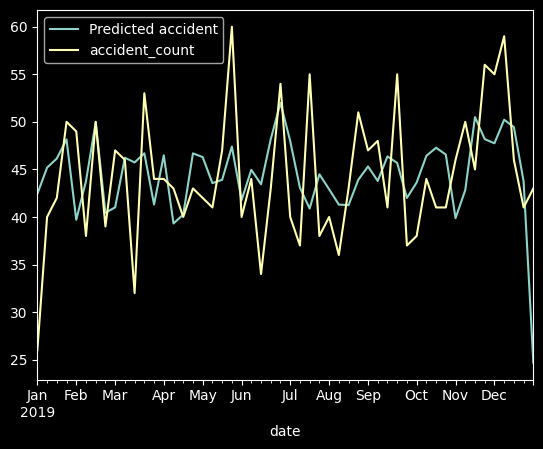

In [91]:
# plot predictions and actual values 
prediction.plot(legend = True) 
test['accident_count'].plot(legend = True) 

In [92]:
import math
from sklearn.metrics import mean_squared_error
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(train, train_prediction))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(test, prediction))
print('Test Score: %.2f RMSE' % (testScore))

#from sklearn.metrics import r2_score
#score = r2_score(X_test, prediction)
#print("R2 score is: ", score)

Train Score: 10.27 RMSE
Test Score: 6.83 RMSE


C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


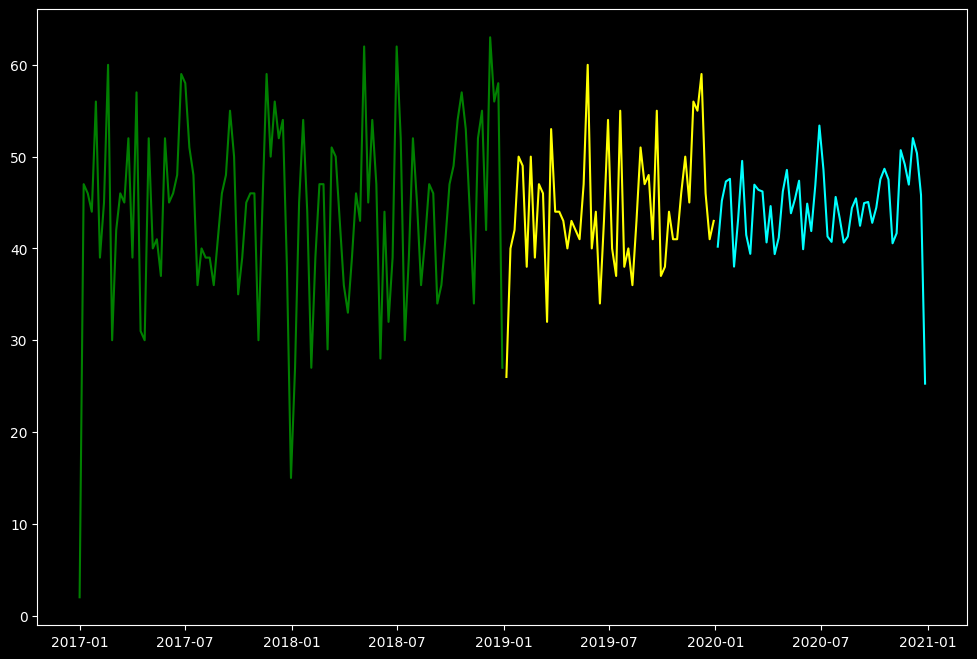

In [93]:
# Forecast for the 2020 
forecast = result.predict(start = len(weekly_accidents),  
                          end = (len(weekly_accidents)-1) + 1 * 52,  
                          typ = 'levels').rename('Forecast') 

plt.figure(figsize=(12,8))
plt.plot(train, label='Training', color='green')
plt.plot(test, label='Test', color='yellow')
plt.plot(forecast, label='Forecast', color='cyan')
plt.show()

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


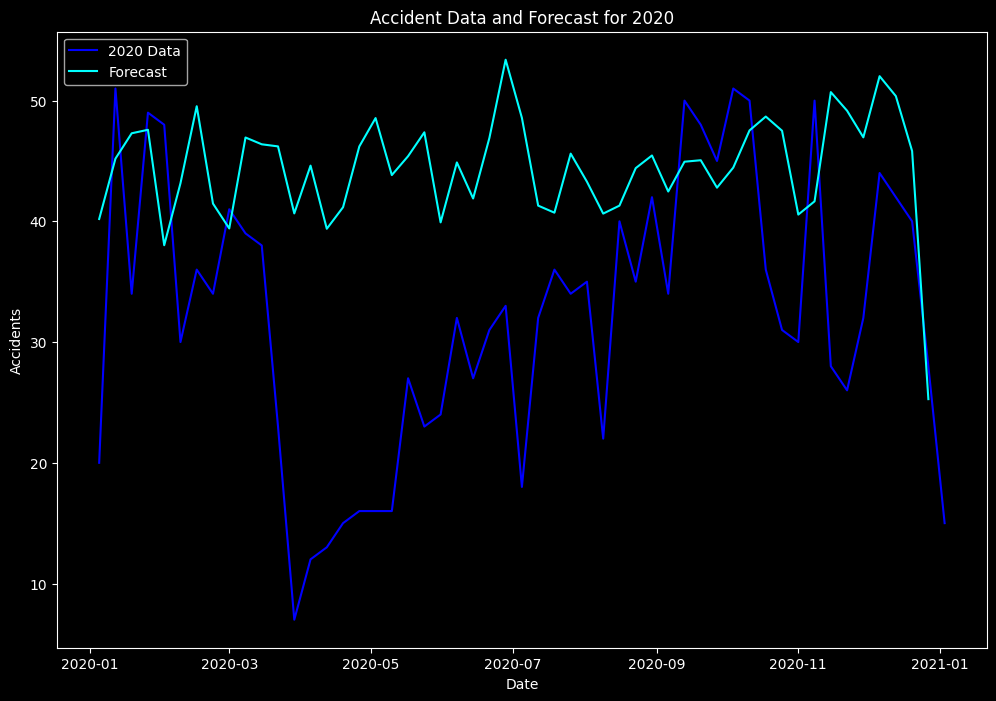

In [94]:
# Extract data for 2020 from the database
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 16
AND accident_year = 2020;
''')

# Fetch the results for 2020
results_2020 = cur.fetchall()

# Convert results into a DataFrame
df_2020 = pd.DataFrame(results_2020, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df_2020['date'] = pd.to_datetime(df_2020['date'], dayfirst=True)

# Resample the 2020 data weekly (if needed) and aggregate it (e.g., sum the accidents per week)
df_2020.set_index('date', inplace=True)
df_2020_weekly = df_2020.resample('W').size()  # Weekly accident counts

# Assuming you have the forecast data and want to plot it alongside the 2020 data
forecast = result.predict(start=len(weekly_accidents),  
                          end=(len(weekly_accidents)-1) + 1 * 52,  
                          typ='levels').rename('Forecast')

# Plotting the original 2020 data and forecast
plt.figure(figsize=(12,8))
plt.plot(df_2020_weekly, label='2020 Data', color='blue')  # Plot 2020 data
plt.plot(forecast, label='Forecast', color='cyan')  # Plot the forecasted data
plt.legend()
plt.title('Accident Data and Forecast for 2020')
plt.xlabel('Date')
plt.ylabel('Accidents')
plt.show()


In [95]:
# Combine 2020 weekly data and forecast into a single DataFrame
combined_df = pd.DataFrame({
   'Date': df_2020_weekly.index,
   '2020 Data': df_2020_weekly.values
})
# Reset index to have 'Date' as a column
combined_df.reset_index(drop=True, inplace=True)
# Create forecast DataFrame
forecast_df = pd.DataFrame({
   'Date': forecast.index,
   'Forecast': forecast.values
})
# Reset index of forecast
forecast_df.reset_index(drop=True, inplace=True)
# Merge the two dataframes
final_df = pd.merge(combined_df, forecast_df, on='Date', how='outer').sort_values('Date')
# Display the final table
final_df.head(52)

,Date,2020 Data,Forecast
0,2020-01-05,20,40.192771
1,2020-01-12,51,45.190881
2,2020-01-19,34,47.291861
3,2020-01-26,49,47.581198
4,2020-02-02,48,38.019107
5,2020-02-09,30,43.154233
6,2020-02-16,36,49.534788
7,2020-02-23,34,41.468319
8,2020-03-01,41,39.409522
9,2020-03-08,39,46.942640


In [97]:
# 21	North Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 21
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all results
results = cur.fetchall()

# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)


,date,police_force
0,2017-01-01,21
1,2017-01-02,21
2,2017-01-02,21
3,2017-01-02,21
4,2017-01-02,21


In [98]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,3
2017-01-08,38
2017-01-15,56
2017-01-22,46
2017-01-29,50
...,...
2019-12-08,40
2019-12-15,15
2019-12-22,23


In [99]:
# drop the last row because its blongs to 2020

weekly_accidents_21 = weekly_accidents.drop(weekly_accidents.index[-1])
weekly_accidents_21

,accident_count
date,
2017-01-01,3
2017-01-08,38
2017-01-15,56
2017-01-22,46
2017-01-29,50
...,...
2019-12-01,32
2019-12-08,40
2019-12-15,15


In [100]:
#Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller
adf, pvalue, usedlag_, nobs_, critical_values_, icbest_ = adfuller(weekly_accidents_21)
print("pvalue = ", pvalue, " if above 0.05, data is not stationary")
#Since data is not stationary, we may need SARIMA and not just ARIMA

pvalue =  1.1962721280525177e-06  if above 0.05, data is not stationary


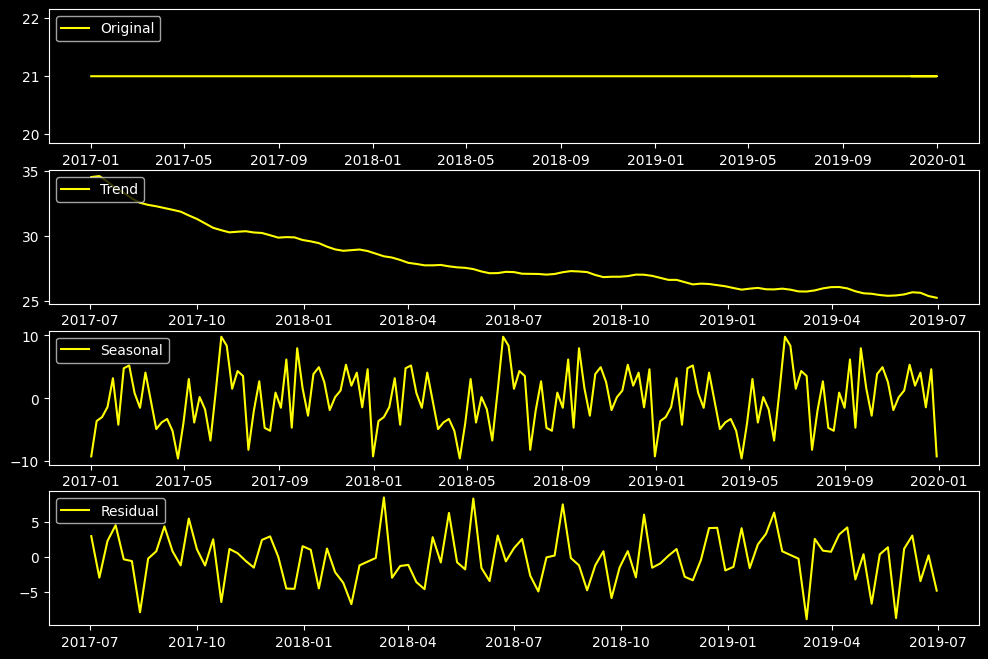

In [101]:
#Extract and plot trend, seasonal and residuals. 
from statsmodels.tsa.seasonal import seasonal_decompose 
decomposed = seasonal_decompose(weekly_accidents_21['accident_count'],  
                            model ='additive')

trend = decomposed.trend
seasonal = decomposed.seasonal
residual = decomposed.resid

plt.figure(figsize=(12,8))
plt.subplot(411)
plt.plot(df, label='Original', color='yellow')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='yellow')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='yellow')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residual', color='yellow')
plt.legend(loc='upper left')
plt.show()

In [102]:
from pmdarima.arima import auto_arima
#Autoarima gives us bet model suited for the data
# p - number of autoregressive terms (AR)
# q - Number of moving avergae terms (MA)
# d - number of non-seasonal differences
#p, d, q represent non-seasonal components
#P, D, Q represent seasonal components
arima_model = auto_arima(weekly_accidents_21['accident_count'], start_p = 1, d = 0, start_q = 1, 
                          max_p = 5, max_q = 5, max_d=5, m = 52, 
                          start_P = 0, D = 1, start_Q=0, max_P=5, max_D=5, max_Q=5,
                          seasonal = True, 
                          trace = True, 
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True, n_fits=50)     

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,0)[52] intercept   : AIC=761.498, Time=0.81 sec
 ARIMA(0,0,0)(0,1,0)[52] intercept   : AIC=761.466, Time=0.16 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : AIC=748.242, Time=7.13 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : AIC=inf, Time=7.10 sec
 ARIMA(0,0,0)(0,1,0)[52]             : AIC=783.330, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[52] intercept   : AIC=759.763, Time=0.48 sec
 ARIMA(1,0,0)(2,1,0)[52] intercept   : AIC=750.211, Time=19.26 sec
 ARIMA(1,0,0)(1,1,1)[52] intercept   : AIC=750.211, Time=12.51 sec
 ARIMA(1,0,0)(0,1,1)[52] intercept   : AIC=inf, Time=7.68 sec
 ARIMA(1,0,0)(2,1,1)[52] intercept   : AIC=752.211, Time=17.27 sec
 ARIMA(0,0,0)(1,1,0)[52] intercept   : AIC=748.815, Time=4.69 sec
 ARIMA(2,0,0)(1,1,0)[52] intercept   : AIC=750.236, Time=9.07 sec
 ARIMA(1,0,1)(1,1,0)[52] intercept   : AIC=750.230, Time=12.21 sec
 ARIMA(0,0,1)(1,1,0)[52] intercept   : AIC=748.294, Time=6.22 sec
 ARIMA(2,0,1)(1,1,0)[52] intercept   

In [103]:
# To print the summary 
print(arima_model.summary() )

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  157
Model:             SARIMAX(1, 0, 0)x(1, 1, 0, 52)   Log Likelihood                -370.121
Date:                            Sun, 13 Apr 2025   AIC                            748.242
Time:                                    13:36:57   BIC                            758.858
Sample:                                01-01-2017   HQIC                           752.543
                                     - 12-29-2019                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.5434      1.243     -4.459      0.000      -7.980      -3.107
ar.L1          0.1620      0.103   

In [104]:
# Splitting the dataset into train and test sets
train = weekly_accidents_21[['accident_count']][:len(weekly_accidents_21) - 52]  # All weeks before the last 7 weeks
test = weekly_accidents_21[['accident_count']][-52:]  # Last 7 weeks for prediction

In [121]:
from statsmodels.tsa.statespace.sarimax import SARIMAX 
  
model = SARIMAX(train['accident_count'],  
                order = (1, 0, 0),  
                seasonal_order =(1, 1, 0, 52)) 
  
result = model.fit() 

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


<Axes: xlabel='date'>

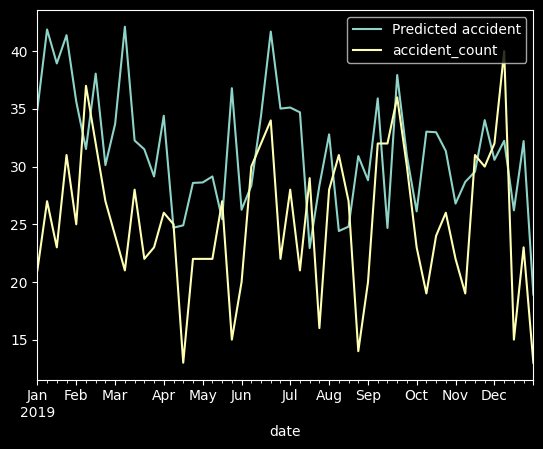

In [122]:
#Train prediction
start_index = 0
end_index = len(train)-1
train_prediction = result.predict(start_index, end_index) 

#Prediction
start_index = len(train)
end_index = len(weekly_accidents_21)-1
prediction = result.predict(start_index, end_index).rename('Predicted accident') 
#Rename the column

# plot predictions and actual values 
prediction.plot(legend = True) 
test['accident_count'].plot(legend = True) 

In [123]:
import math
from sklearn.metrics import mean_squared_error
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(train, train_prediction))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(test, prediction))
print('Test Score: %.2f RMSE' % (testScore))

#from sklearn.metrics import r2_score
#score = r2_score(test, prediction)
#print("R2 score is: ", score)

Train Score: 25.93 RMSE
Test Score: 9.25 RMSE


C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


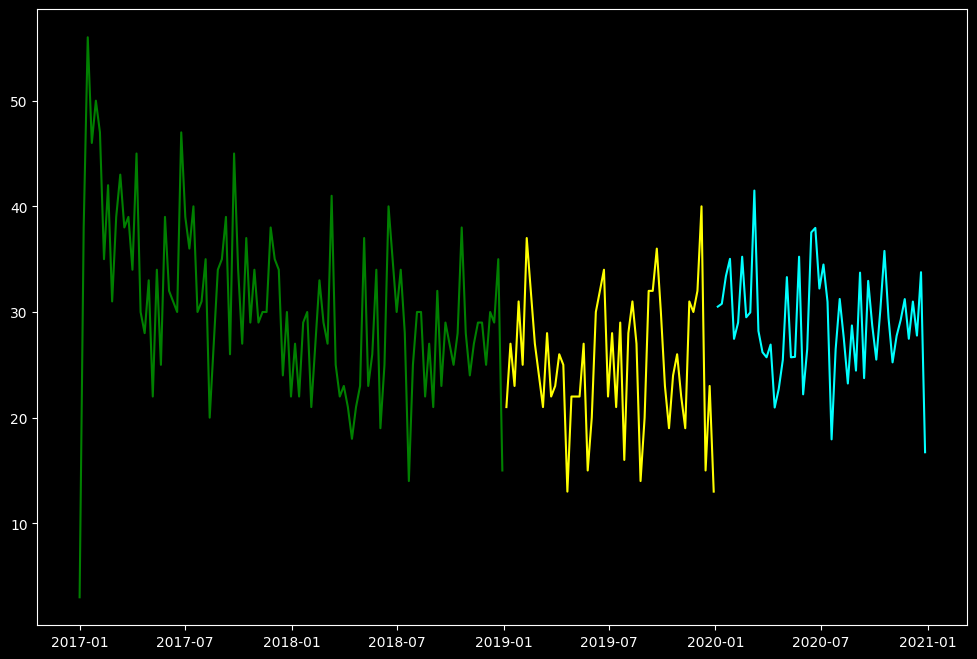

In [124]:
# Forecast for the next year 
forecast = result.predict(start = len(weekly_accidents_21),  
                          end = (len(weekly_accidents_21)-1) + 1 * 52,  
                          typ = 'levels').rename('Forecast') 

plt.figure(figsize=(12,8))
plt.plot(train, label='Training', color='green')
plt.plot(test, label='Test', color='yellow')
plt.plot(forecast, label='Forecast', color='cyan')
plt.show()

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


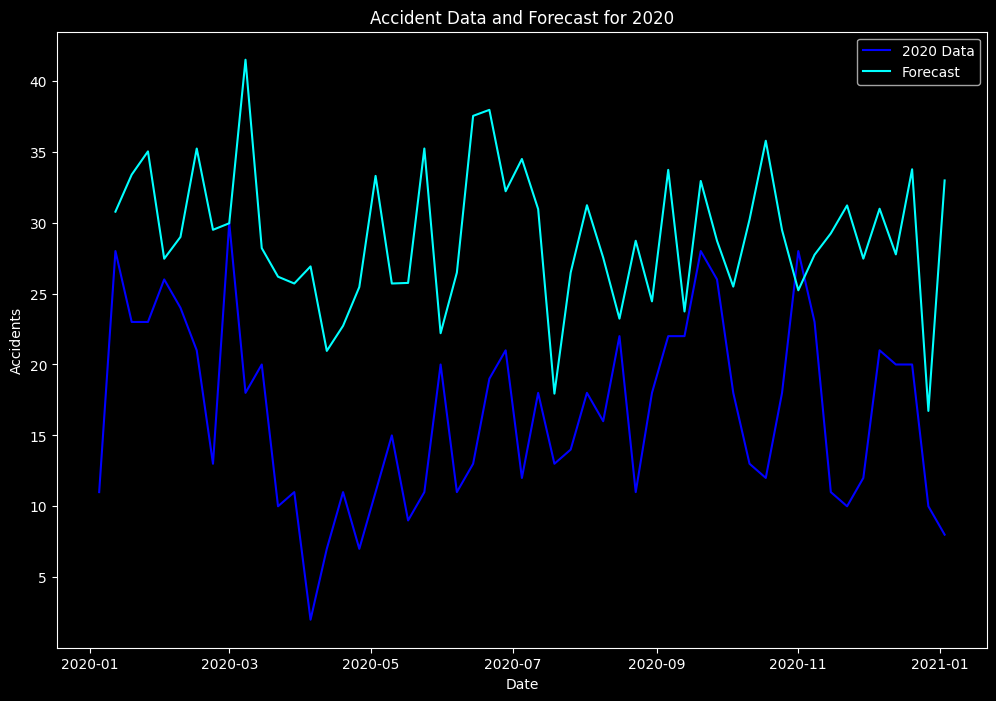

In [125]:
# Extract data for 2020 from the database
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 21
AND accident_year = 2020;
''')

# Fetch the results for 2020
results_2020 = cur.fetchall()

# Convert results into a DataFrame
df_2020 = pd.DataFrame(results_2020, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df_2020['date'] = pd.to_datetime(df_2020['date'], dayfirst=True)

# Resample the 2020 data weekly (if needed) and aggregate it (e.g., sum the accidents per week)
df_2020.set_index('date', inplace=True)
df_2020_weekly = df_2020.resample('W').size()  # Weekly accident counts

# Assuming you have the forecast data and want to plot it alongside the 2020 data
forecast = result.predict(start=len(weekly_accidents),  
                          end=(len(weekly_accidents)-1) + 1 * 52,  
                          typ='levels').rename('Forecast')

# Plotting the original 2020 data and forecast
plt.figure(figsize=(12,8))
plt.plot(df_2020_weekly, label='2020 Data', color='blue')  # Plot 2020 data
plt.plot(forecast, label='Forecast', color='cyan')  # Plot the forecasted data
plt.legend()
plt.title('Accident Data and Forecast for 2020')
plt.xlabel('Date')
plt.ylabel('Accidents')
plt.show()

In [127]:
# Combine 2020 weekly data and forecast into a single DataFrame
combined_df = pd.DataFrame({
   'Date': df_2020_weekly.index,
   '2020 Data': df_2020_weekly.values
})
# Reset index to have 'Date' as a column
combined_df.reset_index(drop=True, inplace=True)
# Create forecast DataFrame
forecast_df = pd.DataFrame({
   'Date': forecast.index,
   'Forecast': forecast.values
})
# Reset index of forecast
forecast_df.reset_index(drop=True, inplace=True)
# Merge the two dataframes
final_df = pd.merge(combined_df, forecast_df, on='Date', how='outer').sort_values('Date')
# Display the final table
final_df.head(52)

,Date,2020 Data,Forecast
0,2020-01-05,11,NaN
1,2020-01-12,28,30.778940
2,2020-01-19,23,33.388603
3,2020-01-26,23,35.029596
4,2020-02-02,26,27.459941
5,2020-02-09,24,28.996939
6,2020-02-16,21,35.231341
7,2020-02-23,13,29.499182
8,2020-03-01,30,29.962011
9,2020-03-08,18,41.494660


In [128]:
# 22	West Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 22
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all results
results = cur.fetchall()

# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


# Display DataFrame
df.head(5)


,date,police_force
0,2017-01-04,22
1,2017-01-13,22
2,2017-01-19,22
3,2017-01-23,22
4,2017-01-12,22


In [129]:
# Set 'date' as index
df.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df.groupby(['police_force']).resample('W').size().unstack(level=0)

weekly_accidents = df.resample('W').size().reset_index(name = 'accident_count')

# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-01,3
2017-01-08,26
2017-01-15,30
2017-01-22,32
2017-01-29,36
...,...
2019-12-08,48
2019-12-15,37
2019-12-22,39


In [130]:
# drop the last row because its blongs to 2020

weekly_accidents_22 = weekly_accidents.drop(weekly_accidents.index[-1])
weekly_accidents_22

,accident_count
date,
2017-01-01,3
2017-01-08,26
2017-01-15,30
2017-01-22,32
2017-01-29,36
...,...
2019-12-01,44
2019-12-08,48
2019-12-15,37


In [131]:
#Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller
adf, pvalue, usedlag_, nobs_, critical_values_, icbest_ = adfuller(weekly_accidents_22)
print("pvalue = ", pvalue, " if above 0.05, data is not stationary")
#Since data is not stationary, we may need SARIMA and not just ARIMA

pvalue =  1.9321016316076488e-05  if above 0.05, data is not stationary


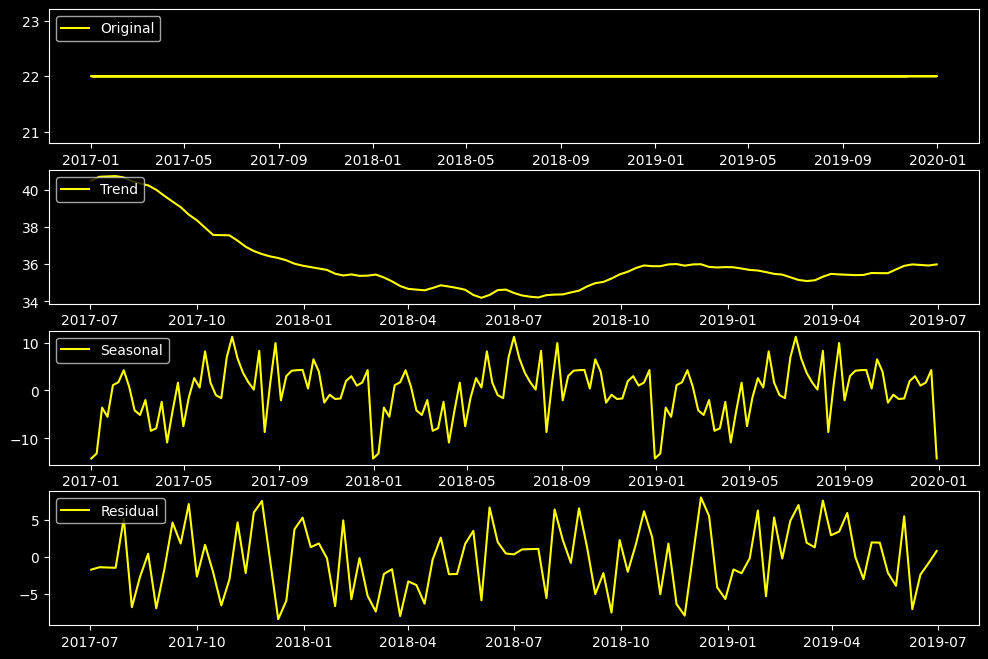

In [132]:
#Extract and plot trend, seasonal and residuals. 
from statsmodels.tsa.seasonal import seasonal_decompose 
decomposed = seasonal_decompose(weekly_accidents_22['accident_count'],  
                            model ='additive')

trend = decomposed.trend
seasonal = decomposed.seasonal
residual = decomposed.resid

plt.figure(figsize=(12,8))
plt.subplot(411)
plt.plot(df, label='Original', color='yellow')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='yellow')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='yellow')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residual', color='yellow')
plt.legend(loc='upper left')
plt.show()

In [133]:
from pmdarima.arima import auto_arima
#Autoarima gives us bet model suited for the data
# p - number of autoregressive terms (AR)
# q - Number of moving avergae terms (MA)
# d - number of non-seasonal differences
#p, d, q represent non-seasonal components
#P, D, Q represent seasonal components
arima_model = auto_arima(weekly_accidents_22['accident_count'], start_p = 1, d=0, start_q = 1, 
                          max_p = 5, max_q = 5, max_d=5, m = 52, 
                          start_P = 0, D=1, start_Q=0, max_P=5, max_D=5, max_Q=5,
                          seasonal = True, 
                          trace = True, 
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True, n_fits=50)           

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,0)[52] intercept   : AIC=760.360, Time=0.74 sec
 ARIMA(0,0,0)(0,1,0)[52] intercept   : AIC=776.872, Time=0.18 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : AIC=755.108, Time=6.21 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : AIC=inf, Time=7.86 sec
 ARIMA(0,0,0)(0,1,0)[52]             : AIC=779.805, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[52] intercept   : AIC=766.155, Time=0.48 sec
 ARIMA(1,0,0)(2,1,0)[52] intercept   : AIC=757.097, Time=12.46 sec
 ARIMA(1,0,0)(1,1,1)[52] intercept   : AIC=757.097, Time=10.89 sec
 ARIMA(1,0,0)(0,1,1)[52] intercept   : AIC=inf, Time=6.68 sec
 ARIMA(1,0,0)(2,1,1)[52] intercept   : AIC=759.097, Time=17.26 sec
 ARIMA(0,0,0)(1,1,0)[52] intercept   : AIC=758.718, Time=4.16 sec
 ARIMA(2,0,0)(1,1,0)[52] intercept   : AIC=754.935, Time=7.92 sec
 ARIMA(2,0,0)(0,1,0)[52] intercept   : AIC=765.756, Time=0.54 sec
 ARIMA(2,0,0)(2,1,0)[52] intercept   : AIC=756.927, Time=22.25 sec
 ARIMA(2,0,0)(1,1,1)[52] intercept   

In [134]:
# To print the summary 
print(arima_model.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  157
Model:             SARIMAX(1, 0, 1)x(1, 1, [], 52)   Log Likelihood                -369.994
Date:                             Sun, 13 Apr 2025   AIC                            747.988
Time:                                     13:54:26   BIC                            758.604
Sample:                                 01-01-2017   HQIC                           752.289
                                      - 12-29-2019                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9379      0.069     13.642      0.000       0.803       1.073
ma.L1         -0.7719      

In [135]:
# Splitting the dataset into train and test sets
train = weekly_accidents_22[['accident_count']][:len(weekly_accidents_22) - 52]  # All weeks before the last 7 weeks
test = weekly_accidents_22[['accident_count']][-52:]  # Last 7 weeks for prediction

In [142]:
from statsmodels.tsa.statespace.sarimax import SARIMAX 
  
model = SARIMAX(train['accident_count'],  
                order = (1, 0, 1),  
                seasonal_order =(1, 1, 0, 52)) 
  
result = model.fit()

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


<Axes: xlabel='date'>

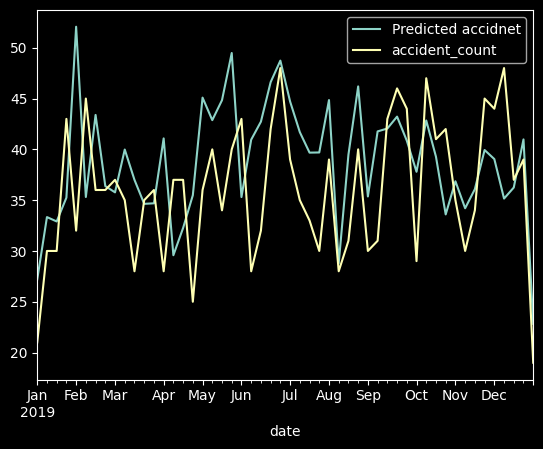

In [143]:
#Train prediction
start_index = 0
end_index = len(train)-1
train_prediction = result.predict(start_index, end_index) 

#Prediction
start_index = len(train)
end_index = len(weekly_accidents_22)-1
prediction = result.predict(start_index, end_index).rename('Predicted accidnet') 
#Rename the column

# plot predictions and actual values 
prediction.plot(legend = True) 
test['accident_count'].plot(legend = True) 

In [144]:
import math
from sklearn.metrics import mean_squared_error
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(train, train_prediction))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(test, prediction))
print('Test Score: %.2f RMSE' % (testScore))

#from sklearn.metrics import r2_score
#score = r2_score(test, prediction)
#print("R2 score is: ", score)

Train Score: 29.85 RMSE
Test Score: 7.27 RMSE


C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


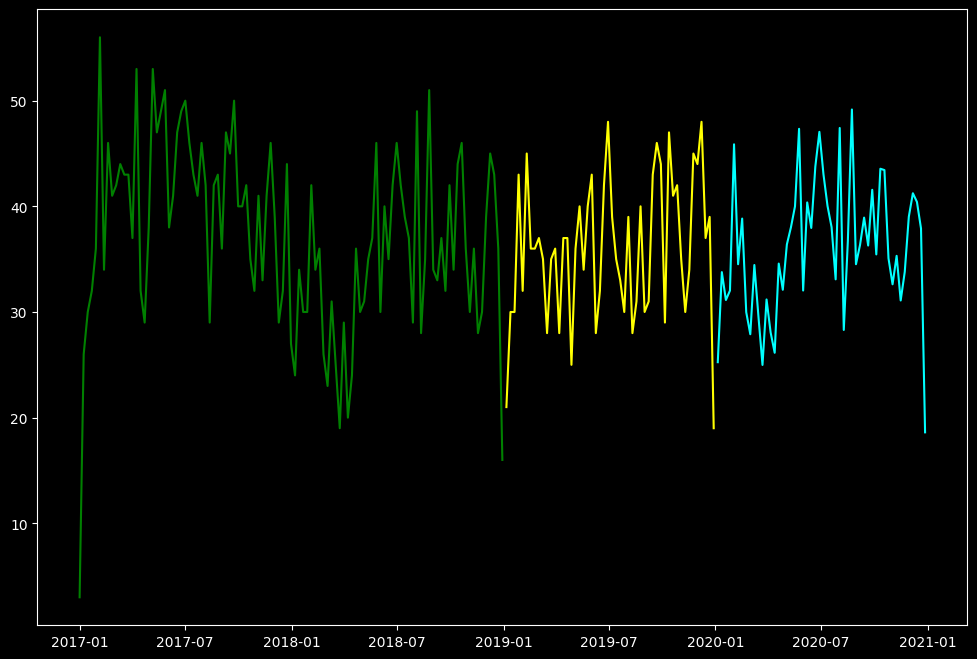

In [145]:
# Forecast for the next year 
forecast = result.predict(start = len(weekly_accidents_22),  
                          end = (len(weekly_accidents_22)-1) + 1 * 52,  
                          typ = 'levels').rename('Forecast') 
  
plt.figure(figsize=(12,8))
plt.plot(train, label='Training', color='green')
plt.plot(test, label='Test', color='yellow')
plt.plot(forecast, label='Forecast', color='cyan')
plt.show()

C:\Program Files\Python312\Lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


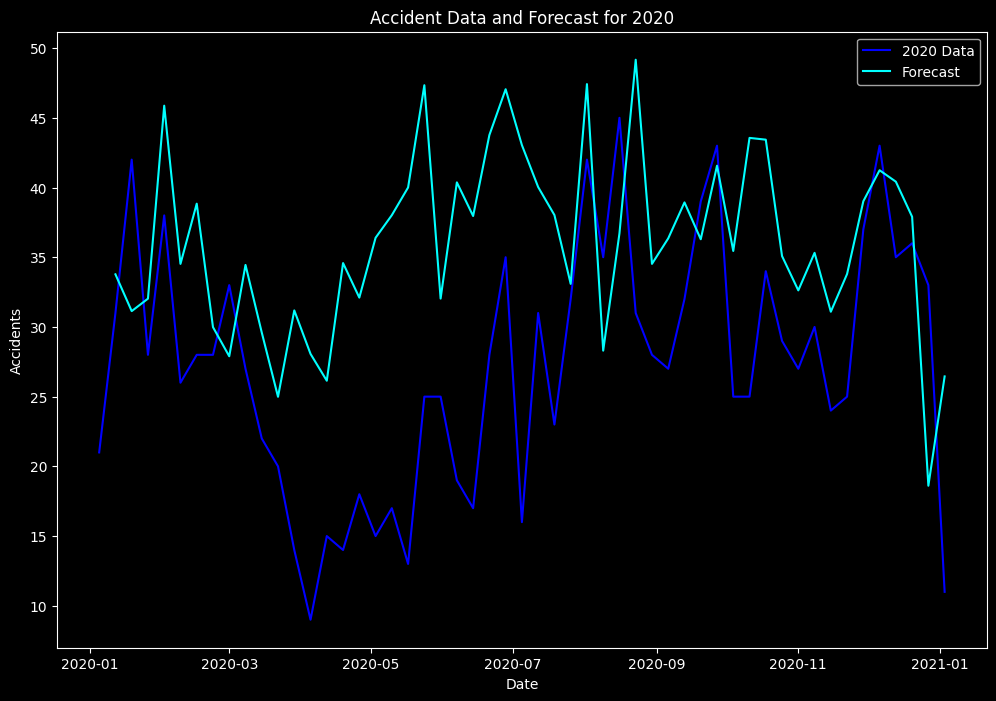

In [146]:
# Extract data for 2020 from the database
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force = 22
AND accident_year = 2020;
''')

# Fetch the results for 2020
results_2020 = cur.fetchall()

# Convert results into a DataFrame
df_2020 = pd.DataFrame(results_2020, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df_2020['date'] = pd.to_datetime(df_2020['date'], dayfirst=True)

# Resample the 2020 data weekly (if needed) and aggregate it (e.g., sum the accidents per week)
df_2020.set_index('date', inplace=True)
df_2020_weekly = df_2020.resample('W').size()  # Weekly accident counts

# Assuming you have the forecast data and want to plot it alongside the 2020 data
forecast = result.predict(start=len(weekly_accidents),  
                          end=(len(weekly_accidents)-1) + 1 * 52,  
                          typ='levels').rename('Forecast')

# Plotting the original 2020 data and forecast
plt.figure(figsize=(12,8))
plt.plot(df_2020_weekly, label='2020 Data', color='blue')  # Plot 2020 data
plt.plot(forecast, label='Forecast', color='cyan')  # Plot the forecasted data
plt.legend()
plt.title('Accident Data and Forecast for 2020')
plt.xlabel('Date')
plt.ylabel('Accidents')
plt.show()

In [147]:
# Combine 2020 weekly data and forecast into a single DataFrame
combined_df = pd.DataFrame({
   'Date': df_2020_weekly.index,
   '2020 Data': df_2020_weekly.values
})
# Reset index to have 'Date' as a column
combined_df.reset_index(drop=True, inplace=True)
# Create forecast DataFrame
forecast_df = pd.DataFrame({
   'Date': forecast.index,
   'Forecast': forecast.values
})
# Reset index of forecast
forecast_df.reset_index(drop=True, inplace=True)
# Merge the two dataframes
final_df = pd.merge(combined_df, forecast_df, on='Date', how='outer').sort_values('Date')
# Display the final table
final_df.head(52)

,Date,2020 Data,Forecast
0,2020-01-05,21,NaN
1,2020-01-12,31,33.773709
2,2020-01-19,42,31.135000
3,2020-01-26,28,32.028333
4,2020-02-02,38,45.870077
5,2020-02-09,26,34.520898
6,2020-02-16,28,38.841876
7,2020-02-23,28,29.985371
8,2020-03-01,33,27.895611
9,2020-03-08,27,34.447327


## 5)XGBRegressors

XGBoost works good with big data, so I will work on all 3 plice force together

In [3]:
#police_force code = 
# 16	Humberside Police
# 21	North Yorkshire Police
# 22	West Yorkshire Police

# Execute the query
cur.execute('''
SELECT date, police_force 
FROM accident
WHERE police_force IN (16, 21, 22)
AND accident_year BETWEEN 2017 AND 2020;
''')

# Fetch all results
results = cur.fetchall()


# Convert results into a DataFrame with proper column names
df = pd.DataFrame(results, columns=['date', 'police_force'])

# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], dayfirst=True)


df['date'] = pd.to_datetime(df['date'], dayfirst=True)
df.set_index('date', inplace=True)

# Step 3: Weekly accident count (total across all selected forces)
weekly_accidents = df.resample('W').size().reset_index(name='accident_count')

weekly_accidents

,date,accident_count
0,2017-01-01,8
1,2017-01-08,111
2,2017-01-15,132
3,2017-01-22,122
4,2017-01-29,142
...,...,...
205,2020-12-06,108
206,2020-12-13,97
207,2020-12-20,96
208,2020-12-27,71


XGBoost with a Train/Test Split 

This is a single fixed train/test split, followed by training once on the training data and evaluating once on the test set. (This is what we have learned in the workshop)

In [4]:
# Feature engineering
weekly_accidents['hour'] = weekly_accidents['date'].dt.hour  # will be 0, drop later
weekly_accidents['dayofweek'] = weekly_accidents['date'].dt.dayofweek
weekly_accidents['quarter'] = weekly_accidents['date'].dt.quarter
weekly_accidents['month'] = weekly_accidents['date'].dt.month
weekly_accidents['year'] = weekly_accidents['date'].dt.year
weekly_accidents['dayofyear'] = weekly_accidents['date'].dt.dayofyear
weekly_accidents['dayofmonth'] = weekly_accidents['date'].dt.day
weekly_accidents['weekofyear'] = weekly_accidents['date'].dt.isocalendar().week


#Add lag features
weekly_accidents['lag1'] = weekly_accidents['accident_count'].shift(1)
weekly_accidents['lag2'] = weekly_accidents['accident_count'].shift(2)
weekly_accidents['rolling_mean_3'] = weekly_accidents['accident_count'].rolling(3).mean()

#Drop missing values (caused by lag features)
weekly_accidents.dropna(inplace=True)

#Define features and target
features = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 
            'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'rolling_mean_3']
X = weekly_accidents[features]
y = weekly_accidents['accident_count']

In [5]:
from sklearn.model_selection import train_test_split

# Step 8: Time-based train-test split (70/30)
split_index = int(len(X) * 0.7)
X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]

In [6]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor, plot_importance
import warnings
warnings.filterwarnings("ignore")

In [7]:
#1) Convert the data into DMatrix format for XGBoost

In [8]:
#XGBoost model training
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Define the parameters
params = {
    'objective': 'reg:squarederror',  # Regression task
    'eval_metric': 'rmse',  # Evaluation metric
    'max_depth': 6,  # Maximum depth of trees
    'learning_rate': 0.1,  # Learning rate
    'n_estimators': 1000  # Number of boosting rounds
}

# Set up the evaluation data for early stopping
evals = [(dtrain, 'train'), (dtest, 'test')]

# Train the model using xgb.train()
bst = xgb.train(params, dtrain, num_boost_round=1000, evals=evals, early_stopping_rounds=50, verbose_eval=False)

# Evaluation
train_pred = bst.predict(dtrain)
test_pred = bst.predict(dtest)

rmse_train = np.sqrt(mean_squared_error(y_train, train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, test_pred))

print(f"Training RMSE: {rmse_train:.2f}")
print(f"Testing RMSE: {rmse_test:.2f}")

Training RMSE: 0.11
Testing RMSE: 26.70


<Figure size 1000x600 with 0 Axes>

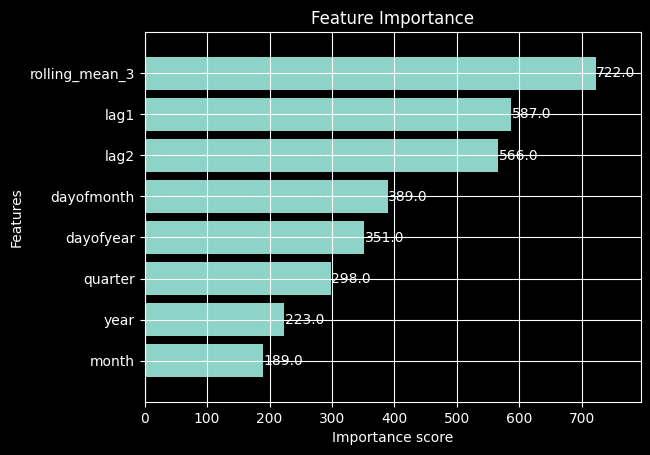

In [9]:
# Feature Importance
plt.figure(figsize=(10, 6))
xgb.plot_importance(bst, importance_type='weight', max_num_features=10, height=0.8)
plt.title('Feature Importance')
plt.show()

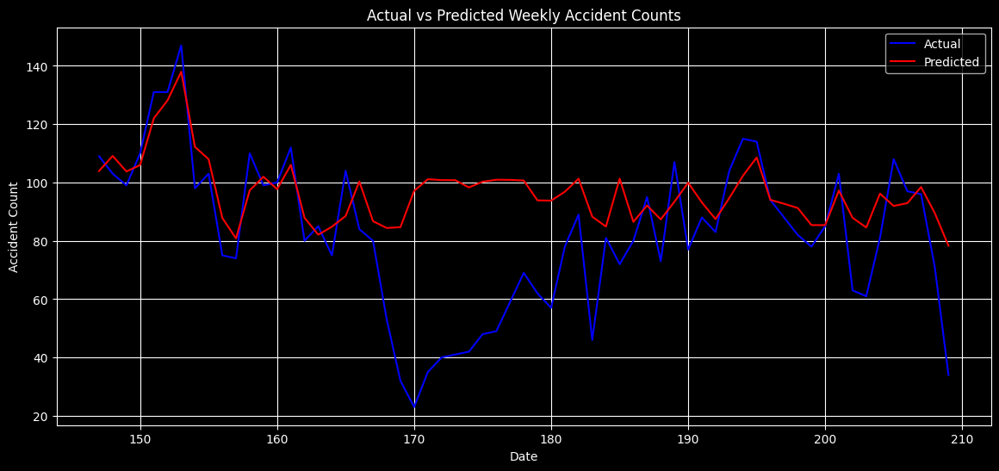

In [10]:
# Actual vs Predicted Plot
plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test, label='Actual', color='blue')
plt.plot(y_test.index, test_pred, label='Predicted', color='red')
plt.title('Actual vs Predicted Weekly Accident Counts')
plt.xlabel('Date')
plt.ylabel('Accident Count')
plt.legend()
plt.grid(True)
plt.show()

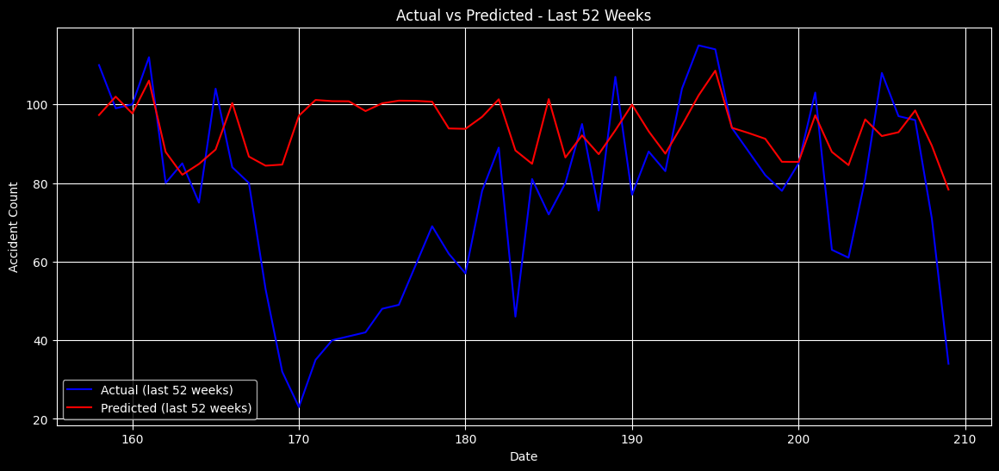

,date,actual,predicted
0,158,110,97.288177
1,159,99,101.967850
2,160,100,97.679047
3,161,112,106.035255
4,162,80,87.899529
5,163,85,82.096352
6,164,75,84.838036
7,165,104,88.508835
8,166,84,100.338829
9,167,80,86.715645


In [14]:
# Get the last 52 weeks of actual and predicted values
last_52_actual = y_test[-52:]
last_52_predicted = test_pred[-52:]

# Plot last 52 weeks
plt.figure(figsize=(14, 6))
plt.plot(last_52_actual.index, last_52_actual, label='Actual (last 52 weeks)', color='blue')
plt.plot(last_52_actual.index, last_52_predicted, label='Predicted (last 52 weeks)', color='red')
plt.title('Actual vs Predicted - Last 52 Weeks')
plt.xlabel('Date')
plt.ylabel('Accident Count')
plt.legend()
plt.grid(True)
plt.show()


# Combine into a DataFrame
last_52_df = pd.DataFrame({
    'date': last_52_actual.index,
    'actual': last_52_actual.values,
    'predicted': last_52_predicted
})

# Reset index if needed
last_52_df.reset_index(drop=True, inplace=True)

# Display
last_52_df

In [15]:
# 2)Convert a Time Series to a Supervised Learning Problem
# time series forecasting setup with walk-forward validation

 Manual Walk-Forward Validation
 
Trains a new model at each step using all available data up to that point.

Simulates a real-world forecasting situation where new data becomes available each week.

Brownlee, J. (2021) How to Use XGBoost for Time Series Forecasting. Available at: https://machinelearningmastery.com/xgboost-for-time-series-forecasting/ (Accessed: 2 April 2025). 

In [11]:
from xgboost import XGBRegressor

>expected=110.00, predicted=80.67
>expected=99.00, predicted=119.33
>expected=100.00, predicted=103.34
>expected=112.00, predicted=103.05
>expected=80.00, predicted=84.42
>expected=85.00, predicted=119.76
>expected=75.00, predicted=98.70
>expected=104.00, predicted=77.35
>expected=84.00, predicted=94.88
>expected=80.00, predicted=98.21
>expected=53.00, predicted=88.97
>expected=32.00, predicted=109.92
>expected=23.00, predicted=110.24
>expected=35.00, predicted=110.03
>expected=40.00, predicted=25.21
>expected=41.00, predicted=38.01
>expected=42.00, predicted=39.72
>expected=48.00, predicted=40.69
>expected=49.00, predicted=45.28
>expected=59.00, predicted=47.57
>expected=69.00, predicted=67.08
>expected=62.00, predicted=95.35
>expected=57.00, predicted=69.70
>expected=78.00, predicted=34.37
>expected=89.00, predicted=103.57
>expected=46.00, predicted=97.41
>expected=81.00, predicted=48.22
>expected=72.00, predicted=98.33
>expected=80.00, predicted=66.62
>expected=95.00, predicted=71.5

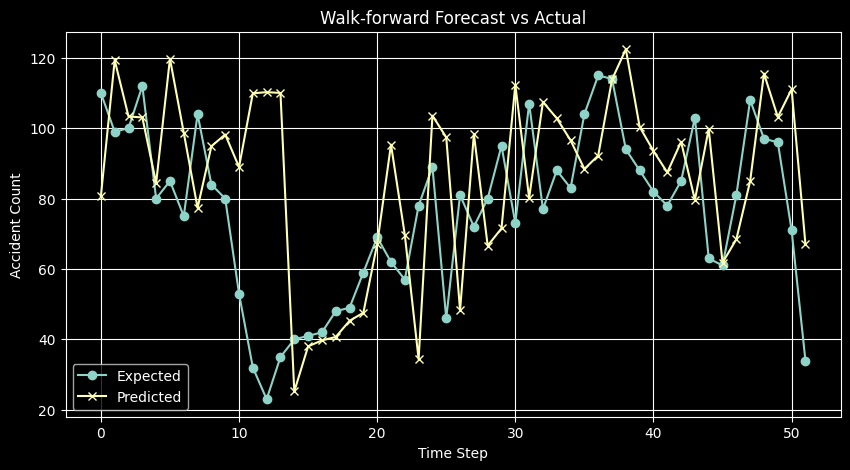

In [12]:
# Converts a time series into supervised learning format
def series_to_supervised(series, n_lags=1):
    df = pd.DataFrame(series)
    columns = []
    
    for i in range(n_lags, 0, -1):
        columns.append(df.shift(i))
    
    columns.append(df)
    df_supervised = pd.concat(columns, axis=1)
    df_supervised.dropna(inplace=True)
    
    return df_supervised.values  # Return as numpy array for modeling

# Time-aware train/test split
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:]

# Forecast with XGBoost
def xgboost_forecast(train, testX):
    X_train, y_train = train[:, :-1], train[:, -1]
    model = XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=3)
    model.fit(X_train, y_train)
    yhat = model.predict(np.array([testX]))
    return yhat[0]

# Walk-forward validation
def walk_forward_validation(data, n_test):
    predictions = list()
    train, test = train_test_split(data, n_test)
    history = [x for x in train]

    for i in range(len(test)):
        testX, testy = test[i, :-1], test[i, -1]
        history_array = np.array(history)
        yhat = xgboost_forecast(history_array, testX)
        predictions.append(yhat)
        history.append(test[i])  # add actual observation to history
        print(f'>expected={testy:.2f}, predicted={yhat:.2f}')

    test_rmse = np.sqrt(mean_squared_error(test[:, -1], predictions))
    train_rmse = np.sqrt(mean_squared_error(train[:, -1], train[:, -1]))  # same as std dev, since predicted = actual

    return train_rmse, test_rmse, predictions, test[:, -1]


series = weekly_accidents['accident_count']

# Convert to supervised format
data_supervised = series_to_supervised(series, n_lags=1)

# Walk-forward validation
n_test = 52  # forecast last 52 weeks
train_rmse, test_rmse, yhat, y = walk_forward_validation(data_supervised, n_test)

print(f'Train RMSE: {train_rmse:.2f}')
print(f'Test RMSE: {test_rmse:.2f}')

# Plot predictions vs expected
pyplot.figure(figsize=(10, 5))
pyplot.plot(y, label='Expected', marker='o')
pyplot.plot(yhat, label='Predicted', marker='x')
pyplot.title('Walk-forward Forecast vs Actual')
pyplot.xlabel('Time Step')
pyplot.ylabel('Accident Count')
pyplot.legend()
pyplot.grid(True)
pyplot.show()

# Q7

### autoArima

In [16]:
cur.execute('select date from accident limit 5')


h_data = cur.fetchall()
print (h_data)

[('05/08/2017',), ('01/01/2017',), ('01/01/2017',), ('01/01/2017',), ('01/01/2017',)]


In [17]:
cur.execute('''
SELECT STRFTIME('%Y-%m-%d',SUBSTR(date, 7,4) || '-' || SUBSTR(date, 4, 2) || '-'|| SUBSTR(date, 1,2))
from accident
limit 5;
''')

# Fetch the results
dfff = cur.fetchall()
dfff


[('2017-08-05',),
 ('2017-01-01',),
 ('2017-01-01',),
 ('2017-01-01',),
 ('2017-01-01',)]

In [19]:
# Execute the query
cur.execute('''
SELECT accident.lsoa_of_accident_location, COUNT(*) AS accident_count
FROM accident
JOIN lsoa ON lsoa.lsoa01cd = accident.lsoa_of_accident_location
WHERE lsoa.lsoa01nm LIKE '%kingston upon hull%'
AND STRFTIME('%Y-%m-%d', SUBSTR(date, 7,4) || '-' || SUBSTR(date, 4, 2) || '-' || SUBSTR(date, 1,2)) 
    BETWEEN '2020-01-01' AND '2020-03-31'
GROUP BY accident.lsoa_of_accident_location;
''')

# Fetch the results
top_lsoa = cur.fetchall()

# Convert to DataFrame
top_lsoa_df = pd.DataFrame(top_lsoa, columns=['LSOA','accident_count'])

top_3_lsoa = top_lsoa_df.sort_values(by='accident_count', ascending=False).head(3)

# Display the top 3
print(top_3_lsoa)


         LSOA  accident_count
34  E01012817              10
43  E01012848               7
70  E01012889               7


In [20]:
cur.execute('''
SELECT STRFTIME('%Y-%m-%d', SUBSTR(date, 7,4) || '-' || SUBSTR(date, 4, 2) || '-' || SUBSTR(date, 1,2)) AS formatted_date, 
       COUNT(*) AS accident_count
FROM accident
JOIN lsoa ON lsoa.lsoa01cd = accident.lsoa_of_accident_location
WHERE lsoa.lsoa01cd IN ('E01012817', 'E01012889', 'E01012848')
AND formatted_date BETWEEN '2020-01-01' AND '2020-06-30'
GROUP BY formatted_date
''')

# Fetch the data
time_series_data = cur.fetchall()
time_series_data


[('2020-01-02', 2),
 ('2020-01-03', 1),
 ('2020-01-10', 2),
 ('2020-01-13', 1),
 ('2020-01-17', 1),
 ('2020-01-22', 2),
 ('2020-01-23', 1),
 ('2020-02-03', 1),
 ('2020-02-11', 2),
 ('2020-02-16', 1),
 ('2020-02-18', 1),
 ('2020-02-24', 1),
 ('2020-02-25', 1),
 ('2020-02-26', 1),
 ('2020-02-27', 1),
 ('2020-03-11', 1),
 ('2020-03-13', 1),
 ('2020-03-17', 1),
 ('2020-03-26', 1),
 ('2020-03-30', 1),
 ('2020-04-15', 1),
 ('2020-04-20', 1),
 ('2020-05-01', 1),
 ('2020-06-09', 1),
 ('2020-06-13', 1),
 ('2020-06-30', 1)]

In [21]:
# Convert to DataFrame
df = pd.DataFrame(time_series_data, columns=['date', 'count'])
df['date'] = pd.to_datetime(df['date'])

# Aggregate daily accident counts without LSOA
daily_accidents = df.set_index('date').resample('D').sum()  # Resample to daily and sum counts

# Print the result
daily_accidents

,count
date,
2020-01-02,2
2020-01-03,1
2020-01-04,0
2020-01-05,0
2020-01-06,0
...,...
2020-06-26,0
2020-06-27,0
2020-06-28,0


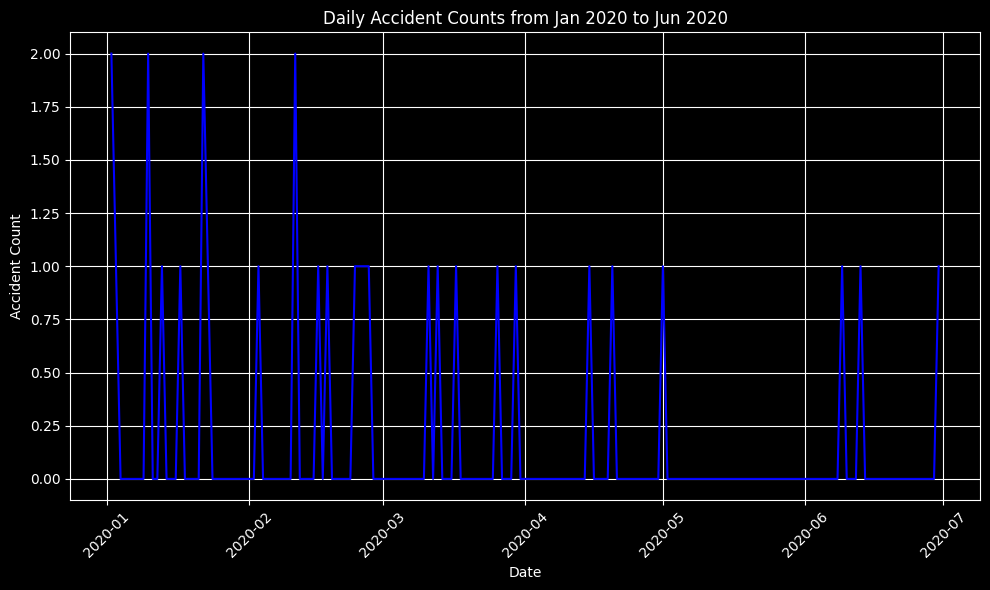

In [22]:
import matplotlib.pyplot as plt

# Plot the daily accident counts
plt.figure(figsize=(10, 6))  # Set the figure size
plt.plot(daily_accidents.index, daily_accidents['count'], label='Daily Accident Count', color='blue')  # Plot the data
plt.title('Daily Accident Counts from Jan 2020 to Jun 2020')  # Set the title
plt.xlabel('Date')  # Set the x-axis label
plt.ylabel('Accident Count')  # Set the y-axis label
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)  # Add grid for better visibility
plt.tight_layout()  # Adjust layout for better spacing
plt.show()  # Show the plot


In [23]:
from statsmodels.tsa.stattools import adfuller

ADF_test = adfuller(daily_accidents['count'])
print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -12.90153038518428; p-value 4.238080061272322e-24


In [24]:
from pmdarima.arima import auto_arima

# Auto-ARIMA to find the best model
arima_model = auto_arima(daily_accidents['count'], start_p=1, d = 0, start_q=1, 
                          max_p=5, max_q=5, max_d=0, m=7,  # Daily data with weekly seasonality
                          start_P=0, D=1, start_Q=0, max_P=5, max_D=5, max_Q=5,
                          seasonal=True, 
                          trace=True, 
                          error_action='ignore',   
                          suppress_warnings=True,  
                          stepwise=True, 
                          n_fits=50)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,0)[7] intercept   : AIC=304.315, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=300.455, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=264.618, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=298.526, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=302.396, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=236.509, Time=0.17 sec
 ARIMA(1,0,0)(3,1,0)[7] intercept   : AIC=235.970, Time=0.27 sec
 ARIMA(1,0,0)(4,1,0)[7] intercept   : AIC=225.211, Time=0.89 sec
 ARIMA(1,0,0)(5,1,0)[7] intercept   : AIC=226.987, Time=1.29 sec
 ARIMA(1,0,0)(4,1,1)[7] intercept   : AIC=226.454, Time=1.78 sec
 ARIMA(1,0,0)(3,1,1)[7] intercept   : AIC=237.892, Time=0.65 sec
 ARIMA(1,0,0)(5,1,1)[7] intercept   : AIC=227.882, Time=4.24 sec
 ARIMA(0,0,0)(4,1,0)[7] intercept   : AIC=223.283, Time=0.78 sec
 ARIMA(0,0,0)(3,1,0)[7] intercept   : AIC=233.975, 

In [25]:
# Summary of the best ARIMA model
print(arima_model.summary())

                                SARIMAX Results                                
Dep. Variable:                       y   No. Observations:                  181
Model:             SARIMAX(4, 1, 0, 7)   Log Likelihood                -106.239
Date:                 Sun, 13 Apr 2025   AIC                            222.479
Time:                         16:09:44   BIC                            238.274
Sample:                     01-02-2020   HQIC                           228.886
                          - 06-30-2020                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L7       -0.7639      0.066    -11.601      0.000      -0.893      -0.635
ar.S.L14      -0.6497      0.082     -7.930      0.000      -0.810      -0.489
ar.S.L21      -0.3469      0.078     -4.471 

In [28]:
# split the data

size = int(len(daily_accidents) * 0.66)

x_train, x_test = daily_accidents[0:size], daily_accidents[size:len(daily_accidents)]

SARIMAX(4, 1, 0, 7)
This means:

ARIMA part: (p=4, d=1, q=0)

Seasonal part: (P=0, D=0, Q=0, m=7) 

In [26]:
#fit SARIMAX
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [30]:
sarimax_model = SARIMAX(x_train['count'], order = (4, 1, 0) , seasonal_order=(0, 0, 0, 7),  # (P, D, Q, s) 
    enforce_stationarity=False, 
    enforce_invertibility=False
)

sarimax_results = sarimax_model.fit()

In [31]:
#Train prediction
start_index = 0
end_index = len(x_train)-1
train_prediction = sarimax_results.predict(start_index, end_index) 

#Prediction
start_index = len(x_train)
end_index = len(daily_accidents)-1
prediction = sarimax_results.predict(start_index, end_index).rename('Predicted accidents') 

<Axes: xlabel='date'>

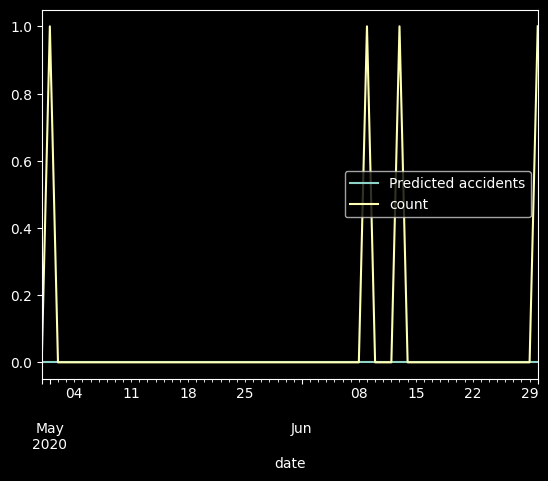

In [32]:
prediction.plot(legend = True) 
x_test['count'].plot(legend = True)

Train Score: 0.56 RMSE
Test Score: 0.25 RMSE


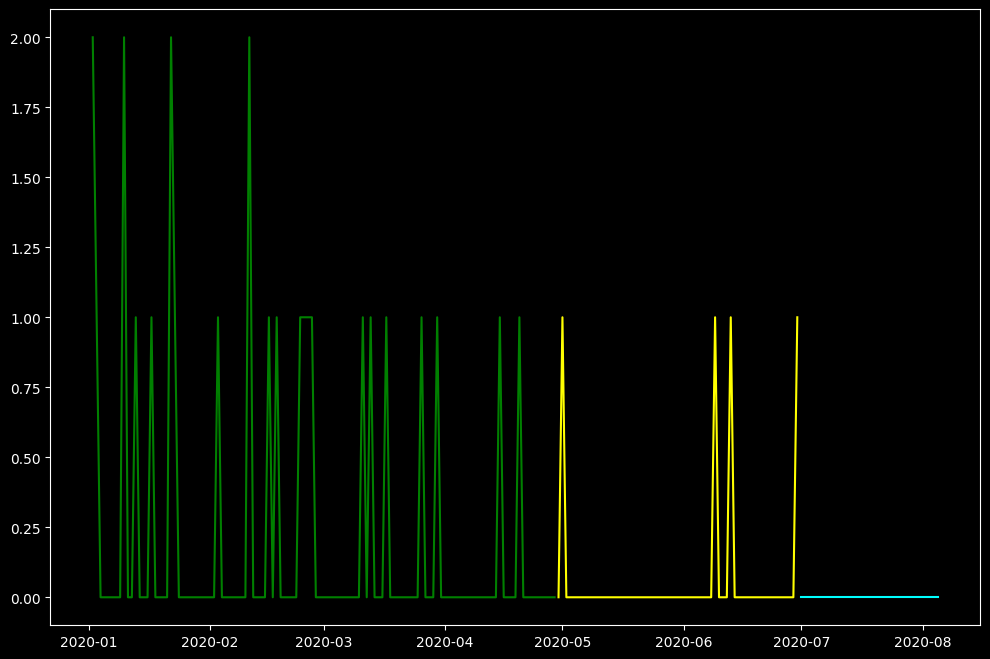

In [33]:
import math
from sklearn.metrics import mean_squared_error
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(x_train, train_prediction))
print('Train Score: %.2f RMSE' % (trainScore))
# If 'prediction' is longer than 'x_test', slice 'prediction' to match 'x_test'
prediction = prediction[:len(x_test)]

# Then compute the error
testScore = math.sqrt(mean_squared_error(x_test, prediction))
print('Test Score: %.2f RMSE' % (testScore))


#from sklearn.metrics import r2_score
#score = r2_score(X_test, prediction)
#print("R2 score is: ", score)

#Forecast.. You can re-train on the entire dataset before forecasting
#For now let us use the trained model
# Forecast for the next 3 years 
forecast = sarimax_results.predict(start = len(daily_accidents),  
                          end = (len(daily_accidents)-1) + 3 * 12,  
                          typ = 'levels').rename('Forecast') 
  
plt.figure(figsize=(12,8))
plt.plot(x_train, label='Training', color='green')
plt.plot(x_test, label='Test', color='yellow')
plt.plot(forecast, label='Forecast', color='cyan')
plt.show()


         date  actual_count  forecast_count
0  2020-07-01           0.0    1.345812e-18
1  2020-07-02           0.0    1.345812e-18
2  2020-07-03           0.0    1.345812e-18
3  2020-07-04           0.0    1.345812e-18
4  2020-07-05           0.0    1.345812e-18
5  2020-07-06           0.0    1.345812e-18
6  2020-07-07           0.0    1.345812e-18
7  2020-07-08           0.0    1.345812e-18
8  2020-07-09           0.0    1.345812e-18
9  2020-07-10           0.0    1.345812e-18
10 2020-07-11           0.0    1.345812e-18
11 2020-07-12           2.0    1.345812e-18
12 2020-07-13           1.0    1.345812e-18
13 2020-07-14           0.0    1.345812e-18
14 2020-07-15           0.0    1.345812e-18
15 2020-07-16           0.0    1.345812e-18
16 2020-07-17           1.0    1.345812e-18
17 2020-07-18           0.0    1.345812e-18
18 2020-07-19           0.0    1.345812e-18
19 2020-07-20           0.0    1.345812e-18
20 2020-07-21           0.0    1.345812e-18
21 2020-07-22           0.0    1

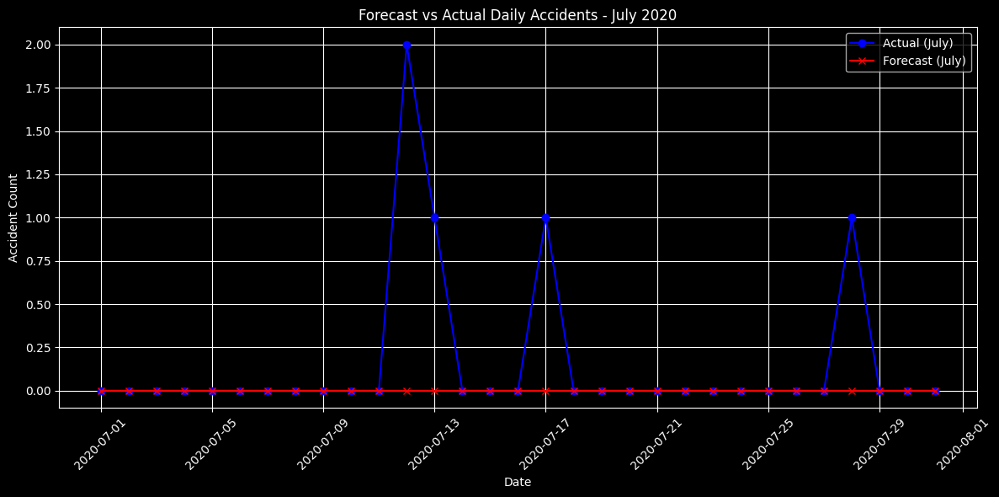

In [34]:
cur.execute('''
SELECT STRFTIME('%Y-%m-%d', SUBSTR(date, 7,4) || '-' || SUBSTR(date, 4, 2) || '-' || SUBSTR(date, 1,2)) AS formatted_date, 
       COUNT(*) AS accident_count
FROM accident
JOIN lsoa ON lsoa.lsoa01cd = accident.lsoa_of_accident_location
WHERE lsoa.lsoa01cd IN ('E01012817', 'E01012889', 'E01012848')
AND formatted_date BETWEEN '2020-07-01' AND '2020-07-31'
GROUP BY formatted_date
ORDER BY formatted_date;
''')

july_data = cur.fetchall()

# Convert to DataFrame
july_df = pd.DataFrame(july_data, columns=['date', 'actual_count'])
july_df['date'] = pd.to_datetime(july_df['date'])



# Create date range for forecast to align with July
forecast_dates = pd.date_range(start='2020-07-01', end='2020-07-31')

# Slice the first 31 days of the forecast
july_forecast = forecast[:31]

# Create DataFrame for forecast
forecast_df = pd.DataFrame({
    'date': forecast_dates,
    'forecast_count': july_forecast.values
})



# Merge actual and forecast by date
comparison_df = pd.merge(july_df, forecast_df, on='date', how='outer')

# Fill any missing values if needed
comparison_df.fillna(0, inplace=True)

# Display table
print(comparison_df)


plt.figure(figsize=(12, 6))
plt.plot(comparison_df['date'], comparison_df['actual_count'], label='Actual (July)', marker='o', color='blue')
plt.plot(comparison_df['date'], comparison_df['forecast_count'], label='Forecast (July)', marker='x', color='red')
plt.title('Forecast vs Actual Daily Accidents - July 2020')
plt.xlabel('Date')
plt.ylabel('Accident Count')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Q8, Q9, Q10 Social Network

In [35]:
import networkx as nx

In [41]:
# import .txt file
FielName="facebook_combined.txt"
#Graphtype=net.DiGraph()   # use net.Graph() for undirected graph
Graphtype=nx.Graph() # undirected graph

#reading from a file. Note: if your egde weights are int, 
# change float to int.
G = nx.read_edgelist(
    FielName, 
    create_using=Graphtype,
    nodetype=int,
    data=(('weight',float),)
)

In [42]:
# Find the total number of degree for each node
for x in list(G.nodes())[:5]:  # only print first 5 for readability
    print("Node:", x, "has total #degree:", G.degree(x))


Node: 0 has total #degree: 347
Node: 1 has total #degree: 17
Node: 2 has total #degree: 10
Node: 3 has total #degree: 17
Node: 4 has total #degree: 10


In [43]:
# Calculate basic network statistics
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
density = nx.density(G)
average_degree = sum(dict(G.degree()).values()) / num_nodes  # Calculating the average degree
print("Basic Network Statistics:")
print(f"Number of Nodes: {num_nodes}")
print(f"Number of Edges: {num_edges}")
print(f"Density: {density}")
print(f"Average Degree: {average_degree}")

Basic Network Statistics:
Number of Nodes: 4039
Number of Edges: 88234
Density: 0.010819963503439287
Average Degree: 43.69101262688784


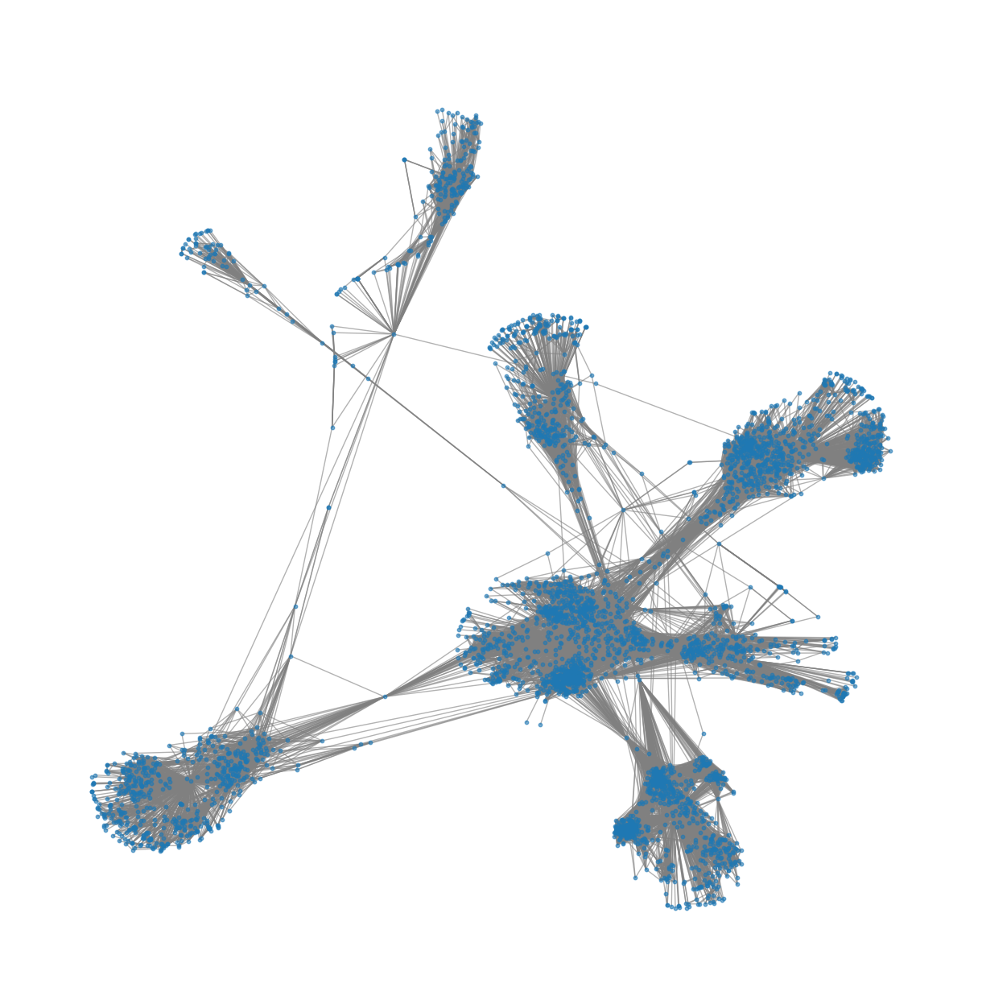

In [44]:
# Visualize the network
plt.figure(figsize=(12, 12))
nx.draw(G, node_size=10, with_labels=False, alpha=0.6, edge_color="gray")
plt.title("Social Network Visualization")
plt.show()

Edge Betweenness Centrality measures how important an edge is in connecting different parts of the network.


Edges with the Highest Edge Betweenness Centrality:
(107, 1684): 0.1715
(107, 1085): 0.1297
(1085, 3437): 0.0966
(567, 3437): 0.0922
(0, 107): 0.0884


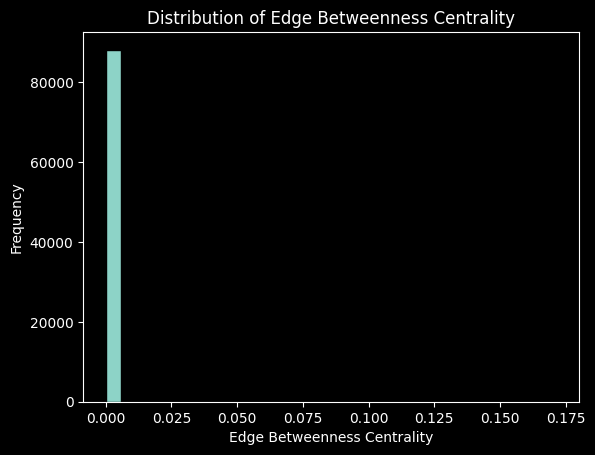

In [45]:
# Calculate edge betweenness centrality
edge_betweenness = nx.edge_betweenness_centrality(G)

# Extract centrality values
centrality_values = list(edge_betweenness.values())

# Get top 5 edges with highest centrality
highest_edge_betweenness_edges = sorted(edge_betweenness.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nEdges with the Highest Edge Betweenness Centrality:")

for edge, centrality in highest_edge_betweenness_edges:
    print(f"{edge}: {centrality:.4f}")

# Plot the distribution
plt.hist(centrality_values, bins=30, edgecolor='black')
plt.title('Distribution of Edge Betweenness Centrality')
plt.xlabel('Edge Betweenness Centrality')
plt.ylabel('Frequency')
plt.show()


Closeness Centrality measures how central a node is in terms of its distance to other nodes.


Nodes with the Highest Closeness Centrality:
107: 0.4597
58: 0.3974
428: 0.3948
563: 0.3939
1684: 0.3936


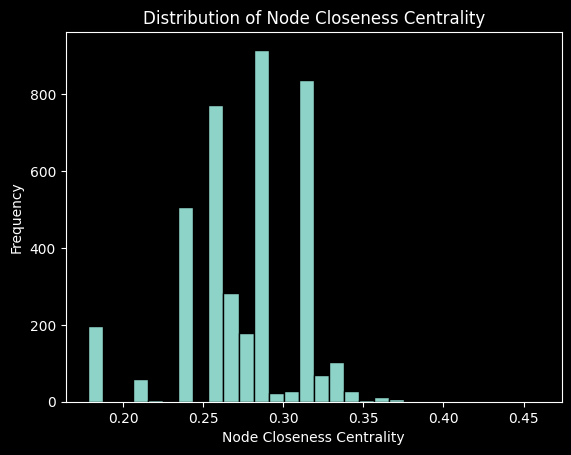

In [47]:
# Calculate closeness centrality for each node
closeness_centrality = nx.closeness_centrality(G)

# Extract centrality values
node_centrality_values = list(closeness_centrality.values())

# Get top 5 nodes with highest closeness centrality
highest_closeness_nodes = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nNodes with the Highest Closeness Centrality:")

for node, centrality in highest_closeness_nodes:
    print(f"{node}: {centrality:.4f}")

# Plot the distribution of closeness centrality
plt.hist(node_centrality_values, bins=30, edgecolor='black')
plt.title('Distribution of Node Closeness Centrality')
plt.xlabel('Node Closeness Centrality')
plt.ylabel('Frequency')
plt.show()

Community Detection Analysis


Applying Community Detection Algorithms:

Use community detection algorithms to identify clusters or communities within the network.
Explore the modularity and cohesion of these communities

In [48]:
# apply community detection algorithm
communities = nx.algorithms.community.greedy_modularity_communities(G)

# explore the modulariy and cohesion of communities
modularity = nx.algorithms.community.modularity(G, communities)
num_communities = len(communities)

average_community_size = sum(len(community) for community in communities) / num_communities

print("Community Detection Result:")
print(f"Number of Communities: {num_communities}")
print(f"Average Community Size: {average_community_size}")
print(f"Modularity: {modularity}")

Community Detection Result:
Number of Communities: 13
Average Community Size: 310.6923076923077
Modularity: 0.7773775199040279


In [81]:
# community algortihms
algorithms = ["Louvian Modularity", "Label Propagation"]

In [82]:
# Dictionary to store communities detected by each algorithm
detected_communities = {}

In [83]:
# Apply each community detection algorithm and store the detected
communities
for algorithm in algorithms:
    if algorithm == "Louvian Modularity":
        communities = nx.algorithms.community.greedy_modularity_communities(G)
    elif algorithm == "Label Propagation":
        communities = nx.algorithms.community.label_propagation_communities(G)
    detected_communities[algorithm] = communities
print(detected_communities)
print ('community detection done')

{'Louvian Modularity': [frozenset({1061, 1239, 1271, 3313, 1285, 1290, 3326, 1301, 3337, 3340, 3347, 3355, 1323, 3360, 1329, 3365, 1330, 3368, 3370, 2661, 2662, 2665, 2667, 2668, 2671, 2672, 2674, 2675, 2677, 2678, 1346, 2682, 2684, 2685, 2686, 2687, 2688, 2690, 2691, 2692, 2693, 2696, 2697, 2700, 2701, 2702, 3386, 2707, 2708, 2709, 2711, 2712, 2713, 2714, 2715, 2716, 2718, 2719, 2720, 2721, 2722, 2723, 2724, 2725, 2727, 2728, 2730, 2732, 2733, 2734, 2735, 2736, 2737, 2739, 2742, 2744, 2747, 2748, 2751, 2752, 2753, 2758, 2759, 2760, 2762, 2764, 2765, 2768, 2770, 2771, 2772, 2775, 2776, 2778, 2779, 2780, 2781, 3402, 2783, 2784, 2785, 3403, 2787, 2788, 2790, 2791, 2792, 2793, 2795, 2796, 2797, 3405, 2799, 2801, 2802, 2803, 2804, 2805, 2808, 2811, 2812, 2813, 2816, 2818, 2819, 2820, 2822, 2823, 2824, 2825, 2826, 2828, 2829, 2830, 2831, 2832, 2833, 2836, 2840, 2841, 2842, 2843, 2844, 2845, 2846, 2847, 2848, 2849, 2853, 2855, 2856, 2857, 2858, 2859, 2860, 2861, 2863, 2865, 2868, 2869, 2870,

In [84]:
# Evaluate and compare the results
for algorithm, communities in detected_communities.items():
    modularity = nx.algorithms.community.modularity(G, communities)
    num_communities = len(communities) 
    average_community_size = sum(len(community) for community in communities) / num_communities
    print(f"{algorithm}:")
    print(f"Modularity: {modularity}")
    print(f"Number of Communities: {num_communities}")
    print(f"Average Community Size: {average_community_size}\n")


Louvian Modularity:
Modularity: 0.7773775199040279
Number of Communities: 13
Average Community Size: 310.6923076923077

Label Propagation:
Modularity: 0.7368407345348215
Number of Communities: 44
Average Community Size: 91.79545454545455



Interpretation:
Louvain seems to produce a stronger community structure (higher modularity) but fewer, larger communities.

Label Propagation produces a less cohesive structure (lower modularity) but with more, smaller communities.

Which algorithm is better?

Louvain is often preferred when you're looking for a more cohesive community structure with larger communities. It tends to optimize for strong modularity, which is useful in many cases where you want clearer and stronger divisions.

Label Propagation might be useful when you want more granular, smaller communities, even though the modularity might be slightly lower. It can be helpful when the network structure is less clear, and you want to detect more subtle divisions.

In conclusion, both algorithms offer valid results, but Louvain tends to provide better community quality (higher modularity), while Label Propagation tends to offer more communities with less cohesiveness. Your choice depends on whether you value stronger community cohesion or more, smaller divisions in the network.

In [86]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


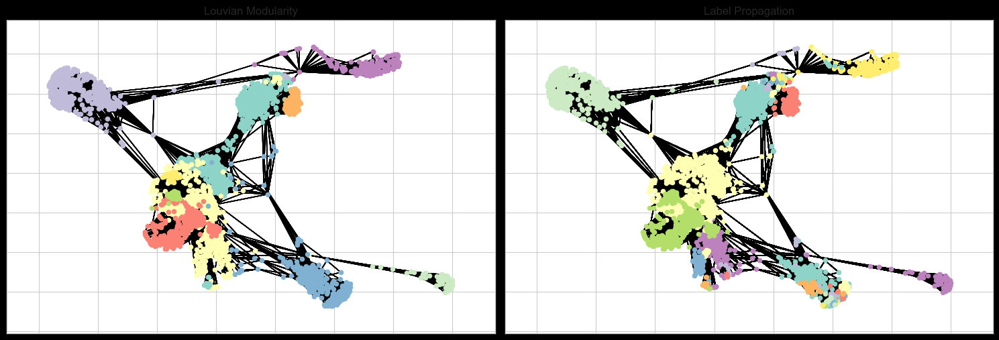

In [87]:
# Visualize community structures
plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G)

# Set the style to 'seaborn-v0_8-whitegrid' for a light background with gridlines
plt.style.use('seaborn-v0_8-whitegrid')

for i, (algorithm, communities) in enumerate(detected_communities.items()):
    plt.subplot(2, 2, i + 1)
    colors = [f'C{i}' for i in range(len(communities))]
    
    for j, community in enumerate(communities):
        nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=colors[j], node_size=20)
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        
        plt.title(algorithm)
        plt.tight_layout()
# show the visualization
plt.show()